In [1]:
### Prepare module structure ###

import sys
sys.path.append('../')

In [2]:
### IMPORT ###

import numpy as np
import math
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

import time

import matplotlib.pyplot as plt
%matplotlib inline

from util import *
from data import *
import models

# auto reload imports on local changes
%load_ext autoreload
%autoreload 2
print(torch.__version__)

1.0.0


In [3]:
### Check device ###

USE_GPU = True

dtype = torch.float32

if USE_GPU and torch.cuda.is_available():
    # TODO: Change to CPU used!
    device = torch.device('cuda:1')
else:
    device = torch.device('cpu')

print('using device:', device)

using device: cuda:1


fashion


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


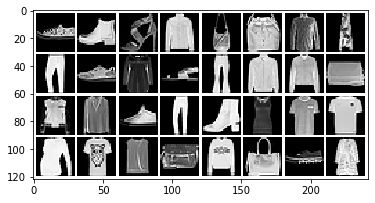

torch.Size([32, 1, 28, 28])


In [5]:
### LOAD DATA ###
dataset = 'fashion'
dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=32)

sample = next(iter(dataloader['train']))
plot_grid(sample)
print(sample.shape)
sample_ft =  torch.rfft(sample, 2, onesided=False)
sample_magnitudes = torch.sqrt(torch.sum(sample_ft**2, -1))

In [6]:
### Test VAE ###

def test_model(model, device, testloader):
    # put model to eval mode
    model.eval()
    model.to(device)
    
    # move test images to device and reduce to magnitude information in fourier space
    test_images = []
    test_recon = []
    
    for data in testloader:
        data = data.to(device=device)

        outputs_recon, _, _ = model(data)

        test_images.append(data.cpu().numpy())
        test_recon.append(outputs_recon.detach().cpu().numpy())
    
    return np.concatenate(test_recon), np.concatenate(test_images)

In [7]:
# Define loss

def loss(out_image, in_image, alpha=2.0):
    return torch.mean(torch.abs(out_image - in_image) ** alpha)

def reg(mu, sigma):
    return torch.mean(sigma ** 2 + mu ** 2 - 2 * torch.log(sigma) - 1)

In [8]:
### DEFINE MODEL ###

latent_dim = 128
hidden_dim = 2048

vae = models.SignalVAE(shape=imsize, latent_dim=latent_dim, hidden_dim=hidden_dim)

Version 4


In [9]:
# Set training parameters

alpha_loss = 1.0
gamma = 1e-3 # 1e-3

optimizer = optim.Adam(vae.parameters(), lr=1e-3)

In [10]:
# Test the network 

sample_recon, sample_mu, sample_sigma = vae(sample)
print(sample_recon.shape)
print("Initial loss: ", loss(out_image=sample_recon, in_image=sample, alpha=alpha_loss).item())
print("Initial reg: ", gamma * reg(mu=sample_mu, sigma=sample_sigma).item())

torch.Size([32, 1, 28, 28])
Initial loss:  0.38494670391082764
Initial reg:  3.643508767709136e-06


In [11]:
def train_model(model, optimizer, device, loader_train, epochs=1):
    """
    Train a model
    
    Inputs:
    - model: A PyTorch Module giving the model to train.
    - optimizer: An Optimizer object we will use to train the model
    - device: The device to perform computation on
    - load_train: The DataLoader object to feed the model
    - epochs: (Optional) A Python integer giving the number of epochs to train for
    
    Returns: Loss history per iteration step
    """
    # move the model parameters to CPU/GPU
    model = model.to(device=device)
    
    history_mse = []
    history = []
    
    for e in range(epochs):

        for t, x in enumerate(loader_train):
            # put model to training mode
            model.train()
            
            # move x to device and reduce to magnitude information in fourier space
            x = x.to(device=device)

            # compute loss as pixel wise distance to original input
            out_recon, out_mu, out_sigma = model(x)
            
            #loss = 
            reg_loss = gamma * reg(mu=out_mu, sigma=out_sigma)
            total_loss = loss(out_image=out_recon, in_image=x, alpha=alpha_loss) + reg_loss
            history.append(total_loss.item())

            # perform backprop and learning step
            optimizer.zero_grad()
            total_loss.backward() 
            optimizer.step()
            
            mse_loss = torch.mean((x - out_recon) ** 2)
            history_mse.append(mse_loss.detach().cpu().item())


            if t % 100 == 0:
                print("epoch: {:2} \t step:{} \t loss: {:3.4} \t reg loss: {:3.4}".format(e+1, t, history[-1], reg_loss))
                
        plt.plot(history[-10000:], label="loss")
        plt.plot(history_mse[-10000:], label="MSE")
        plt.legend()
        plt.show()
                
        test_outputs, test_images = test_model(model, device, dataloader['val'])
        plot_grid(np.vstack([test_images[:16],test_outputs[:16], test_images[16:32], test_outputs[16:32]]), figsize=(8,8))
        
        mse_val = np.mean((test_outputs - test_images)**2)
        print("Mean squared dist:", mse_val)
            
    return history

epoch:  1 	 step:0 	 loss: 0.392 	 reg loss: 2.992e-06
epoch:  1 	 step:100 	 loss: 0.1307 	 reg loss: 0.001611
epoch:  1 	 step:200 	 loss: 0.1196 	 reg loss: 0.001315
epoch:  1 	 step:300 	 loss: 0.1037 	 reg loss: 0.001686
epoch:  1 	 step:400 	 loss: 0.1085 	 reg loss: 0.001628
epoch:  1 	 step:500 	 loss: 0.1008 	 reg loss: 0.001454
epoch:  1 	 step:600 	 loss: 0.09016 	 reg loss: 0.00158
epoch:  1 	 step:700 	 loss: 0.08225 	 reg loss: 0.001526
epoch:  1 	 step:800 	 loss: 0.07966 	 reg loss: 0.001718
epoch:  1 	 step:900 	 loss: 0.09105 	 reg loss: 0.00185
epoch:  1 	 step:1000 	 loss: 0.08413 	 reg loss: 0.002013
epoch:  1 	 step:1100 	 loss: 0.07859 	 reg loss: 0.001671
epoch:  1 	 step:1200 	 loss: 0.08822 	 reg loss: 0.001775
epoch:  1 	 step:1300 	 loss: 0.07624 	 reg loss: 0.001737
epoch:  1 	 step:1400 	 loss: 0.08657 	 reg loss: 0.001929
epoch:  1 	 step:1500 	 loss: 0.07564 	 reg loss: 0.001756
epoch:  1 	 step:1600 	 loss: 0.07708 	 reg loss: 0.001846
epoch:  1 	 step:

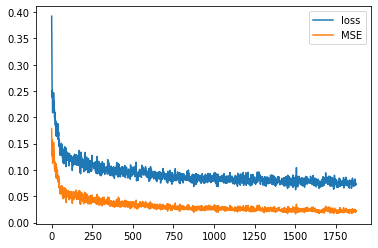

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


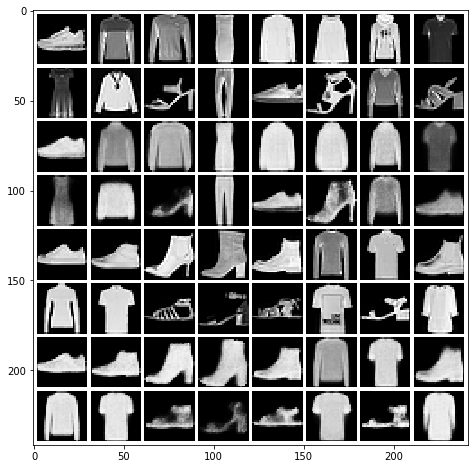

Mean squared dist: 0.026228387
epoch:  2 	 step:0 	 loss: 0.07199 	 reg loss: 0.001882
epoch:  2 	 step:100 	 loss: 0.0801 	 reg loss: 0.001818
epoch:  2 	 step:200 	 loss: 0.06827 	 reg loss: 0.001869
epoch:  2 	 step:300 	 loss: 0.07216 	 reg loss: 0.001854
epoch:  2 	 step:400 	 loss: 0.06585 	 reg loss: 0.001723
epoch:  2 	 step:500 	 loss: 0.07498 	 reg loss: 0.00191
epoch:  2 	 step:600 	 loss: 0.07342 	 reg loss: 0.00201
epoch:  2 	 step:700 	 loss: 0.0803 	 reg loss: 0.00184
epoch:  2 	 step:800 	 loss: 0.07106 	 reg loss: 0.001596
epoch:  2 	 step:900 	 loss: 0.06909 	 reg loss: 0.001698
epoch:  2 	 step:1000 	 loss: 0.06661 	 reg loss: 0.001922
epoch:  2 	 step:1100 	 loss: 0.06787 	 reg loss: 0.001967
epoch:  2 	 step:1200 	 loss: 0.06713 	 reg loss: 0.002063
epoch:  2 	 step:1300 	 loss: 0.06392 	 reg loss: 0.001761
epoch:  2 	 step:1400 	 loss: 0.06759 	 reg loss: 0.0017
epoch:  2 	 step:1500 	 loss: 0.06082 	 reg loss: 0.00186
epoch:  2 	 step:1600 	 loss: 0.07167 	 reg l

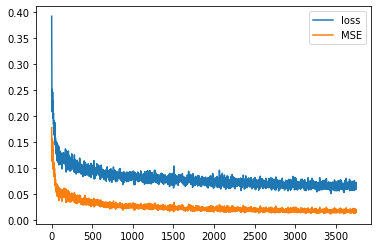

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


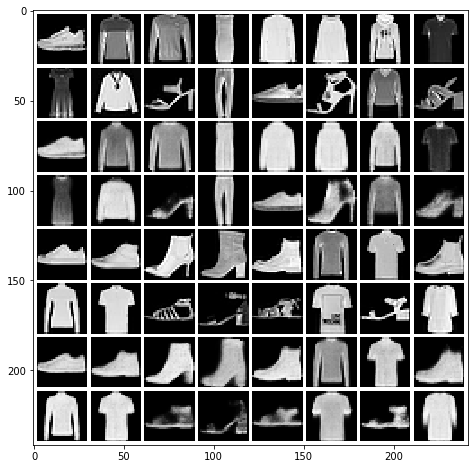

Mean squared dist: 0.018632857
epoch:  3 	 step:0 	 loss: 0.05987 	 reg loss: 0.001909
epoch:  3 	 step:100 	 loss: 0.06738 	 reg loss: 0.001775
epoch:  3 	 step:200 	 loss: 0.06896 	 reg loss: 0.001832
epoch:  3 	 step:300 	 loss: 0.07135 	 reg loss: 0.002031
epoch:  3 	 step:400 	 loss: 0.06031 	 reg loss: 0.001753
epoch:  3 	 step:500 	 loss: 0.06427 	 reg loss: 0.002002
epoch:  3 	 step:600 	 loss: 0.05763 	 reg loss: 0.001811
epoch:  3 	 step:700 	 loss: 0.06541 	 reg loss: 0.001943
epoch:  3 	 step:800 	 loss: 0.06416 	 reg loss: 0.001647
epoch:  3 	 step:900 	 loss: 0.07596 	 reg loss: 0.00177
epoch:  3 	 step:1000 	 loss: 0.05391 	 reg loss: 0.001795
epoch:  3 	 step:1100 	 loss: 0.06372 	 reg loss: 0.001911
epoch:  3 	 step:1200 	 loss: 0.06158 	 reg loss: 0.001743
epoch:  3 	 step:1300 	 loss: 0.06122 	 reg loss: 0.001859
epoch:  3 	 step:1400 	 loss: 0.05546 	 reg loss: 0.001807
epoch:  3 	 step:1500 	 loss: 0.06577 	 reg loss: 0.001878
epoch:  3 	 step:1600 	 loss: 0.06286 

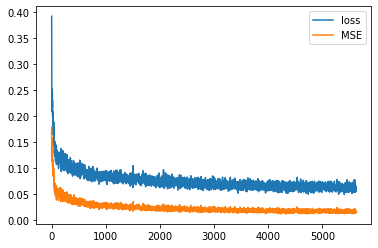

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


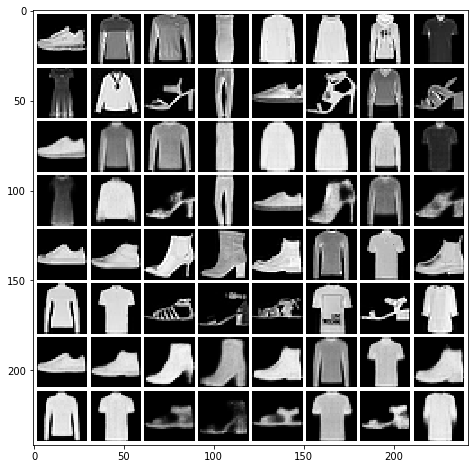

Mean squared dist: 0.016590351
epoch:  4 	 step:0 	 loss: 0.05412 	 reg loss: 0.001861
epoch:  4 	 step:100 	 loss: 0.05767 	 reg loss: 0.00192
epoch:  4 	 step:200 	 loss: 0.0642 	 reg loss: 0.00195
epoch:  4 	 step:300 	 loss: 0.06529 	 reg loss: 0.00195
epoch:  4 	 step:400 	 loss: 0.05945 	 reg loss: 0.001976
epoch:  4 	 step:500 	 loss: 0.06653 	 reg loss: 0.001945
epoch:  4 	 step:600 	 loss: 0.06011 	 reg loss: 0.00189
epoch:  4 	 step:700 	 loss: 0.0639 	 reg loss: 0.001871
epoch:  4 	 step:800 	 loss: 0.06369 	 reg loss: 0.001726
epoch:  4 	 step:900 	 loss: 0.06156 	 reg loss: 0.001854
epoch:  4 	 step:1000 	 loss: 0.05609 	 reg loss: 0.001866
epoch:  4 	 step:1100 	 loss: 0.05848 	 reg loss: 0.001814
epoch:  4 	 step:1200 	 loss: 0.05778 	 reg loss: 0.001814
epoch:  4 	 step:1300 	 loss: 0.05818 	 reg loss: 0.001954
epoch:  4 	 step:1400 	 loss: 0.05399 	 reg loss: 0.001863
epoch:  4 	 step:1500 	 loss: 0.05167 	 reg loss: 0.001838
epoch:  4 	 step:1600 	 loss: 0.05797 	 reg

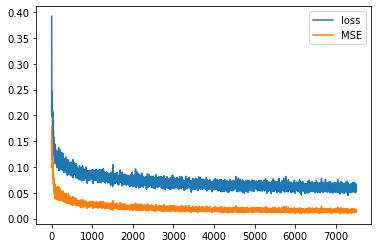

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


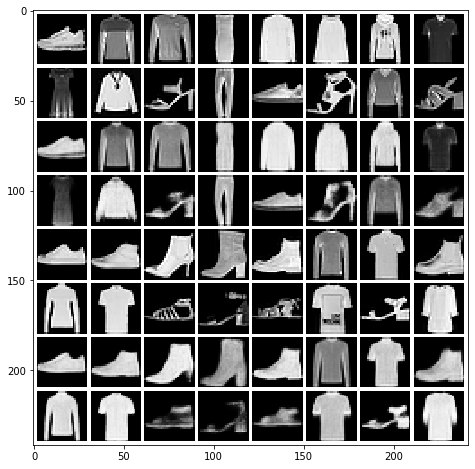

Mean squared dist: 0.015392485
epoch:  5 	 step:0 	 loss: 0.06334 	 reg loss: 0.001946
epoch:  5 	 step:100 	 loss: 0.05345 	 reg loss: 0.002064
epoch:  5 	 step:200 	 loss: 0.06379 	 reg loss: 0.001736
epoch:  5 	 step:300 	 loss: 0.06004 	 reg loss: 0.001907
epoch:  5 	 step:400 	 loss: 0.0568 	 reg loss: 0.001925
epoch:  5 	 step:500 	 loss: 0.05807 	 reg loss: 0.001769
epoch:  5 	 step:600 	 loss: 0.05875 	 reg loss: 0.001916
epoch:  5 	 step:700 	 loss: 0.05029 	 reg loss: 0.001917
epoch:  5 	 step:800 	 loss: 0.06462 	 reg loss: 0.001856
epoch:  5 	 step:900 	 loss: 0.05681 	 reg loss: 0.001862
epoch:  5 	 step:1000 	 loss: 0.05926 	 reg loss: 0.001902
epoch:  5 	 step:1100 	 loss: 0.0569 	 reg loss: 0.001798
epoch:  5 	 step:1200 	 loss: 0.05263 	 reg loss: 0.001622
epoch:  5 	 step:1300 	 loss: 0.06464 	 reg loss: 0.001846
epoch:  5 	 step:1400 	 loss: 0.05059 	 reg loss: 0.001833
epoch:  5 	 step:1500 	 loss: 0.05843 	 reg loss: 0.001875
epoch:  5 	 step:1600 	 loss: 0.06099 	

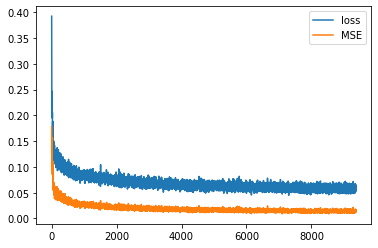

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


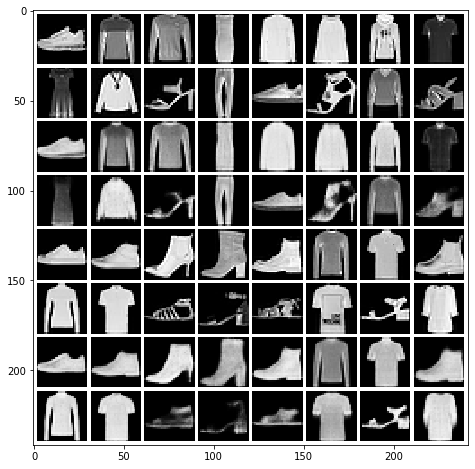

Mean squared dist: 0.0140782
epoch:  6 	 step:0 	 loss: 0.06735 	 reg loss: 0.00188
epoch:  6 	 step:100 	 loss: 0.05748 	 reg loss: 0.001941
epoch:  6 	 step:200 	 loss: 0.06104 	 reg loss: 0.001853
epoch:  6 	 step:300 	 loss: 0.06222 	 reg loss: 0.001902
epoch:  6 	 step:400 	 loss: 0.05356 	 reg loss: 0.001961
epoch:  6 	 step:500 	 loss: 0.0625 	 reg loss: 0.001924
epoch:  6 	 step:600 	 loss: 0.05952 	 reg loss: 0.001904
epoch:  6 	 step:700 	 loss: 0.05228 	 reg loss: 0.001973
epoch:  6 	 step:800 	 loss: 0.0569 	 reg loss: 0.001917
epoch:  6 	 step:900 	 loss: 0.05662 	 reg loss: 0.001761
epoch:  6 	 step:1000 	 loss: 0.06544 	 reg loss: 0.001934
epoch:  6 	 step:1100 	 loss: 0.05683 	 reg loss: 0.001968
epoch:  6 	 step:1200 	 loss: 0.0577 	 reg loss: 0.001948
epoch:  6 	 step:1300 	 loss: 0.05129 	 reg loss: 0.001898
epoch:  6 	 step:1400 	 loss: 0.06262 	 reg loss: 0.001948
epoch:  6 	 step:1500 	 loss: 0.05554 	 reg loss: 0.001922
epoch:  6 	 step:1600 	 loss: 0.05963 	 reg

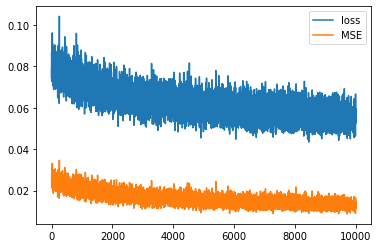

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


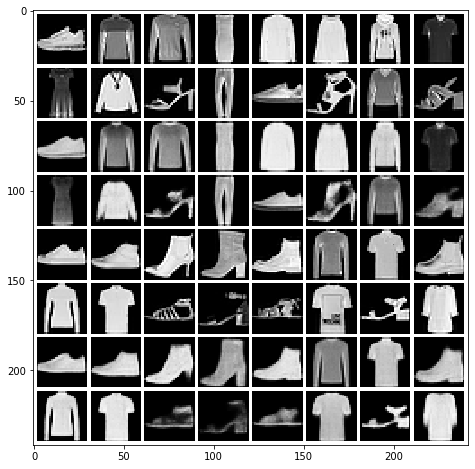

Mean squared dist: 0.013282934
epoch:  7 	 step:0 	 loss: 0.05327 	 reg loss: 0.001918
epoch:  7 	 step:100 	 loss: 0.05135 	 reg loss: 0.001836
epoch:  7 	 step:200 	 loss: 0.05146 	 reg loss: 0.001865
epoch:  7 	 step:300 	 loss: 0.05231 	 reg loss: 0.001869
epoch:  7 	 step:400 	 loss: 0.05386 	 reg loss: 0.001998
epoch:  7 	 step:500 	 loss: 0.0584 	 reg loss: 0.001867
epoch:  7 	 step:600 	 loss: 0.04682 	 reg loss: 0.001826
epoch:  7 	 step:700 	 loss: 0.06265 	 reg loss: 0.001793
epoch:  7 	 step:800 	 loss: 0.05071 	 reg loss: 0.002006
epoch:  7 	 step:900 	 loss: 0.05078 	 reg loss: 0.00181
epoch:  7 	 step:1000 	 loss: 0.05337 	 reg loss: 0.001841
epoch:  7 	 step:1100 	 loss: 0.05627 	 reg loss: 0.001883
epoch:  7 	 step:1200 	 loss: 0.05103 	 reg loss: 0.001783
epoch:  7 	 step:1300 	 loss: 0.04947 	 reg loss: 0.001905
epoch:  7 	 step:1400 	 loss: 0.05391 	 reg loss: 0.00183
epoch:  7 	 step:1500 	 loss: 0.05359 	 reg loss: 0.001865
epoch:  7 	 step:1600 	 loss: 0.06112 	 

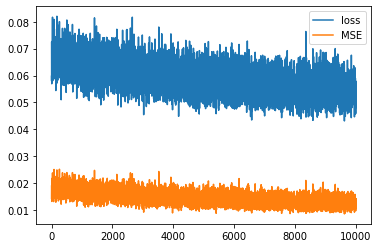

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


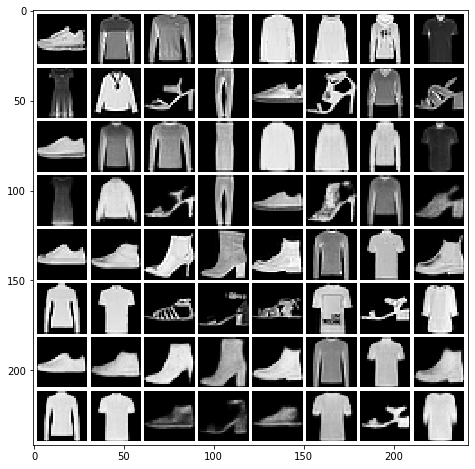

Mean squared dist: 0.012908045
epoch:  8 	 step:0 	 loss: 0.05589 	 reg loss: 0.001945
epoch:  8 	 step:100 	 loss: 0.06005 	 reg loss: 0.001971
epoch:  8 	 step:200 	 loss: 0.05124 	 reg loss: 0.001802
epoch:  8 	 step:300 	 loss: 0.05301 	 reg loss: 0.001808
epoch:  8 	 step:400 	 loss: 0.05793 	 reg loss: 0.001895
epoch:  8 	 step:500 	 loss: 0.04794 	 reg loss: 0.001864
epoch:  8 	 step:600 	 loss: 0.05704 	 reg loss: 0.001717
epoch:  8 	 step:700 	 loss: 0.0534 	 reg loss: 0.001884
epoch:  8 	 step:800 	 loss: 0.05606 	 reg loss: 0.001728
epoch:  8 	 step:900 	 loss: 0.05455 	 reg loss: 0.001834
epoch:  8 	 step:1000 	 loss: 0.05575 	 reg loss: 0.001858
epoch:  8 	 step:1100 	 loss: 0.04958 	 reg loss: 0.001895
epoch:  8 	 step:1200 	 loss: 0.04684 	 reg loss: 0.001891
epoch:  8 	 step:1300 	 loss: 0.0494 	 reg loss: 0.001889
epoch:  8 	 step:1400 	 loss: 0.05698 	 reg loss: 0.001906
epoch:  8 	 step:1500 	 loss: 0.05807 	 reg loss: 0.001937
epoch:  8 	 step:1600 	 loss: 0.05447 	

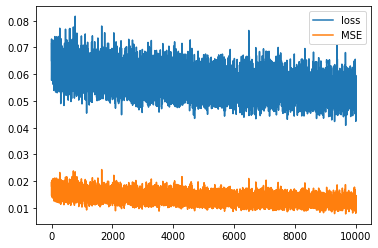

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


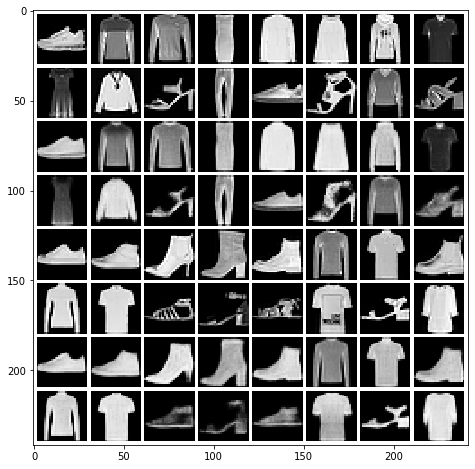

Mean squared dist: 0.012500998
epoch:  9 	 step:0 	 loss: 0.04824 	 reg loss: 0.001816
epoch:  9 	 step:100 	 loss: 0.05589 	 reg loss: 0.001975
epoch:  9 	 step:200 	 loss: 0.05239 	 reg loss: 0.001759
epoch:  9 	 step:300 	 loss: 0.04463 	 reg loss: 0.001819
epoch:  9 	 step:400 	 loss: 0.05154 	 reg loss: 0.00186
epoch:  9 	 step:500 	 loss: 0.04541 	 reg loss: 0.001861
epoch:  9 	 step:600 	 loss: 0.05 	 reg loss: 0.001875
epoch:  9 	 step:700 	 loss: 0.04265 	 reg loss: 0.001855
epoch:  9 	 step:800 	 loss: 0.04694 	 reg loss: 0.001857
epoch:  9 	 step:900 	 loss: 0.04201 	 reg loss: 0.001766
epoch:  9 	 step:1000 	 loss: 0.05368 	 reg loss: 0.001828
epoch:  9 	 step:1100 	 loss: 0.0538 	 reg loss: 0.001799
epoch:  9 	 step:1200 	 loss: 0.04733 	 reg loss: 0.001818
epoch:  9 	 step:1300 	 loss: 0.05645 	 reg loss: 0.00187
epoch:  9 	 step:1400 	 loss: 0.04176 	 reg loss: 0.001877
epoch:  9 	 step:1500 	 loss: 0.04566 	 reg loss: 0.001791
epoch:  9 	 step:1600 	 loss: 0.05239 	 reg

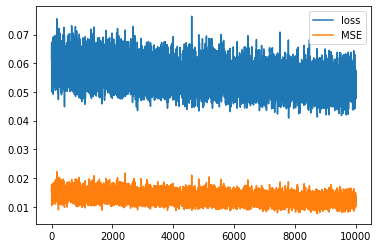

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


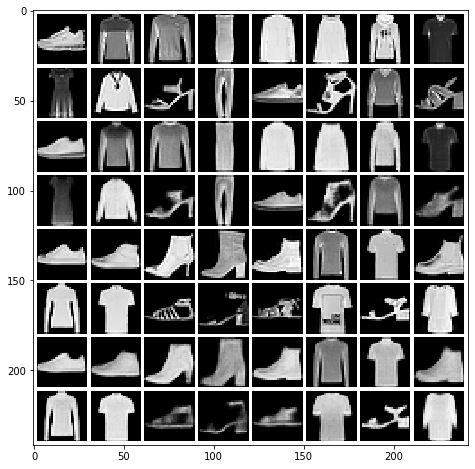

Mean squared dist: 0.012277659
epoch: 10 	 step:0 	 loss: 0.05178 	 reg loss: 0.001897
epoch: 10 	 step:100 	 loss: 0.05352 	 reg loss: 0.001858
epoch: 10 	 step:200 	 loss: 0.05076 	 reg loss: 0.001921
epoch: 10 	 step:300 	 loss: 0.05301 	 reg loss: 0.001873
epoch: 10 	 step:400 	 loss: 0.05438 	 reg loss: 0.001823
epoch: 10 	 step:500 	 loss: 0.04915 	 reg loss: 0.00183
epoch: 10 	 step:600 	 loss: 0.04853 	 reg loss: 0.001783
epoch: 10 	 step:700 	 loss: 0.05977 	 reg loss: 0.001985
epoch: 10 	 step:800 	 loss: 0.05431 	 reg loss: 0.001804
epoch: 10 	 step:900 	 loss: 0.05353 	 reg loss: 0.002001
epoch: 10 	 step:1000 	 loss: 0.05113 	 reg loss: 0.001816
epoch: 10 	 step:1100 	 loss: 0.04424 	 reg loss: 0.001786
epoch: 10 	 step:1200 	 loss: 0.05736 	 reg loss: 0.001918
epoch: 10 	 step:1300 	 loss: 0.05619 	 reg loss: 0.001783
epoch: 10 	 step:1400 	 loss: 0.0572 	 reg loss: 0.001868
epoch: 10 	 step:1500 	 loss: 0.05308 	 reg loss: 0.001852
epoch: 10 	 step:1600 	 loss: 0.0556 	 

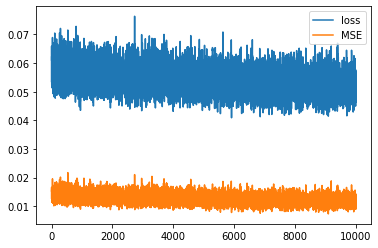

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


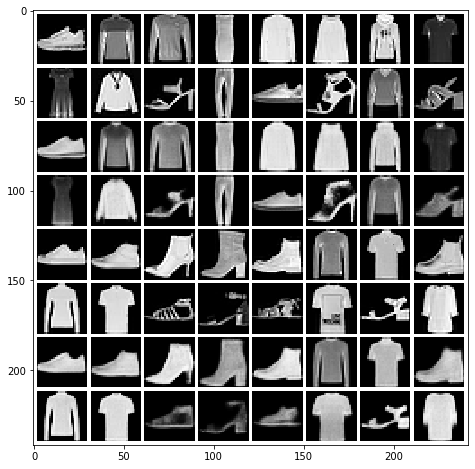

Mean squared dist: 0.011883419
epoch: 11 	 step:0 	 loss: 0.05031 	 reg loss: 0.001909
epoch: 11 	 step:100 	 loss: 0.05494 	 reg loss: 0.001758
epoch: 11 	 step:200 	 loss: 0.04506 	 reg loss: 0.001822
epoch: 11 	 step:300 	 loss: 0.0515 	 reg loss: 0.001846
epoch: 11 	 step:400 	 loss: 0.04666 	 reg loss: 0.001818
epoch: 11 	 step:500 	 loss: 0.05796 	 reg loss: 0.001813
epoch: 11 	 step:600 	 loss: 0.05379 	 reg loss: 0.001867
epoch: 11 	 step:700 	 loss: 0.05406 	 reg loss: 0.001867
epoch: 11 	 step:800 	 loss: 0.04647 	 reg loss: 0.001879
epoch: 11 	 step:900 	 loss: 0.05136 	 reg loss: 0.001933
epoch: 11 	 step:1000 	 loss: 0.05718 	 reg loss: 0.00183
epoch: 11 	 step:1100 	 loss: 0.04346 	 reg loss: 0.001676
epoch: 11 	 step:1200 	 loss: 0.06033 	 reg loss: 0.00179
epoch: 11 	 step:1300 	 loss: 0.05696 	 reg loss: 0.001846
epoch: 11 	 step:1400 	 loss: 0.04747 	 reg loss: 0.00183
epoch: 11 	 step:1500 	 loss: 0.04735 	 reg loss: 0.001835
epoch: 11 	 step:1600 	 loss: 0.05152 	 r

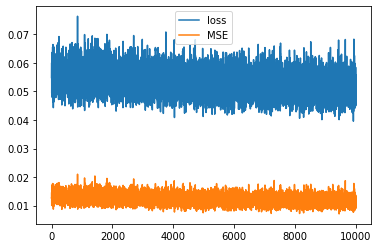

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


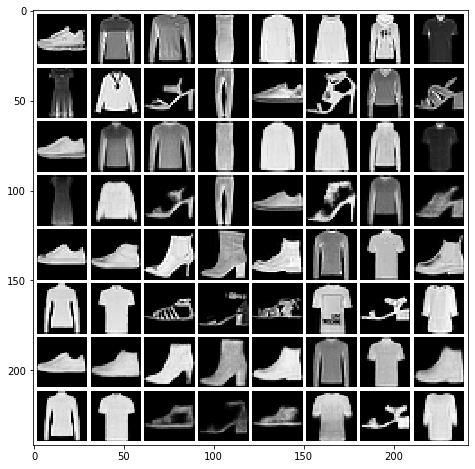

Mean squared dist: 0.011907743
epoch: 12 	 step:0 	 loss: 0.0497 	 reg loss: 0.001845
epoch: 12 	 step:100 	 loss: 0.052 	 reg loss: 0.001868
epoch: 12 	 step:200 	 loss: 0.04967 	 reg loss: 0.001852
epoch: 12 	 step:300 	 loss: 0.04857 	 reg loss: 0.00181
epoch: 12 	 step:400 	 loss: 0.05503 	 reg loss: 0.001863
epoch: 12 	 step:500 	 loss: 0.05259 	 reg loss: 0.001865
epoch: 12 	 step:600 	 loss: 0.04738 	 reg loss: 0.001759
epoch: 12 	 step:700 	 loss: 0.04958 	 reg loss: 0.001808
epoch: 12 	 step:800 	 loss: 0.05022 	 reg loss: 0.001806
epoch: 12 	 step:900 	 loss: 0.04971 	 reg loss: 0.001862
epoch: 12 	 step:1000 	 loss: 0.04735 	 reg loss: 0.001813
epoch: 12 	 step:1100 	 loss: 0.04706 	 reg loss: 0.001804
epoch: 12 	 step:1200 	 loss: 0.04104 	 reg loss: 0.00177
epoch: 12 	 step:1300 	 loss: 0.04779 	 reg loss: 0.001819
epoch: 12 	 step:1400 	 loss: 0.05291 	 reg loss: 0.001815
epoch: 12 	 step:1500 	 loss: 0.05058 	 reg loss: 0.001839
epoch: 12 	 step:1600 	 loss: 0.05521 	 re

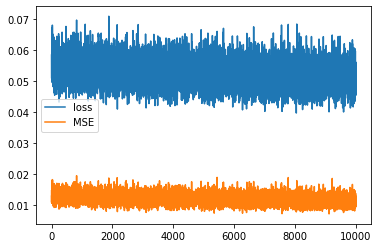

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


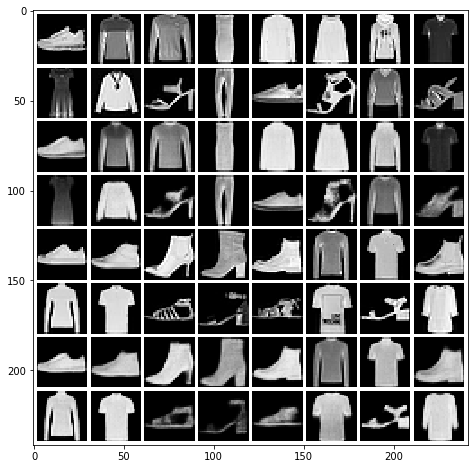

Mean squared dist: 0.011498361
epoch: 13 	 step:0 	 loss: 0.04969 	 reg loss: 0.001713
epoch: 13 	 step:100 	 loss: 0.04822 	 reg loss: 0.001845
epoch: 13 	 step:200 	 loss: 0.05121 	 reg loss: 0.001808
epoch: 13 	 step:300 	 loss: 0.05773 	 reg loss: 0.00177
epoch: 13 	 step:400 	 loss: 0.05685 	 reg loss: 0.001876
epoch: 13 	 step:500 	 loss: 0.05378 	 reg loss: 0.001865
epoch: 13 	 step:600 	 loss: 0.05153 	 reg loss: 0.001887
epoch: 13 	 step:700 	 loss: 0.05034 	 reg loss: 0.0018
epoch: 13 	 step:800 	 loss: 0.04948 	 reg loss: 0.001844
epoch: 13 	 step:900 	 loss: 0.05255 	 reg loss: 0.00174
epoch: 13 	 step:1000 	 loss: 0.0455 	 reg loss: 0.00183
epoch: 13 	 step:1100 	 loss: 0.04541 	 reg loss: 0.001834
epoch: 13 	 step:1200 	 loss: 0.05516 	 reg loss: 0.001733
epoch: 13 	 step:1300 	 loss: 0.04939 	 reg loss: 0.001792
epoch: 13 	 step:1400 	 loss: 0.04985 	 reg loss: 0.001895
epoch: 13 	 step:1500 	 loss: 0.04356 	 reg loss: 0.001765
epoch: 13 	 step:1600 	 loss: 0.05188 	 reg

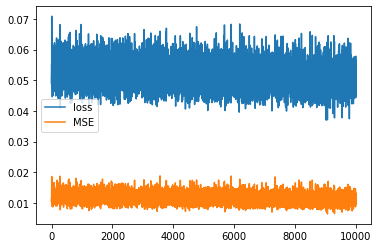

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


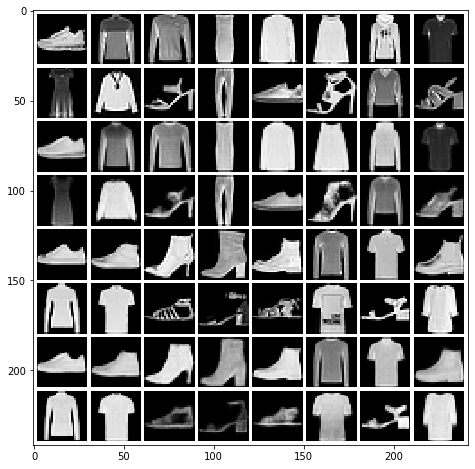

Mean squared dist: 0.01145786
epoch: 14 	 step:0 	 loss: 0.05241 	 reg loss: 0.001821
epoch: 14 	 step:100 	 loss: 0.05288 	 reg loss: 0.00191
epoch: 14 	 step:200 	 loss: 0.04751 	 reg loss: 0.001731
epoch: 14 	 step:300 	 loss: 0.0457 	 reg loss: 0.001822
epoch: 14 	 step:400 	 loss: 0.05561 	 reg loss: 0.001871
epoch: 14 	 step:500 	 loss: 0.05274 	 reg loss: 0.001763
epoch: 14 	 step:600 	 loss: 0.0475 	 reg loss: 0.001766
epoch: 14 	 step:700 	 loss: 0.04134 	 reg loss: 0.001713
epoch: 14 	 step:800 	 loss: 0.05235 	 reg loss: 0.001838
epoch: 14 	 step:900 	 loss: 0.0535 	 reg loss: 0.001844
epoch: 14 	 step:1000 	 loss: 0.04823 	 reg loss: 0.001791
epoch: 14 	 step:1100 	 loss: 0.04809 	 reg loss: 0.001844
epoch: 14 	 step:1200 	 loss: 0.05006 	 reg loss: 0.001757
epoch: 14 	 step:1300 	 loss: 0.06101 	 reg loss: 0.001851
epoch: 14 	 step:1400 	 loss: 0.05386 	 reg loss: 0.001793
epoch: 14 	 step:1500 	 loss: 0.04964 	 reg loss: 0.001865
epoch: 14 	 step:1600 	 loss: 0.05566 	 re

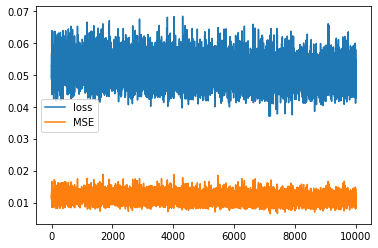

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


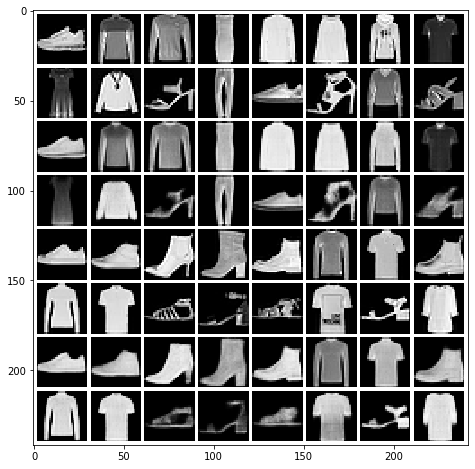

Mean squared dist: 0.011283324
epoch: 15 	 step:0 	 loss: 0.04296 	 reg loss: 0.001873
epoch: 15 	 step:100 	 loss: 0.04608 	 reg loss: 0.00178
epoch: 15 	 step:200 	 loss: 0.05119 	 reg loss: 0.001844
epoch: 15 	 step:300 	 loss: 0.04928 	 reg loss: 0.001836
epoch: 15 	 step:400 	 loss: 0.05315 	 reg loss: 0.001837
epoch: 15 	 step:500 	 loss: 0.0414 	 reg loss: 0.001835
epoch: 15 	 step:600 	 loss: 0.04726 	 reg loss: 0.001808
epoch: 15 	 step:700 	 loss: 0.04563 	 reg loss: 0.001825
epoch: 15 	 step:800 	 loss: 0.04803 	 reg loss: 0.001809
epoch: 15 	 step:900 	 loss: 0.04667 	 reg loss: 0.001744
epoch: 15 	 step:1000 	 loss: 0.04537 	 reg loss: 0.001763
epoch: 15 	 step:1100 	 loss: 0.05709 	 reg loss: 0.001749
epoch: 15 	 step:1200 	 loss: 0.04665 	 reg loss: 0.001814
epoch: 15 	 step:1300 	 loss: 0.04435 	 reg loss: 0.001774
epoch: 15 	 step:1400 	 loss: 0.04986 	 reg loss: 0.001718
epoch: 15 	 step:1500 	 loss: 0.04953 	 reg loss: 0.001812
epoch: 15 	 step:1600 	 loss: 0.05074 	

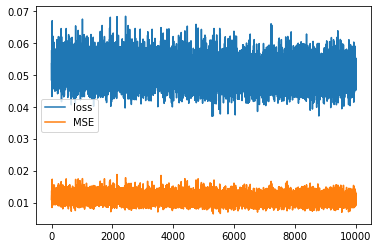

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


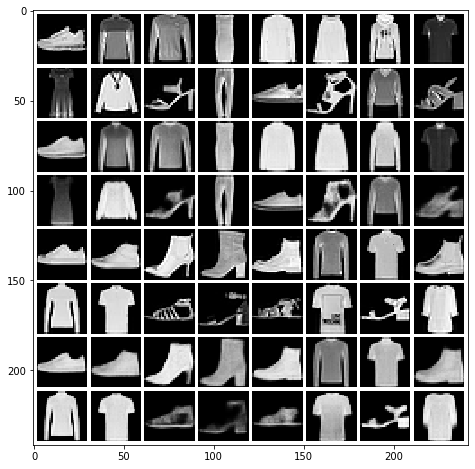

Mean squared dist: 0.011072707
epoch: 16 	 step:0 	 loss: 0.05216 	 reg loss: 0.001857
epoch: 16 	 step:100 	 loss: 0.0447 	 reg loss: 0.001825
epoch: 16 	 step:200 	 loss: 0.05139 	 reg loss: 0.001823
epoch: 16 	 step:300 	 loss: 0.04741 	 reg loss: 0.001764
epoch: 16 	 step:400 	 loss: 0.04753 	 reg loss: 0.001783
epoch: 16 	 step:500 	 loss: 0.04904 	 reg loss: 0.001788
epoch: 16 	 step:600 	 loss: 0.04995 	 reg loss: 0.001875
epoch: 16 	 step:700 	 loss: 0.04518 	 reg loss: 0.001826
epoch: 16 	 step:800 	 loss: 0.0537 	 reg loss: 0.001835
epoch: 16 	 step:900 	 loss: 0.05376 	 reg loss: 0.001852
epoch: 16 	 step:1000 	 loss: 0.05442 	 reg loss: 0.001711
epoch: 16 	 step:1100 	 loss: 0.05268 	 reg loss: 0.001785
epoch: 16 	 step:1200 	 loss: 0.05763 	 reg loss: 0.001822
epoch: 16 	 step:1300 	 loss: 0.04836 	 reg loss: 0.001772
epoch: 16 	 step:1400 	 loss: 0.05616 	 reg loss: 0.001831
epoch: 16 	 step:1500 	 loss: 0.04181 	 reg loss: 0.001742
epoch: 16 	 step:1600 	 loss: 0.0514 	 

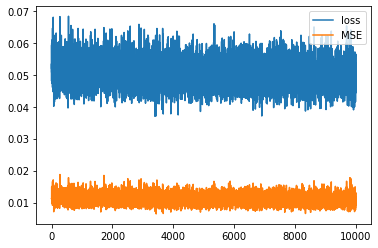

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


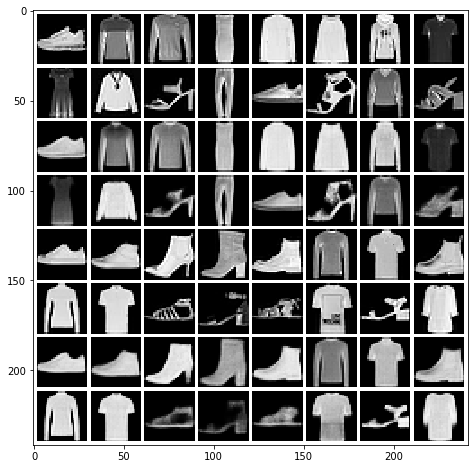

Mean squared dist: 0.011057094
epoch: 17 	 step:0 	 loss: 0.05697 	 reg loss: 0.001818
epoch: 17 	 step:100 	 loss: 0.04954 	 reg loss: 0.001861
epoch: 17 	 step:200 	 loss: 0.04789 	 reg loss: 0.00186
epoch: 17 	 step:300 	 loss: 0.04588 	 reg loss: 0.001804
epoch: 17 	 step:400 	 loss: 0.04451 	 reg loss: 0.001736
epoch: 17 	 step:500 	 loss: 0.04641 	 reg loss: 0.001841
epoch: 17 	 step:600 	 loss: 0.04795 	 reg loss: 0.001794
epoch: 17 	 step:700 	 loss: 0.05169 	 reg loss: 0.001855
epoch: 17 	 step:800 	 loss: 0.04064 	 reg loss: 0.00174
epoch: 17 	 step:900 	 loss: 0.04585 	 reg loss: 0.00177
epoch: 17 	 step:1000 	 loss: 0.04476 	 reg loss: 0.001729
epoch: 17 	 step:1100 	 loss: 0.05382 	 reg loss: 0.001818
epoch: 17 	 step:1200 	 loss: 0.04846 	 reg loss: 0.001727
epoch: 17 	 step:1300 	 loss: 0.05162 	 reg loss: 0.001798
epoch: 17 	 step:1400 	 loss: 0.05235 	 reg loss: 0.001811
epoch: 17 	 step:1500 	 loss: 0.04913 	 reg loss: 0.001823
epoch: 17 	 step:1600 	 loss: 0.05619 	 

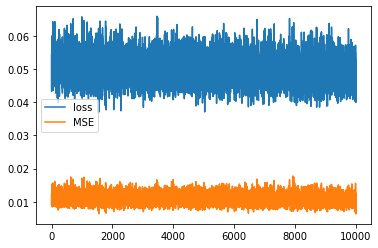

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


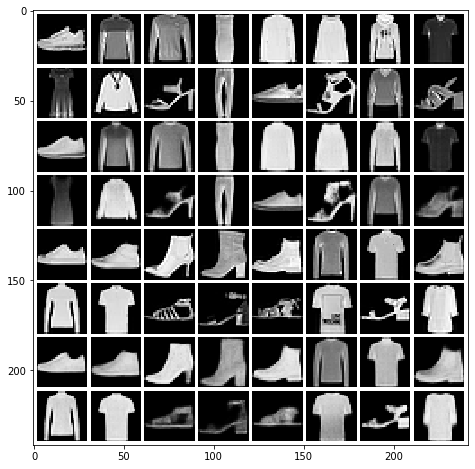

Mean squared dist: 0.011089549
epoch: 18 	 step:0 	 loss: 0.05339 	 reg loss: 0.001839
epoch: 18 	 step:100 	 loss: 0.05055 	 reg loss: 0.001803
epoch: 18 	 step:200 	 loss: 0.0451 	 reg loss: 0.001861
epoch: 18 	 step:300 	 loss: 0.05014 	 reg loss: 0.001856
epoch: 18 	 step:400 	 loss: 0.04271 	 reg loss: 0.001711
epoch: 18 	 step:500 	 loss: 0.05306 	 reg loss: 0.001805
epoch: 18 	 step:600 	 loss: 0.05128 	 reg loss: 0.001775
epoch: 18 	 step:700 	 loss: 0.05107 	 reg loss: 0.001744
epoch: 18 	 step:800 	 loss: 0.04633 	 reg loss: 0.001809
epoch: 18 	 step:900 	 loss: 0.05205 	 reg loss: 0.001717
epoch: 18 	 step:1000 	 loss: 0.04766 	 reg loss: 0.001867
epoch: 18 	 step:1100 	 loss: 0.04293 	 reg loss: 0.001717
epoch: 18 	 step:1200 	 loss: 0.05156 	 reg loss: 0.001764
epoch: 18 	 step:1300 	 loss: 0.04726 	 reg loss: 0.001739
epoch: 18 	 step:1400 	 loss: 0.04836 	 reg loss: 0.001732
epoch: 18 	 step:1500 	 loss: 0.05215 	 reg loss: 0.001784
epoch: 18 	 step:1600 	 loss: 0.04582 

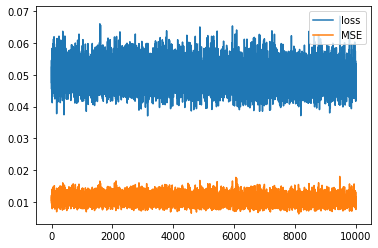

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


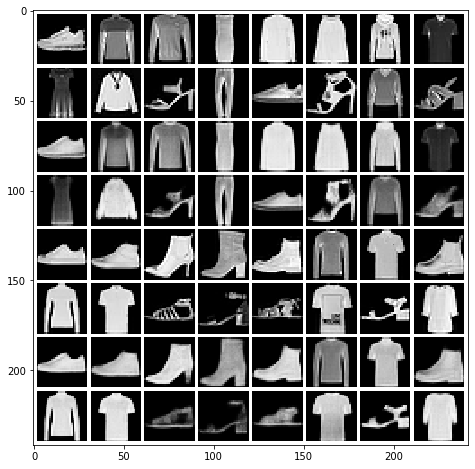

Mean squared dist: 0.01114464
epoch: 19 	 step:0 	 loss: 0.04942 	 reg loss: 0.001788
epoch: 19 	 step:100 	 loss: 0.0473 	 reg loss: 0.001794
epoch: 19 	 step:200 	 loss: 0.05655 	 reg loss: 0.00179
epoch: 19 	 step:300 	 loss: 0.05994 	 reg loss: 0.001795
epoch: 19 	 step:400 	 loss: 0.04955 	 reg loss: 0.001847
epoch: 19 	 step:500 	 loss: 0.05031 	 reg loss: 0.001805
epoch: 19 	 step:600 	 loss: 0.05226 	 reg loss: 0.001778
epoch: 19 	 step:700 	 loss: 0.05367 	 reg loss: 0.001768
epoch: 19 	 step:800 	 loss: 0.04593 	 reg loss: 0.00179
epoch: 19 	 step:900 	 loss: 0.0448 	 reg loss: 0.001769
epoch: 19 	 step:1000 	 loss: 0.04884 	 reg loss: 0.00176
epoch: 19 	 step:1100 	 loss: 0.04244 	 reg loss: 0.001822
epoch: 19 	 step:1200 	 loss: 0.04442 	 reg loss: 0.001778
epoch: 19 	 step:1300 	 loss: 0.05067 	 reg loss: 0.001795
epoch: 19 	 step:1400 	 loss: 0.05153 	 reg loss: 0.001775
epoch: 19 	 step:1500 	 loss: 0.04696 	 reg loss: 0.001823
epoch: 19 	 step:1600 	 loss: 0.04297 	 reg

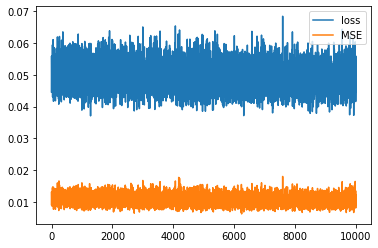

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


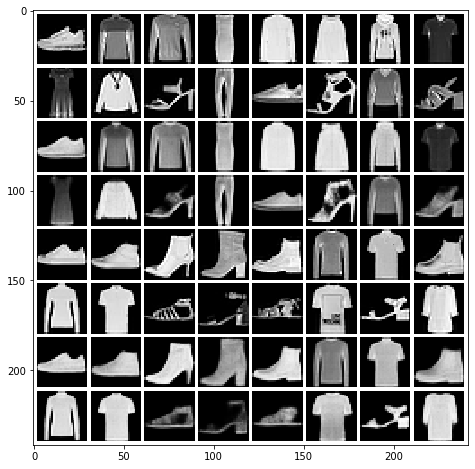

Mean squared dist: 0.010924101
epoch: 20 	 step:0 	 loss: 0.0504 	 reg loss: 0.001763
epoch: 20 	 step:100 	 loss: 0.04772 	 reg loss: 0.001807
epoch: 20 	 step:200 	 loss: 0.0442 	 reg loss: 0.00182
epoch: 20 	 step:300 	 loss: 0.04967 	 reg loss: 0.00182
epoch: 20 	 step:400 	 loss: 0.05341 	 reg loss: 0.001761
epoch: 20 	 step:500 	 loss: 0.04711 	 reg loss: 0.001725
epoch: 20 	 step:600 	 loss: 0.04474 	 reg loss: 0.00181
epoch: 20 	 step:700 	 loss: 0.05016 	 reg loss: 0.001792
epoch: 20 	 step:800 	 loss: 0.0484 	 reg loss: 0.001801
epoch: 20 	 step:900 	 loss: 0.04842 	 reg loss: 0.001771
epoch: 20 	 step:1000 	 loss: 0.04535 	 reg loss: 0.001776
epoch: 20 	 step:1100 	 loss: 0.05094 	 reg loss: 0.00181
epoch: 20 	 step:1200 	 loss: 0.05284 	 reg loss: 0.00179
epoch: 20 	 step:1300 	 loss: 0.04675 	 reg loss: 0.00177
epoch: 20 	 step:1400 	 loss: 0.05349 	 reg loss: 0.001851
epoch: 20 	 step:1500 	 loss: 0.04928 	 reg loss: 0.001856
epoch: 20 	 step:1600 	 loss: 0.05373 	 reg lo

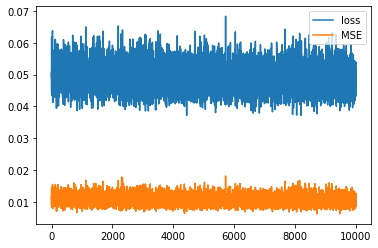

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


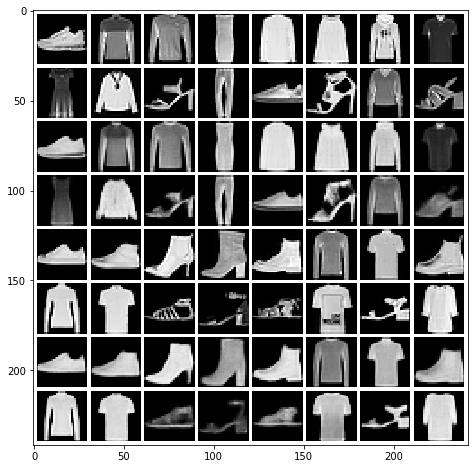

Mean squared dist: 0.010826004
epoch: 21 	 step:0 	 loss: 0.04216 	 reg loss: 0.001782
epoch: 21 	 step:100 	 loss: 0.04324 	 reg loss: 0.001803
epoch: 21 	 step:200 	 loss: 0.04693 	 reg loss: 0.001779
epoch: 21 	 step:300 	 loss: 0.05354 	 reg loss: 0.001727
epoch: 21 	 step:400 	 loss: 0.04737 	 reg loss: 0.001744
epoch: 21 	 step:500 	 loss: 0.04712 	 reg loss: 0.00177
epoch: 21 	 step:600 	 loss: 0.04413 	 reg loss: 0.001822
epoch: 21 	 step:700 	 loss: 0.04824 	 reg loss: 0.00178
epoch: 21 	 step:800 	 loss: 0.04772 	 reg loss: 0.001776
epoch: 21 	 step:900 	 loss: 0.04849 	 reg loss: 0.001781
epoch: 21 	 step:1000 	 loss: 0.04335 	 reg loss: 0.001742
epoch: 21 	 step:1100 	 loss: 0.04835 	 reg loss: 0.001707
epoch: 21 	 step:1200 	 loss: 0.04569 	 reg loss: 0.001682
epoch: 21 	 step:1300 	 loss: 0.04456 	 reg loss: 0.001734
epoch: 21 	 step:1400 	 loss: 0.04884 	 reg loss: 0.001745
epoch: 21 	 step:1500 	 loss: 0.04594 	 reg loss: 0.001786
epoch: 21 	 step:1600 	 loss: 0.04487 	

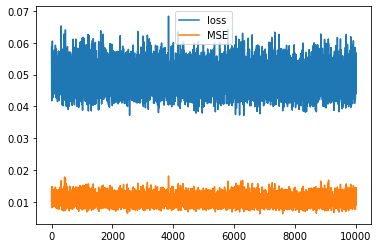

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


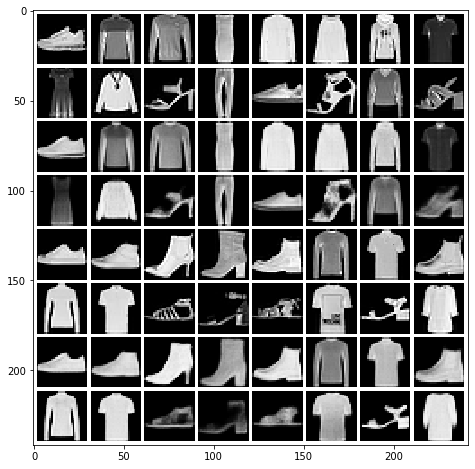

Mean squared dist: 0.010938443
epoch: 22 	 step:0 	 loss: 0.05138 	 reg loss: 0.001753
epoch: 22 	 step:100 	 loss: 0.04923 	 reg loss: 0.001755
epoch: 22 	 step:200 	 loss: 0.04864 	 reg loss: 0.001759
epoch: 22 	 step:300 	 loss: 0.05036 	 reg loss: 0.00183
epoch: 22 	 step:400 	 loss: 0.04909 	 reg loss: 0.001814
epoch: 22 	 step:500 	 loss: 0.04868 	 reg loss: 0.001833
epoch: 22 	 step:600 	 loss: 0.05495 	 reg loss: 0.001776
epoch: 22 	 step:700 	 loss: 0.04813 	 reg loss: 0.001835
epoch: 22 	 step:800 	 loss: 0.04669 	 reg loss: 0.001745
epoch: 22 	 step:900 	 loss: 0.04809 	 reg loss: 0.001848
epoch: 22 	 step:1000 	 loss: 0.04546 	 reg loss: 0.001693
epoch: 22 	 step:1100 	 loss: 0.0524 	 reg loss: 0.00181
epoch: 22 	 step:1200 	 loss: 0.0516 	 reg loss: 0.001757
epoch: 22 	 step:1300 	 loss: 0.04523 	 reg loss: 0.001816
epoch: 22 	 step:1400 	 loss: 0.05304 	 reg loss: 0.001816
epoch: 22 	 step:1500 	 loss: 0.04915 	 reg loss: 0.001744
epoch: 22 	 step:1600 	 loss: 0.04942 	 r

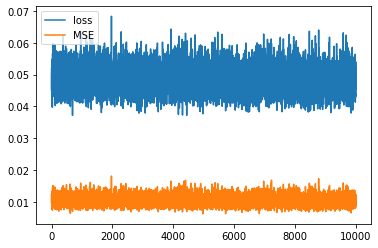

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


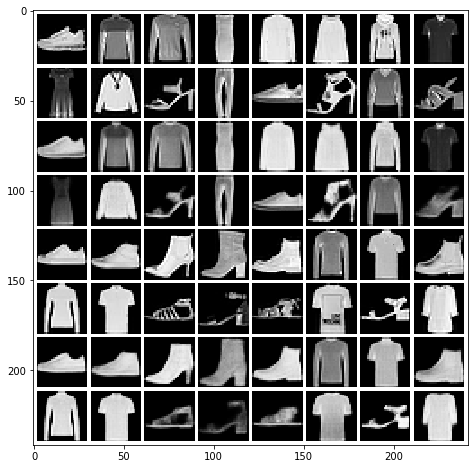

Mean squared dist: 0.01069358
epoch: 23 	 step:0 	 loss: 0.04921 	 reg loss: 0.001741
epoch: 23 	 step:100 	 loss: 0.04495 	 reg loss: 0.001804
epoch: 23 	 step:200 	 loss: 0.04626 	 reg loss: 0.001775
epoch: 23 	 step:300 	 loss: 0.04825 	 reg loss: 0.001812
epoch: 23 	 step:400 	 loss: 0.04361 	 reg loss: 0.001742
epoch: 23 	 step:500 	 loss: 0.04392 	 reg loss: 0.001718
epoch: 23 	 step:600 	 loss: 0.04788 	 reg loss: 0.001758
epoch: 23 	 step:700 	 loss: 0.05134 	 reg loss: 0.001803
epoch: 23 	 step:800 	 loss: 0.05183 	 reg loss: 0.001829
epoch: 23 	 step:900 	 loss: 0.04925 	 reg loss: 0.001779
epoch: 23 	 step:1000 	 loss: 0.04605 	 reg loss: 0.00185
epoch: 23 	 step:1100 	 loss: 0.04966 	 reg loss: 0.001803
epoch: 23 	 step:1200 	 loss: 0.04652 	 reg loss: 0.001737
epoch: 23 	 step:1300 	 loss: 0.04461 	 reg loss: 0.001685
epoch: 23 	 step:1400 	 loss: 0.05066 	 reg loss: 0.001773
epoch: 23 	 step:1500 	 loss: 0.04634 	 reg loss: 0.001783
epoch: 23 	 step:1600 	 loss: 0.04242 	

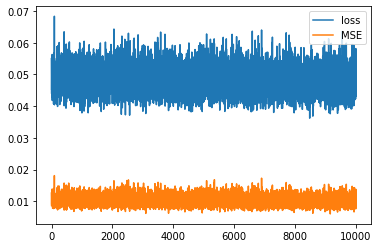

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


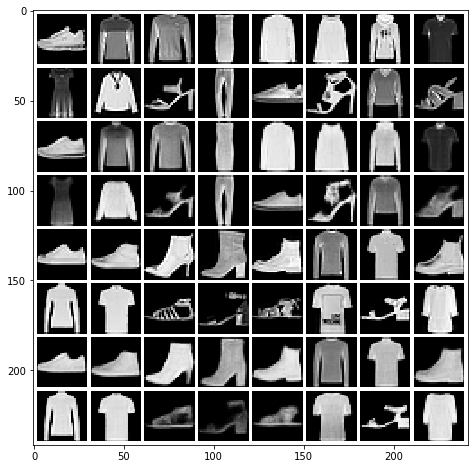

Mean squared dist: 0.010684422
epoch: 24 	 step:0 	 loss: 0.04767 	 reg loss: 0.001703
epoch: 24 	 step:100 	 loss: 0.05217 	 reg loss: 0.001817
epoch: 24 	 step:200 	 loss: 0.05368 	 reg loss: 0.001795
epoch: 24 	 step:300 	 loss: 0.04801 	 reg loss: 0.001785
epoch: 24 	 step:400 	 loss: 0.05992 	 reg loss: 0.001761
epoch: 24 	 step:500 	 loss: 0.05018 	 reg loss: 0.001759
epoch: 24 	 step:600 	 loss: 0.04896 	 reg loss: 0.001778
epoch: 24 	 step:700 	 loss: 0.04532 	 reg loss: 0.001858
epoch: 24 	 step:800 	 loss: 0.03969 	 reg loss: 0.001723
epoch: 24 	 step:900 	 loss: 0.046 	 reg loss: 0.001844
epoch: 24 	 step:1000 	 loss: 0.04069 	 reg loss: 0.001721
epoch: 24 	 step:1100 	 loss: 0.04604 	 reg loss: 0.001846
epoch: 24 	 step:1200 	 loss: 0.04526 	 reg loss: 0.001747
epoch: 24 	 step:1300 	 loss: 0.04672 	 reg loss: 0.00178
epoch: 24 	 step:1400 	 loss: 0.04074 	 reg loss: 0.001745
epoch: 24 	 step:1500 	 loss: 0.05139 	 reg loss: 0.001705
epoch: 24 	 step:1600 	 loss: 0.04568 	 

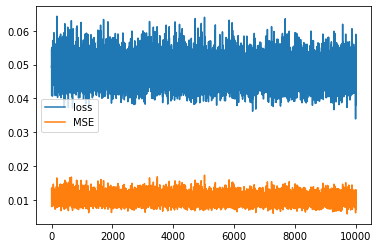

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


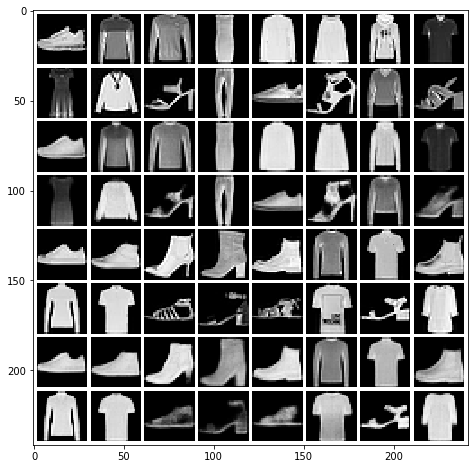

Mean squared dist: 0.010668559
epoch: 25 	 step:0 	 loss: 0.05122 	 reg loss: 0.001742
epoch: 25 	 step:100 	 loss: 0.04501 	 reg loss: 0.001788
epoch: 25 	 step:200 	 loss: 0.04454 	 reg loss: 0.001784
epoch: 25 	 step:300 	 loss: 0.04993 	 reg loss: 0.001763
epoch: 25 	 step:400 	 loss: 0.04728 	 reg loss: 0.001805
epoch: 25 	 step:500 	 loss: 0.04702 	 reg loss: 0.001773
epoch: 25 	 step:600 	 loss: 0.04692 	 reg loss: 0.001803
epoch: 25 	 step:700 	 loss: 0.05079 	 reg loss: 0.001792
epoch: 25 	 step:800 	 loss: 0.04895 	 reg loss: 0.001793
epoch: 25 	 step:900 	 loss: 0.04056 	 reg loss: 0.001791
epoch: 25 	 step:1000 	 loss: 0.05002 	 reg loss: 0.001738
epoch: 25 	 step:1100 	 loss: 0.04672 	 reg loss: 0.001728
epoch: 25 	 step:1200 	 loss: 0.04534 	 reg loss: 0.001745
epoch: 25 	 step:1300 	 loss: 0.04885 	 reg loss: 0.001781
epoch: 25 	 step:1400 	 loss: 0.04881 	 reg loss: 0.001803
epoch: 25 	 step:1500 	 loss: 0.04858 	 reg loss: 0.001799
epoch: 25 	 step:1600 	 loss: 0.04618

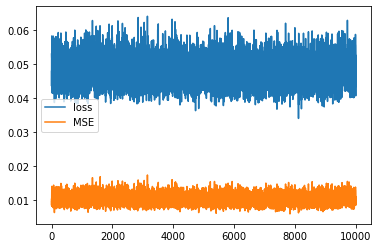

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


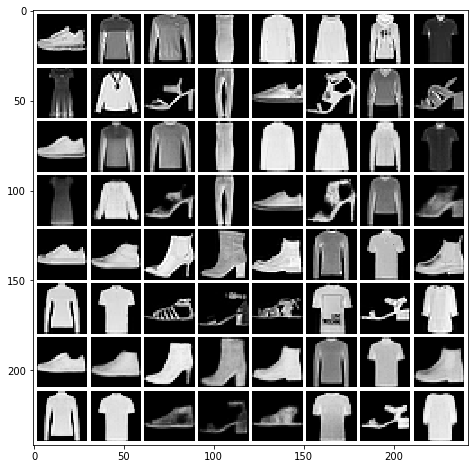

Mean squared dist: 0.010660679
epoch: 26 	 step:0 	 loss: 0.04985 	 reg loss: 0.001783
epoch: 26 	 step:100 	 loss: 0.04451 	 reg loss: 0.001699
epoch: 26 	 step:200 	 loss: 0.04502 	 reg loss: 0.001723
epoch: 26 	 step:300 	 loss: 0.04457 	 reg loss: 0.001711
epoch: 26 	 step:400 	 loss: 0.04919 	 reg loss: 0.001817
epoch: 26 	 step:500 	 loss: 0.04585 	 reg loss: 0.001805
epoch: 26 	 step:600 	 loss: 0.05698 	 reg loss: 0.001802
epoch: 26 	 step:700 	 loss: 0.04952 	 reg loss: 0.001736
epoch: 26 	 step:800 	 loss: 0.0458 	 reg loss: 0.001804
epoch: 26 	 step:900 	 loss: 0.0466 	 reg loss: 0.001685
epoch: 26 	 step:1000 	 loss: 0.0473 	 reg loss: 0.001768
epoch: 26 	 step:1100 	 loss: 0.04443 	 reg loss: 0.001636
epoch: 26 	 step:1200 	 loss: 0.0433 	 reg loss: 0.00178
epoch: 26 	 step:1300 	 loss: 0.0434 	 reg loss: 0.001673
epoch: 26 	 step:1400 	 loss: 0.04519 	 reg loss: 0.001767
epoch: 26 	 step:1500 	 loss: 0.04874 	 reg loss: 0.001658
epoch: 26 	 step:1600 	 loss: 0.04789 	 reg

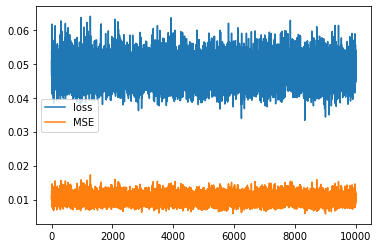

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


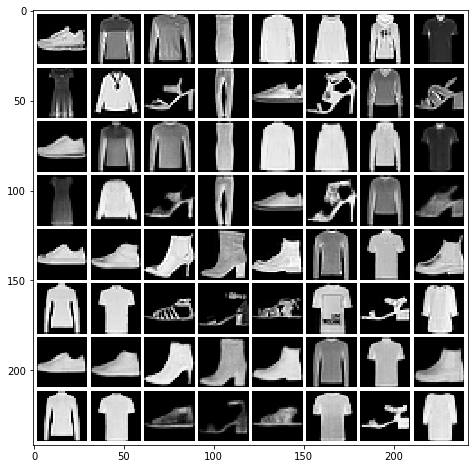

Mean squared dist: 0.0105204545
epoch: 27 	 step:0 	 loss: 0.04965 	 reg loss: 0.001778
epoch: 27 	 step:100 	 loss: 0.04669 	 reg loss: 0.001807
epoch: 27 	 step:200 	 loss: 0.04596 	 reg loss: 0.001724
epoch: 27 	 step:300 	 loss: 0.04675 	 reg loss: 0.001751
epoch: 27 	 step:400 	 loss: 0.04728 	 reg loss: 0.001695
epoch: 27 	 step:500 	 loss: 0.04791 	 reg loss: 0.001749
epoch: 27 	 step:600 	 loss: 0.04205 	 reg loss: 0.001699
epoch: 27 	 step:700 	 loss: 0.04981 	 reg loss: 0.001806
epoch: 27 	 step:800 	 loss: 0.04697 	 reg loss: 0.001718
epoch: 27 	 step:900 	 loss: 0.05282 	 reg loss: 0.001797
epoch: 27 	 step:1000 	 loss: 0.04094 	 reg loss: 0.001814
epoch: 27 	 step:1100 	 loss: 0.04873 	 reg loss: 0.001746
epoch: 27 	 step:1200 	 loss: 0.04487 	 reg loss: 0.001768
epoch: 27 	 step:1300 	 loss: 0.05023 	 reg loss: 0.001798
epoch: 27 	 step:1400 	 loss: 0.04764 	 reg loss: 0.001765
epoch: 27 	 step:1500 	 loss: 0.04776 	 reg loss: 0.001701
epoch: 27 	 step:1600 	 loss: 0.0464

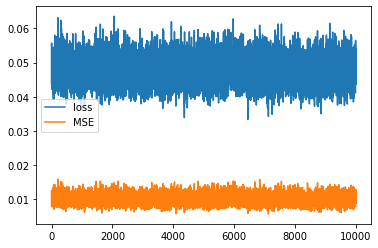

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


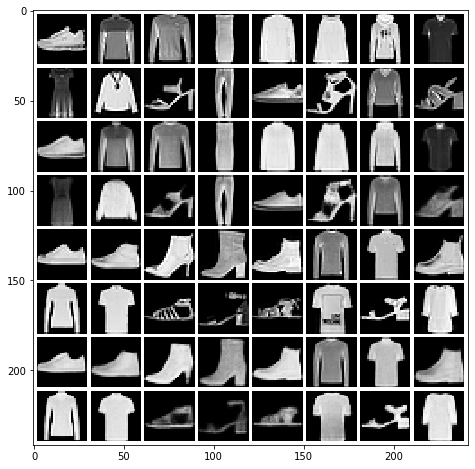

Mean squared dist: 0.010585692
epoch: 28 	 step:0 	 loss: 0.04974 	 reg loss: 0.00177
epoch: 28 	 step:100 	 loss: 0.03747 	 reg loss: 0.00173
epoch: 28 	 step:200 	 loss: 0.042 	 reg loss: 0.001811
epoch: 28 	 step:300 	 loss: 0.04677 	 reg loss: 0.001743
epoch: 28 	 step:400 	 loss: 0.03901 	 reg loss: 0.001686
epoch: 28 	 step:500 	 loss: 0.04431 	 reg loss: 0.001702
epoch: 28 	 step:600 	 loss: 0.05064 	 reg loss: 0.001822
epoch: 28 	 step:700 	 loss: 0.04529 	 reg loss: 0.001755
epoch: 28 	 step:800 	 loss: 0.04447 	 reg loss: 0.001742
epoch: 28 	 step:900 	 loss: 0.04759 	 reg loss: 0.001746
epoch: 28 	 step:1000 	 loss: 0.05167 	 reg loss: 0.00179
epoch: 28 	 step:1100 	 loss: 0.04657 	 reg loss: 0.001831
epoch: 28 	 step:1200 	 loss: 0.04614 	 reg loss: 0.001749
epoch: 28 	 step:1300 	 loss: 0.04442 	 reg loss: 0.001796
epoch: 28 	 step:1400 	 loss: 0.04612 	 reg loss: 0.001694
epoch: 28 	 step:1500 	 loss: 0.04318 	 reg loss: 0.00174
epoch: 28 	 step:1600 	 loss: 0.04733 	 reg

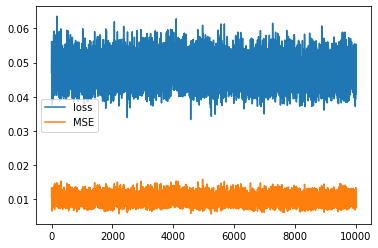

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


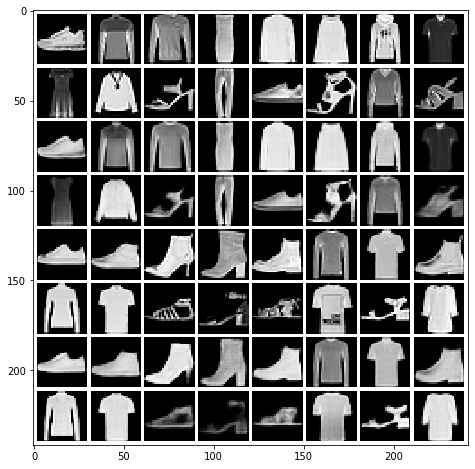

Mean squared dist: 0.010394649
epoch: 29 	 step:0 	 loss: 0.04197 	 reg loss: 0.001755
epoch: 29 	 step:100 	 loss: 0.04037 	 reg loss: 0.001732
epoch: 29 	 step:200 	 loss: 0.04648 	 reg loss: 0.001778
epoch: 29 	 step:300 	 loss: 0.04513 	 reg loss: 0.001693
epoch: 29 	 step:400 	 loss: 0.0523 	 reg loss: 0.001781
epoch: 29 	 step:500 	 loss: 0.04849 	 reg loss: 0.001791
epoch: 29 	 step:600 	 loss: 0.0443 	 reg loss: 0.001714
epoch: 29 	 step:700 	 loss: 0.03863 	 reg loss: 0.001714
epoch: 29 	 step:800 	 loss: 0.0425 	 reg loss: 0.001631
epoch: 29 	 step:900 	 loss: 0.04923 	 reg loss: 0.001737
epoch: 29 	 step:1000 	 loss: 0.04912 	 reg loss: 0.001726
epoch: 29 	 step:1100 	 loss: 0.0459 	 reg loss: 0.001792
epoch: 29 	 step:1200 	 loss: 0.0489 	 reg loss: 0.001714
epoch: 29 	 step:1300 	 loss: 0.04859 	 reg loss: 0.001721
epoch: 29 	 step:1400 	 loss: 0.04561 	 reg loss: 0.00177
epoch: 29 	 step:1500 	 loss: 0.04336 	 reg loss: 0.001703
epoch: 29 	 step:1600 	 loss: 0.04747 	 reg

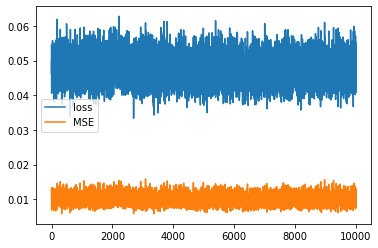

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


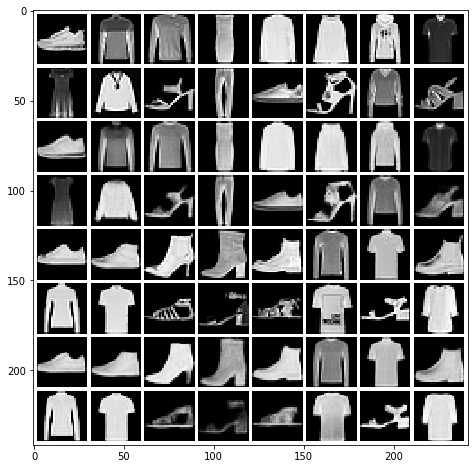

Mean squared dist: 0.010409108
epoch: 30 	 step:0 	 loss: 0.04421 	 reg loss: 0.001765
epoch: 30 	 step:100 	 loss: 0.04833 	 reg loss: 0.001774
epoch: 30 	 step:200 	 loss: 0.04502 	 reg loss: 0.001718
epoch: 30 	 step:300 	 loss: 0.0517 	 reg loss: 0.001753
epoch: 30 	 step:400 	 loss: 0.04363 	 reg loss: 0.001761
epoch: 30 	 step:500 	 loss: 0.05655 	 reg loss: 0.001813
epoch: 30 	 step:600 	 loss: 0.0466 	 reg loss: 0.001813
epoch: 30 	 step:700 	 loss: 0.05063 	 reg loss: 0.001822
epoch: 30 	 step:800 	 loss: 0.05193 	 reg loss: 0.001807
epoch: 30 	 step:900 	 loss: 0.04914 	 reg loss: 0.001764
epoch: 30 	 step:1000 	 loss: 0.0484 	 reg loss: 0.00169
epoch: 30 	 step:1100 	 loss: 0.05355 	 reg loss: 0.001782
epoch: 30 	 step:1200 	 loss: 0.04924 	 reg loss: 0.00178
epoch: 30 	 step:1300 	 loss: 0.04232 	 reg loss: 0.00173
epoch: 30 	 step:1400 	 loss: 0.04855 	 reg loss: 0.001737
epoch: 30 	 step:1500 	 loss: 0.05423 	 reg loss: 0.001748
epoch: 30 	 step:1600 	 loss: 0.04197 	 reg

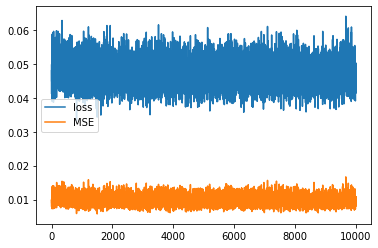

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


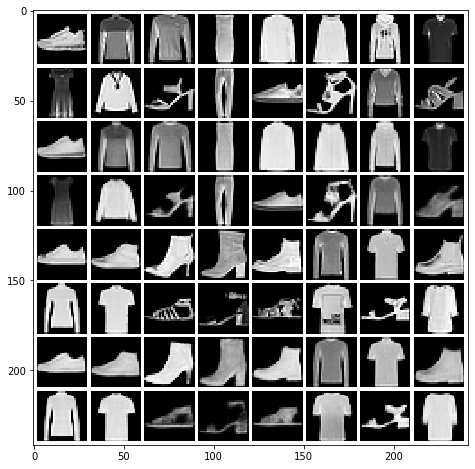

Mean squared dist: 0.010549816
epoch: 31 	 step:0 	 loss: 0.04453 	 reg loss: 0.001698
epoch: 31 	 step:100 	 loss: 0.04679 	 reg loss: 0.001778
epoch: 31 	 step:200 	 loss: 0.05205 	 reg loss: 0.001721
epoch: 31 	 step:300 	 loss: 0.05112 	 reg loss: 0.001813
epoch: 31 	 step:400 	 loss: 0.04497 	 reg loss: 0.001773
epoch: 31 	 step:500 	 loss: 0.04397 	 reg loss: 0.001719
epoch: 31 	 step:600 	 loss: 0.04737 	 reg loss: 0.001758
epoch: 31 	 step:700 	 loss: 0.04547 	 reg loss: 0.001786
epoch: 31 	 step:800 	 loss: 0.04293 	 reg loss: 0.001821
epoch: 31 	 step:900 	 loss: 0.03886 	 reg loss: 0.001689
epoch: 31 	 step:1000 	 loss: 0.04233 	 reg loss: 0.001773
epoch: 31 	 step:1100 	 loss: 0.05091 	 reg loss: 0.001751
epoch: 31 	 step:1200 	 loss: 0.04484 	 reg loss: 0.001691
epoch: 31 	 step:1300 	 loss: 0.04883 	 reg loss: 0.001814
epoch: 31 	 step:1400 	 loss: 0.0477 	 reg loss: 0.001673
epoch: 31 	 step:1500 	 loss: 0.05241 	 reg loss: 0.001717
epoch: 31 	 step:1600 	 loss: 0.05456 

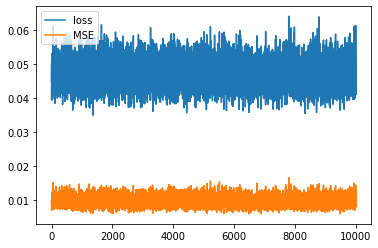

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


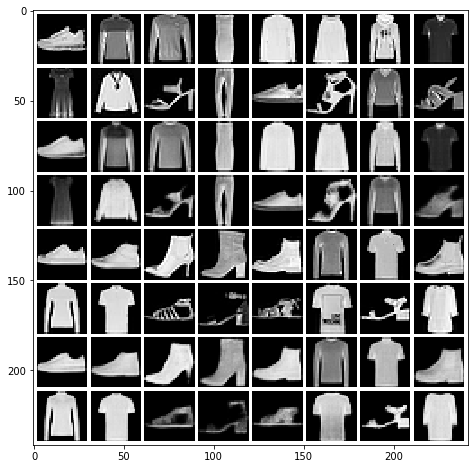

Mean squared dist: 0.010382655
epoch: 32 	 step:0 	 loss: 0.04376 	 reg loss: 0.001748
epoch: 32 	 step:100 	 loss: 0.04603 	 reg loss: 0.0018
epoch: 32 	 step:200 	 loss: 0.04333 	 reg loss: 0.001751
epoch: 32 	 step:300 	 loss: 0.04529 	 reg loss: 0.001724
epoch: 32 	 step:400 	 loss: 0.04263 	 reg loss: 0.001754
epoch: 32 	 step:500 	 loss: 0.0514 	 reg loss: 0.001702
epoch: 32 	 step:600 	 loss: 0.04827 	 reg loss: 0.001821
epoch: 32 	 step:700 	 loss: 0.04548 	 reg loss: 0.001739
epoch: 32 	 step:800 	 loss: 0.04441 	 reg loss: 0.001791
epoch: 32 	 step:900 	 loss: 0.04731 	 reg loss: 0.001719
epoch: 32 	 step:1000 	 loss: 0.04216 	 reg loss: 0.001689
epoch: 32 	 step:1100 	 loss: 0.04678 	 reg loss: 0.001779
epoch: 32 	 step:1200 	 loss: 0.04851 	 reg loss: 0.001659
epoch: 32 	 step:1300 	 loss: 0.04946 	 reg loss: 0.001753
epoch: 32 	 step:1400 	 loss: 0.04225 	 reg loss: 0.001746
epoch: 32 	 step:1500 	 loss: 0.04494 	 reg loss: 0.00172
epoch: 32 	 step:1600 	 loss: 0.04209 	 r

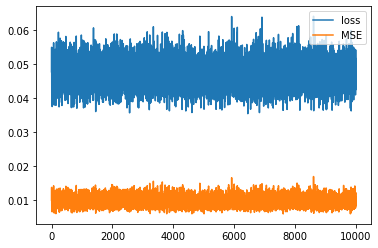

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


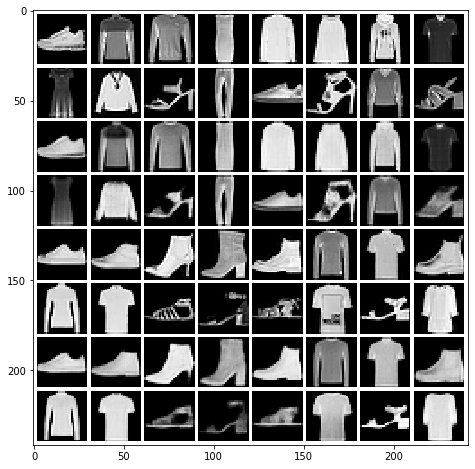

Mean squared dist: 0.010520908
epoch: 33 	 step:0 	 loss: 0.05197 	 reg loss: 0.00174
epoch: 33 	 step:100 	 loss: 0.04675 	 reg loss: 0.0017
epoch: 33 	 step:200 	 loss: 0.0485 	 reg loss: 0.001745
epoch: 33 	 step:300 	 loss: 0.04332 	 reg loss: 0.001742
epoch: 33 	 step:400 	 loss: 0.04505 	 reg loss: 0.001686
epoch: 33 	 step:500 	 loss: 0.04268 	 reg loss: 0.001737
epoch: 33 	 step:600 	 loss: 0.04217 	 reg loss: 0.001757
epoch: 33 	 step:700 	 loss: 0.03732 	 reg loss: 0.001699
epoch: 33 	 step:800 	 loss: 0.05599 	 reg loss: 0.00179
epoch: 33 	 step:900 	 loss: 0.04667 	 reg loss: 0.001775
epoch: 33 	 step:1000 	 loss: 0.0475 	 reg loss: 0.001721
epoch: 33 	 step:1100 	 loss: 0.05383 	 reg loss: 0.001806
epoch: 33 	 step:1200 	 loss: 0.04558 	 reg loss: 0.001797
epoch: 33 	 step:1300 	 loss: 0.04622 	 reg loss: 0.001829
epoch: 33 	 step:1400 	 loss: 0.05213 	 reg loss: 0.001862
epoch: 33 	 step:1500 	 loss: 0.04357 	 reg loss: 0.001709
epoch: 33 	 step:1600 	 loss: 0.046 	 reg l

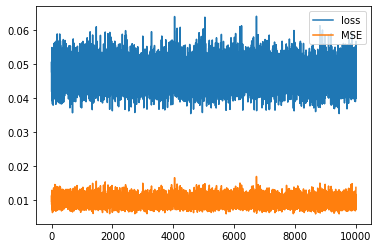

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


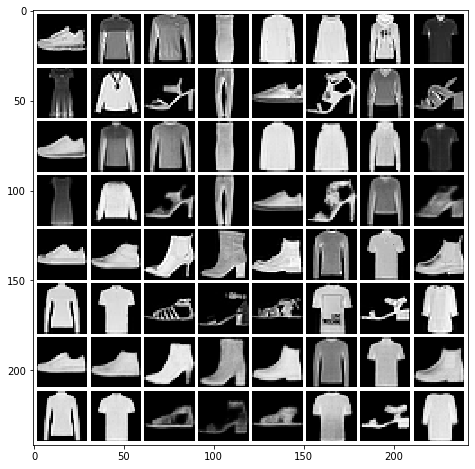

Mean squared dist: 0.010339568
epoch: 34 	 step:0 	 loss: 0.04112 	 reg loss: 0.001755
epoch: 34 	 step:100 	 loss: 0.049 	 reg loss: 0.001777
epoch: 34 	 step:200 	 loss: 0.04937 	 reg loss: 0.001809
epoch: 34 	 step:300 	 loss: 0.04866 	 reg loss: 0.001805
epoch: 34 	 step:400 	 loss: 0.04796 	 reg loss: 0.001749
epoch: 34 	 step:500 	 loss: 0.04522 	 reg loss: 0.001813
epoch: 34 	 step:600 	 loss: 0.05017 	 reg loss: 0.001832
epoch: 34 	 step:700 	 loss: 0.04274 	 reg loss: 0.001729
epoch: 34 	 step:800 	 loss: 0.04341 	 reg loss: 0.001793
epoch: 34 	 step:900 	 loss: 0.03942 	 reg loss: 0.001728
epoch: 34 	 step:1000 	 loss: 0.05226 	 reg loss: 0.001836
epoch: 34 	 step:1100 	 loss: 0.04967 	 reg loss: 0.001766
epoch: 34 	 step:1200 	 loss: 0.04865 	 reg loss: 0.001752
epoch: 34 	 step:1300 	 loss: 0.04751 	 reg loss: 0.00176
epoch: 34 	 step:1400 	 loss: 0.05127 	 reg loss: 0.001755
epoch: 34 	 step:1500 	 loss: 0.04812 	 reg loss: 0.001737
epoch: 34 	 step:1600 	 loss: 0.04404 	 

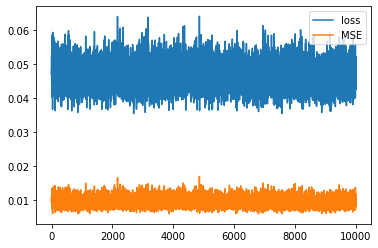

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


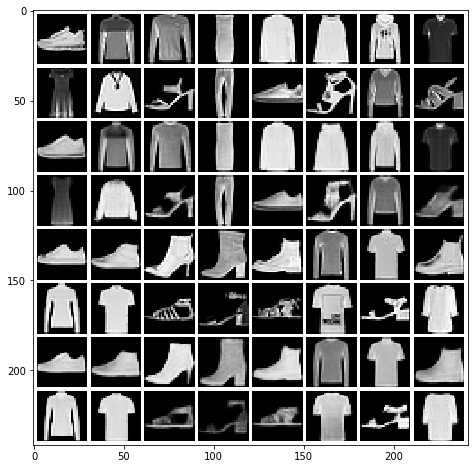

Mean squared dist: 0.010249364
epoch: 35 	 step:0 	 loss: 0.04473 	 reg loss: 0.001829
epoch: 35 	 step:100 	 loss: 0.0415 	 reg loss: 0.001733
epoch: 35 	 step:200 	 loss: 0.04355 	 reg loss: 0.001823
epoch: 35 	 step:300 	 loss: 0.04605 	 reg loss: 0.001758
epoch: 35 	 step:400 	 loss: 0.0469 	 reg loss: 0.001767
epoch: 35 	 step:500 	 loss: 0.04625 	 reg loss: 0.001798
epoch: 35 	 step:600 	 loss: 0.04598 	 reg loss: 0.001739
epoch: 35 	 step:700 	 loss: 0.04978 	 reg loss: 0.001812
epoch: 35 	 step:800 	 loss: 0.0468 	 reg loss: 0.001746
epoch: 35 	 step:900 	 loss: 0.04268 	 reg loss: 0.001813
epoch: 35 	 step:1000 	 loss: 0.04037 	 reg loss: 0.001762
epoch: 35 	 step:1100 	 loss: 0.04602 	 reg loss: 0.001835
epoch: 35 	 step:1200 	 loss: 0.04682 	 reg loss: 0.001694
epoch: 35 	 step:1300 	 loss: 0.04559 	 reg loss: 0.001664
epoch: 35 	 step:1400 	 loss: 0.04562 	 reg loss: 0.001792
epoch: 35 	 step:1500 	 loss: 0.04478 	 reg loss: 0.001697
epoch: 35 	 step:1600 	 loss: 0.04222 	 

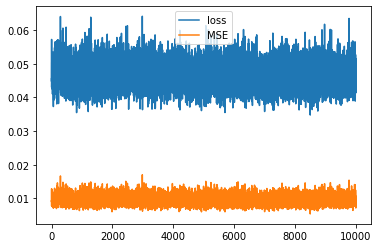

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


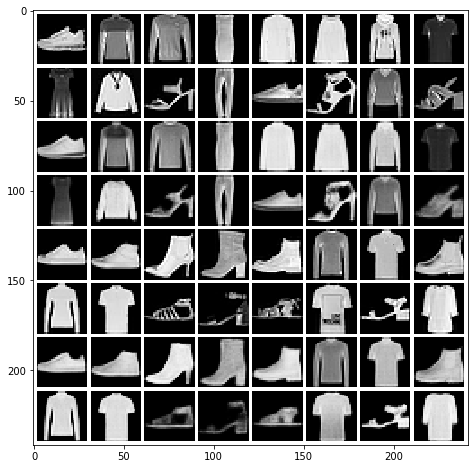

Mean squared dist: 0.010335744
epoch: 36 	 step:0 	 loss: 0.03891 	 reg loss: 0.001774
epoch: 36 	 step:100 	 loss: 0.04585 	 reg loss: 0.001752
epoch: 36 	 step:200 	 loss: 0.04433 	 reg loss: 0.001734
epoch: 36 	 step:300 	 loss: 0.04185 	 reg loss: 0.001785
epoch: 36 	 step:400 	 loss: 0.04997 	 reg loss: 0.001767
epoch: 36 	 step:500 	 loss: 0.04574 	 reg loss: 0.001752
epoch: 36 	 step:600 	 loss: 0.05401 	 reg loss: 0.001821
epoch: 36 	 step:700 	 loss: 0.04678 	 reg loss: 0.001675
epoch: 36 	 step:800 	 loss: 0.05137 	 reg loss: 0.001838
epoch: 36 	 step:900 	 loss: 0.04837 	 reg loss: 0.001766
epoch: 36 	 step:1000 	 loss: 0.04706 	 reg loss: 0.001741
epoch: 36 	 step:1100 	 loss: 0.04947 	 reg loss: 0.00178
epoch: 36 	 step:1200 	 loss: 0.04765 	 reg loss: 0.001744
epoch: 36 	 step:1300 	 loss: 0.04409 	 reg loss: 0.001778
epoch: 36 	 step:1400 	 loss: 0.04769 	 reg loss: 0.001779
epoch: 36 	 step:1500 	 loss: 0.04351 	 reg loss: 0.001702
epoch: 36 	 step:1600 	 loss: 0.04705 

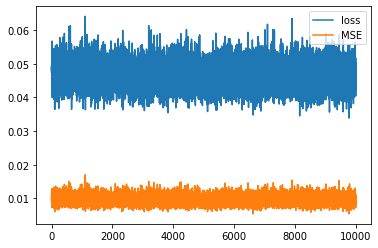

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


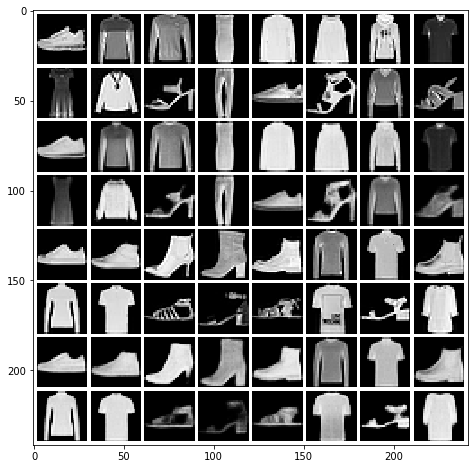

Mean squared dist: 0.010254464
epoch: 37 	 step:0 	 loss: 0.05004 	 reg loss: 0.001762
epoch: 37 	 step:100 	 loss: 0.04823 	 reg loss: 0.001797
epoch: 37 	 step:200 	 loss: 0.0476 	 reg loss: 0.001701
epoch: 37 	 step:300 	 loss: 0.04855 	 reg loss: 0.001719
epoch: 37 	 step:400 	 loss: 0.04173 	 reg loss: 0.001751
epoch: 37 	 step:500 	 loss: 0.04033 	 reg loss: 0.001782
epoch: 37 	 step:600 	 loss: 0.0431 	 reg loss: 0.001777
epoch: 37 	 step:700 	 loss: 0.04609 	 reg loss: 0.001732
epoch: 37 	 step:800 	 loss: 0.04825 	 reg loss: 0.001838
epoch: 37 	 step:900 	 loss: 0.04012 	 reg loss: 0.001722
epoch: 37 	 step:1000 	 loss: 0.04477 	 reg loss: 0.001653
epoch: 37 	 step:1100 	 loss: 0.04344 	 reg loss: 0.001772
epoch: 37 	 step:1200 	 loss: 0.04763 	 reg loss: 0.001738
epoch: 37 	 step:1300 	 loss: 0.04943 	 reg loss: 0.001731
epoch: 37 	 step:1400 	 loss: 0.04869 	 reg loss: 0.00179
epoch: 37 	 step:1500 	 loss: 0.04961 	 reg loss: 0.001736
epoch: 37 	 step:1600 	 loss: 0.04428 	 

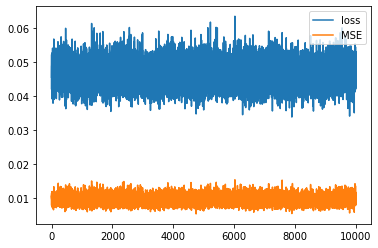

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


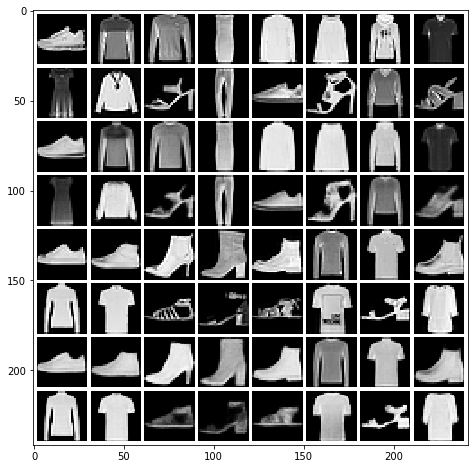

Mean squared dist: 0.010302218
epoch: 38 	 step:0 	 loss: 0.05075 	 reg loss: 0.001716
epoch: 38 	 step:100 	 loss: 0.04447 	 reg loss: 0.001692
epoch: 38 	 step:200 	 loss: 0.04815 	 reg loss: 0.001814
epoch: 38 	 step:300 	 loss: 0.04628 	 reg loss: 0.001767
epoch: 38 	 step:400 	 loss: 0.04298 	 reg loss: 0.001673
epoch: 38 	 step:500 	 loss: 0.0383 	 reg loss: 0.001771
epoch: 38 	 step:600 	 loss: 0.04369 	 reg loss: 0.001738
epoch: 38 	 step:700 	 loss: 0.05187 	 reg loss: 0.001797
epoch: 38 	 step:800 	 loss: 0.04518 	 reg loss: 0.001842
epoch: 38 	 step:900 	 loss: 0.04338 	 reg loss: 0.001729
epoch: 38 	 step:1000 	 loss: 0.04836 	 reg loss: 0.001828
epoch: 38 	 step:1100 	 loss: 0.04836 	 reg loss: 0.001684
epoch: 38 	 step:1200 	 loss: 0.04487 	 reg loss: 0.001655
epoch: 38 	 step:1300 	 loss: 0.04907 	 reg loss: 0.001819
epoch: 38 	 step:1400 	 loss: 0.04889 	 reg loss: 0.001729
epoch: 38 	 step:1500 	 loss: 0.04855 	 reg loss: 0.001735
epoch: 38 	 step:1600 	 loss: 0.04774 

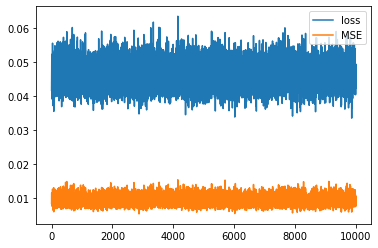

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


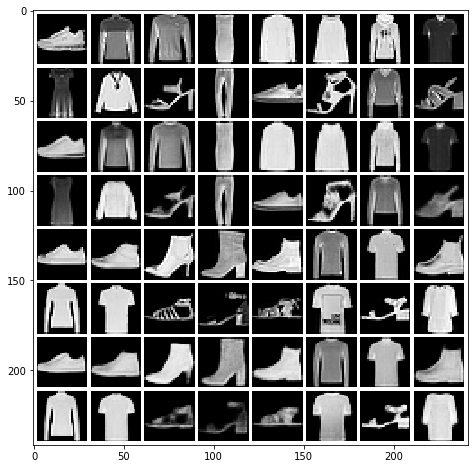

Mean squared dist: 0.010334424
epoch: 39 	 step:0 	 loss: 0.05346 	 reg loss: 0.001804
epoch: 39 	 step:100 	 loss: 0.04622 	 reg loss: 0.001794
epoch: 39 	 step:200 	 loss: 0.05083 	 reg loss: 0.001753
epoch: 39 	 step:300 	 loss: 0.04108 	 reg loss: 0.001685
epoch: 39 	 step:400 	 loss: 0.04608 	 reg loss: 0.001864
epoch: 39 	 step:500 	 loss: 0.04194 	 reg loss: 0.001754
epoch: 39 	 step:600 	 loss: 0.04864 	 reg loss: 0.001787
epoch: 39 	 step:700 	 loss: 0.04891 	 reg loss: 0.001765
epoch: 39 	 step:800 	 loss: 0.04944 	 reg loss: 0.001805
epoch: 39 	 step:900 	 loss: 0.04248 	 reg loss: 0.001685
epoch: 39 	 step:1000 	 loss: 0.04279 	 reg loss: 0.001855
epoch: 39 	 step:1100 	 loss: 0.04393 	 reg loss: 0.001737
epoch: 39 	 step:1200 	 loss: 0.05271 	 reg loss: 0.001742
epoch: 39 	 step:1300 	 loss: 0.0412 	 reg loss: 0.001793
epoch: 39 	 step:1400 	 loss: 0.04936 	 reg loss: 0.00182
epoch: 39 	 step:1500 	 loss: 0.04831 	 reg loss: 0.001799
epoch: 39 	 step:1600 	 loss: 0.04651 	

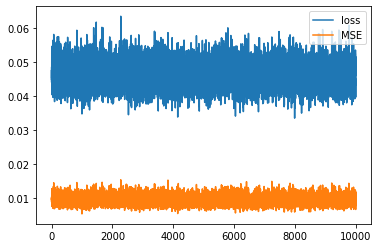

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


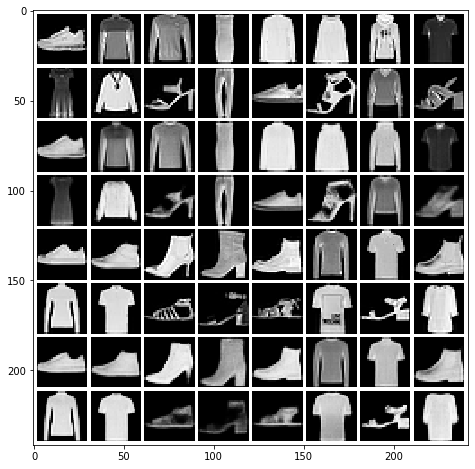

Mean squared dist: 0.010309885
epoch: 40 	 step:0 	 loss: 0.04206 	 reg loss: 0.001734
epoch: 40 	 step:100 	 loss: 0.04142 	 reg loss: 0.001721
epoch: 40 	 step:200 	 loss: 0.04063 	 reg loss: 0.001767
epoch: 40 	 step:300 	 loss: 0.04729 	 reg loss: 0.001775
epoch: 40 	 step:400 	 loss: 0.05517 	 reg loss: 0.001737
epoch: 40 	 step:500 	 loss: 0.04514 	 reg loss: 0.001798
epoch: 40 	 step:600 	 loss: 0.04322 	 reg loss: 0.001663
epoch: 40 	 step:700 	 loss: 0.04457 	 reg loss: 0.001838
epoch: 40 	 step:800 	 loss: 0.04421 	 reg loss: 0.001773
epoch: 40 	 step:900 	 loss: 0.04785 	 reg loss: 0.001705
epoch: 40 	 step:1000 	 loss: 0.04612 	 reg loss: 0.001722
epoch: 40 	 step:1100 	 loss: 0.04405 	 reg loss: 0.001811
epoch: 40 	 step:1200 	 loss: 0.04379 	 reg loss: 0.001715
epoch: 40 	 step:1300 	 loss: 0.04617 	 reg loss: 0.001725
epoch: 40 	 step:1400 	 loss: 0.04569 	 reg loss: 0.001763
epoch: 40 	 step:1500 	 loss: 0.04486 	 reg loss: 0.001728
epoch: 40 	 step:1600 	 loss: 0.05114

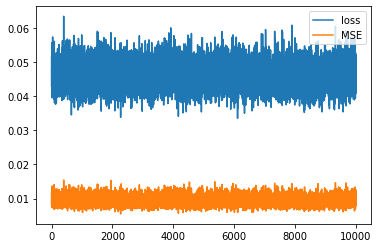

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


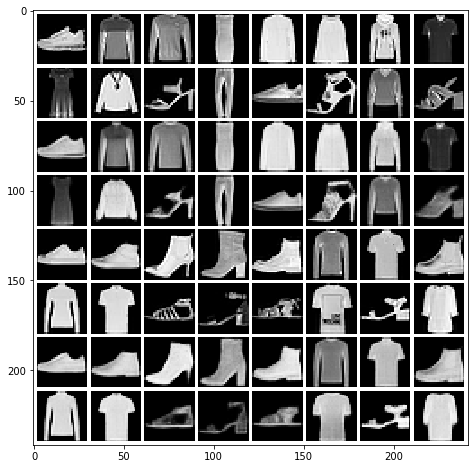

Mean squared dist: 0.0102526555
epoch: 41 	 step:0 	 loss: 0.04826 	 reg loss: 0.00189
epoch: 41 	 step:100 	 loss: 0.05151 	 reg loss: 0.001729
epoch: 41 	 step:200 	 loss: 0.03882 	 reg loss: 0.001739
epoch: 41 	 step:300 	 loss: 0.04082 	 reg loss: 0.001727
epoch: 41 	 step:400 	 loss: 0.04481 	 reg loss: 0.001747
epoch: 41 	 step:500 	 loss: 0.05528 	 reg loss: 0.001847
epoch: 41 	 step:600 	 loss: 0.0474 	 reg loss: 0.001672
epoch: 41 	 step:700 	 loss: 0.04094 	 reg loss: 0.001704
epoch: 41 	 step:800 	 loss: 0.0413 	 reg loss: 0.001778
epoch: 41 	 step:900 	 loss: 0.04039 	 reg loss: 0.001689
epoch: 41 	 step:1000 	 loss: 0.04753 	 reg loss: 0.001753
epoch: 41 	 step:1100 	 loss: 0.04507 	 reg loss: 0.001804
epoch: 41 	 step:1200 	 loss: 0.04312 	 reg loss: 0.001724
epoch: 41 	 step:1300 	 loss: 0.04012 	 reg loss: 0.001694
epoch: 41 	 step:1400 	 loss: 0.04825 	 reg loss: 0.00177
epoch: 41 	 step:1500 	 loss: 0.04512 	 reg loss: 0.00175
epoch: 41 	 step:1600 	 loss: 0.04573 	 r

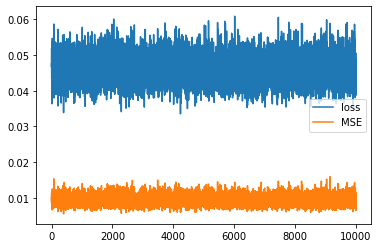

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


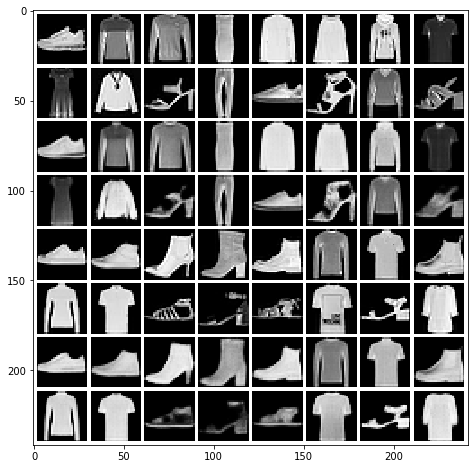

Mean squared dist: 0.0103037935
epoch: 42 	 step:0 	 loss: 0.0431 	 reg loss: 0.001804
epoch: 42 	 step:100 	 loss: 0.05226 	 reg loss: 0.001752
epoch: 42 	 step:200 	 loss: 0.0446 	 reg loss: 0.001753
epoch: 42 	 step:300 	 loss: 0.0446 	 reg loss: 0.001706
epoch: 42 	 step:400 	 loss: 0.04541 	 reg loss: 0.001771
epoch: 42 	 step:500 	 loss: 0.04258 	 reg loss: 0.001762
epoch: 42 	 step:600 	 loss: 0.04494 	 reg loss: 0.001765
epoch: 42 	 step:700 	 loss: 0.04644 	 reg loss: 0.001723
epoch: 42 	 step:800 	 loss: 0.04147 	 reg loss: 0.00178
epoch: 42 	 step:900 	 loss: 0.04747 	 reg loss: 0.001776
epoch: 42 	 step:1000 	 loss: 0.04162 	 reg loss: 0.001636
epoch: 42 	 step:1100 	 loss: 0.05553 	 reg loss: 0.001867
epoch: 42 	 step:1200 	 loss: 0.05215 	 reg loss: 0.001742
epoch: 42 	 step:1300 	 loss: 0.04758 	 reg loss: 0.001764
epoch: 42 	 step:1400 	 loss: 0.04803 	 reg loss: 0.001768
epoch: 42 	 step:1500 	 loss: 0.04625 	 reg loss: 0.001905
epoch: 42 	 step:1600 	 loss: 0.04367 	 

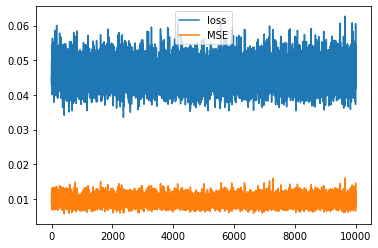

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


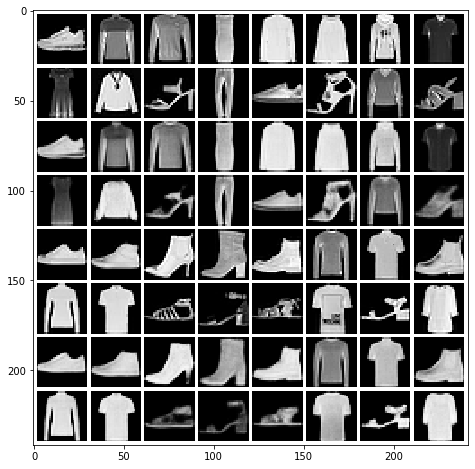

Mean squared dist: 0.01021519
epoch: 43 	 step:0 	 loss: 0.04444 	 reg loss: 0.001776
epoch: 43 	 step:100 	 loss: 0.05254 	 reg loss: 0.001756
epoch: 43 	 step:200 	 loss: 0.05397 	 reg loss: 0.001802
epoch: 43 	 step:300 	 loss: 0.05276 	 reg loss: 0.00173
epoch: 43 	 step:400 	 loss: 0.04112 	 reg loss: 0.001785
epoch: 43 	 step:500 	 loss: 0.04506 	 reg loss: 0.00175
epoch: 43 	 step:600 	 loss: 0.04942 	 reg loss: 0.001822
epoch: 43 	 step:700 	 loss: 0.0499 	 reg loss: 0.001774
epoch: 43 	 step:800 	 loss: 0.04167 	 reg loss: 0.001769
epoch: 43 	 step:900 	 loss: 0.04484 	 reg loss: 0.001675
epoch: 43 	 step:1000 	 loss: 0.04477 	 reg loss: 0.001758
epoch: 43 	 step:1100 	 loss: 0.0421 	 reg loss: 0.001715
epoch: 43 	 step:1200 	 loss: 0.04449 	 reg loss: 0.001776
epoch: 43 	 step:1300 	 loss: 0.04655 	 reg loss: 0.00171
epoch: 43 	 step:1400 	 loss: 0.04733 	 reg loss: 0.001744
epoch: 43 	 step:1500 	 loss: 0.0465 	 reg loss: 0.001854
epoch: 43 	 step:1600 	 loss: 0.05296 	 reg 

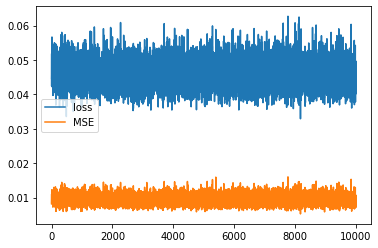

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


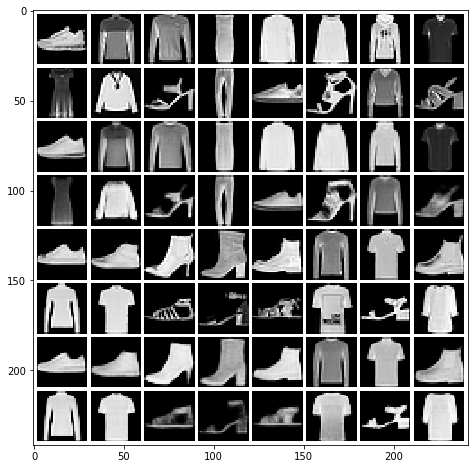

Mean squared dist: 0.010276014
epoch: 44 	 step:0 	 loss: 0.04734 	 reg loss: 0.001825
epoch: 44 	 step:100 	 loss: 0.0361 	 reg loss: 0.001746
epoch: 44 	 step:200 	 loss: 0.04299 	 reg loss: 0.001803
epoch: 44 	 step:300 	 loss: 0.04516 	 reg loss: 0.001755
epoch: 44 	 step:400 	 loss: 0.04517 	 reg loss: 0.001694
epoch: 44 	 step:500 	 loss: 0.05112 	 reg loss: 0.001797
epoch: 44 	 step:600 	 loss: 0.05082 	 reg loss: 0.001756
epoch: 44 	 step:700 	 loss: 0.0392 	 reg loss: 0.001708
epoch: 44 	 step:800 	 loss: 0.04777 	 reg loss: 0.001797
epoch: 44 	 step:900 	 loss: 0.05031 	 reg loss: 0.001779
epoch: 44 	 step:1000 	 loss: 0.04685 	 reg loss: 0.00181
epoch: 44 	 step:1100 	 loss: 0.04783 	 reg loss: 0.001738
epoch: 44 	 step:1200 	 loss: 0.04577 	 reg loss: 0.00172
epoch: 44 	 step:1300 	 loss: 0.05072 	 reg loss: 0.001744
epoch: 44 	 step:1400 	 loss: 0.04448 	 reg loss: 0.001681
epoch: 44 	 step:1500 	 loss: 0.05063 	 reg loss: 0.001874
epoch: 44 	 step:1600 	 loss: 0.05207 	 r

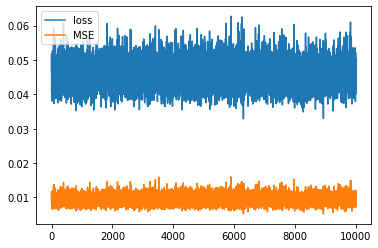

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


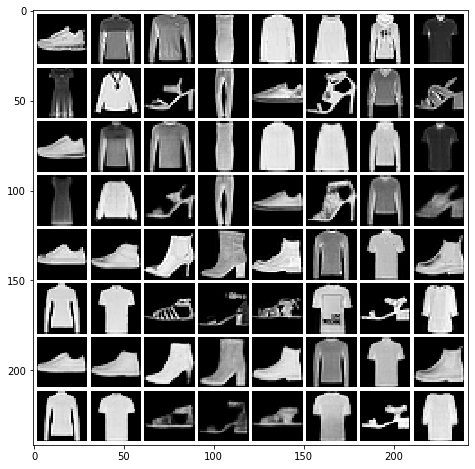

Mean squared dist: 0.010174258
epoch: 45 	 step:0 	 loss: 0.04699 	 reg loss: 0.001837
epoch: 45 	 step:100 	 loss: 0.04436 	 reg loss: 0.001799
epoch: 45 	 step:200 	 loss: 0.0447 	 reg loss: 0.00173
epoch: 45 	 step:300 	 loss: 0.04648 	 reg loss: 0.001753
epoch: 45 	 step:400 	 loss: 0.04909 	 reg loss: 0.001793
epoch: 45 	 step:500 	 loss: 0.04054 	 reg loss: 0.001732
epoch: 45 	 step:600 	 loss: 0.04129 	 reg loss: 0.001781
epoch: 45 	 step:700 	 loss: 0.04631 	 reg loss: 0.001775
epoch: 45 	 step:800 	 loss: 0.04475 	 reg loss: 0.001721
epoch: 45 	 step:900 	 loss: 0.04528 	 reg loss: 0.001755
epoch: 45 	 step:1000 	 loss: 0.05047 	 reg loss: 0.001787
epoch: 45 	 step:1100 	 loss: 0.04151 	 reg loss: 0.001725
epoch: 45 	 step:1200 	 loss: 0.047 	 reg loss: 0.001736
epoch: 45 	 step:1300 	 loss: 0.04657 	 reg loss: 0.001748
epoch: 45 	 step:1400 	 loss: 0.04769 	 reg loss: 0.001748
epoch: 45 	 step:1500 	 loss: 0.04469 	 reg loss: 0.001758
epoch: 45 	 step:1600 	 loss: 0.05091 	 r

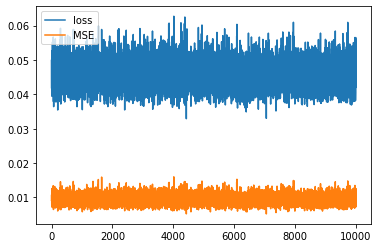

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


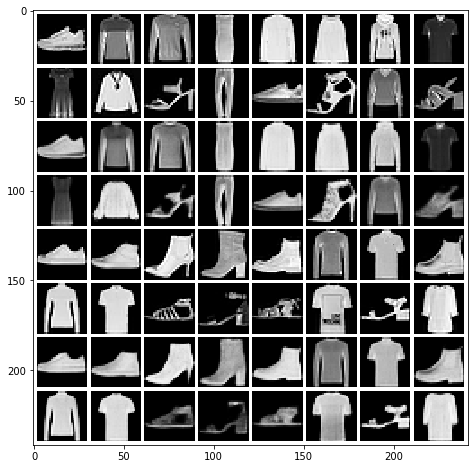

Mean squared dist: 0.010162655
epoch: 46 	 step:0 	 loss: 0.0434 	 reg loss: 0.001726
epoch: 46 	 step:100 	 loss: 0.04689 	 reg loss: 0.001745
epoch: 46 	 step:200 	 loss: 0.05252 	 reg loss: 0.001767
epoch: 46 	 step:300 	 loss: 0.04565 	 reg loss: 0.001773
epoch: 46 	 step:400 	 loss: 0.04828 	 reg loss: 0.001823
epoch: 46 	 step:500 	 loss: 0.04241 	 reg loss: 0.001727
epoch: 46 	 step:600 	 loss: 0.04549 	 reg loss: 0.001744
epoch: 46 	 step:700 	 loss: 0.04445 	 reg loss: 0.001817
epoch: 46 	 step:800 	 loss: 0.04736 	 reg loss: 0.001712
epoch: 46 	 step:900 	 loss: 0.04641 	 reg loss: 0.001799
epoch: 46 	 step:1000 	 loss: 0.04016 	 reg loss: 0.001758
epoch: 46 	 step:1100 	 loss: 0.04798 	 reg loss: 0.001737
epoch: 46 	 step:1200 	 loss: 0.04982 	 reg loss: 0.001688
epoch: 46 	 step:1300 	 loss: 0.04958 	 reg loss: 0.001787
epoch: 46 	 step:1400 	 loss: 0.04888 	 reg loss: 0.001734
epoch: 46 	 step:1500 	 loss: 0.04494 	 reg loss: 0.001673
epoch: 46 	 step:1600 	 loss: 0.04502 

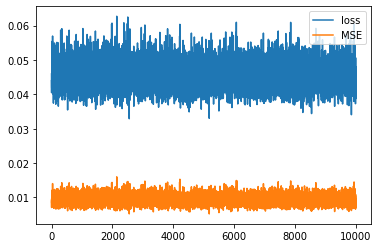

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


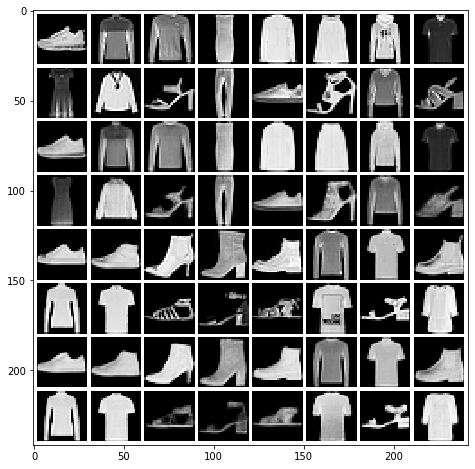

Mean squared dist: 0.01018014
epoch: 47 	 step:0 	 loss: 0.04626 	 reg loss: 0.001827
epoch: 47 	 step:100 	 loss: 0.04248 	 reg loss: 0.001681
epoch: 47 	 step:200 	 loss: 0.03931 	 reg loss: 0.001748
epoch: 47 	 step:300 	 loss: 0.04435 	 reg loss: 0.001739
epoch: 47 	 step:400 	 loss: 0.03902 	 reg loss: 0.001761
epoch: 47 	 step:500 	 loss: 0.04471 	 reg loss: 0.001794
epoch: 47 	 step:600 	 loss: 0.04134 	 reg loss: 0.001719
epoch: 47 	 step:700 	 loss: 0.05481 	 reg loss: 0.001763
epoch: 47 	 step:800 	 loss: 0.04514 	 reg loss: 0.00175
epoch: 47 	 step:900 	 loss: 0.04513 	 reg loss: 0.001664
epoch: 47 	 step:1000 	 loss: 0.04687 	 reg loss: 0.001774
epoch: 47 	 step:1100 	 loss: 0.05356 	 reg loss: 0.001843
epoch: 47 	 step:1200 	 loss: 0.04635 	 reg loss: 0.001741
epoch: 47 	 step:1300 	 loss: 0.05409 	 reg loss: 0.001784
epoch: 47 	 step:1400 	 loss: 0.03993 	 reg loss: 0.00182
epoch: 47 	 step:1500 	 loss: 0.0477 	 reg loss: 0.001724
epoch: 47 	 step:1600 	 loss: 0.04921 	 r

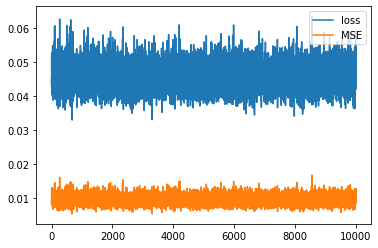

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


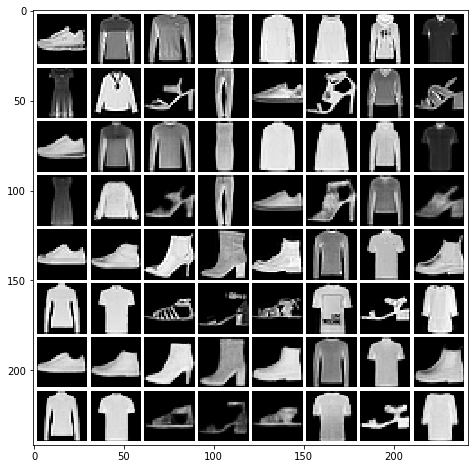

Mean squared dist: 0.010003243
epoch: 48 	 step:0 	 loss: 0.04229 	 reg loss: 0.00172
epoch: 48 	 step:100 	 loss: 0.04801 	 reg loss: 0.001769
epoch: 48 	 step:200 	 loss: 0.04132 	 reg loss: 0.001718
epoch: 48 	 step:300 	 loss: 0.04452 	 reg loss: 0.001734
epoch: 48 	 step:400 	 loss: 0.04178 	 reg loss: 0.001736
epoch: 48 	 step:500 	 loss: 0.04882 	 reg loss: 0.001796
epoch: 48 	 step:600 	 loss: 0.04487 	 reg loss: 0.00179
epoch: 48 	 step:700 	 loss: 0.05764 	 reg loss: 0.00182
epoch: 48 	 step:800 	 loss: 0.04165 	 reg loss: 0.001692
epoch: 48 	 step:900 	 loss: 0.04275 	 reg loss: 0.001749
epoch: 48 	 step:1000 	 loss: 0.03818 	 reg loss: 0.001734
epoch: 48 	 step:1100 	 loss: 0.04634 	 reg loss: 0.001735
epoch: 48 	 step:1200 	 loss: 0.04811 	 reg loss: 0.001828
epoch: 48 	 step:1300 	 loss: 0.04528 	 reg loss: 0.001729
epoch: 48 	 step:1400 	 loss: 0.0439 	 reg loss: 0.001744
epoch: 48 	 step:1500 	 loss: 0.04172 	 reg loss: 0.001765
epoch: 48 	 step:1600 	 loss: 0.04854 	 r

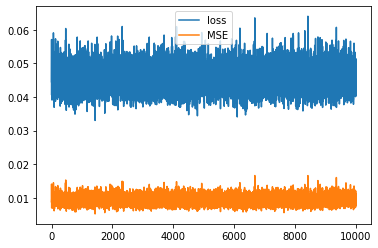

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


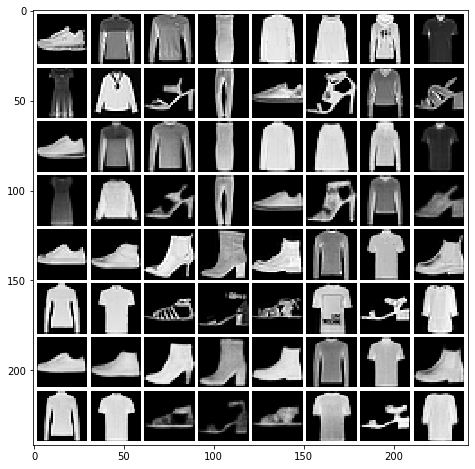

Mean squared dist: 0.010173681
epoch: 49 	 step:0 	 loss: 0.04702 	 reg loss: 0.001773
epoch: 49 	 step:100 	 loss: 0.04825 	 reg loss: 0.001712
epoch: 49 	 step:200 	 loss: 0.04563 	 reg loss: 0.001768
epoch: 49 	 step:300 	 loss: 0.04832 	 reg loss: 0.001767
epoch: 49 	 step:400 	 loss: 0.0443 	 reg loss: 0.001745
epoch: 49 	 step:500 	 loss: 0.05018 	 reg loss: 0.001827
epoch: 49 	 step:600 	 loss: 0.04099 	 reg loss: 0.001747
epoch: 49 	 step:700 	 loss: 0.0437 	 reg loss: 0.001775
epoch: 49 	 step:800 	 loss: 0.04493 	 reg loss: 0.001755
epoch: 49 	 step:900 	 loss: 0.0468 	 reg loss: 0.001671
epoch: 49 	 step:1000 	 loss: 0.04171 	 reg loss: 0.001701
epoch: 49 	 step:1100 	 loss: 0.04368 	 reg loss: 0.001678
epoch: 49 	 step:1200 	 loss: 0.04636 	 reg loss: 0.001732
epoch: 49 	 step:1300 	 loss: 0.04768 	 reg loss: 0.001733
epoch: 49 	 step:1400 	 loss: 0.04915 	 reg loss: 0.001773
epoch: 49 	 step:1500 	 loss: 0.04627 	 reg loss: 0.001722
epoch: 49 	 step:1600 	 loss: 0.04563 	 

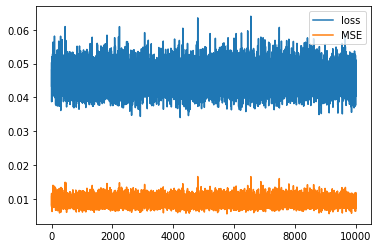

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


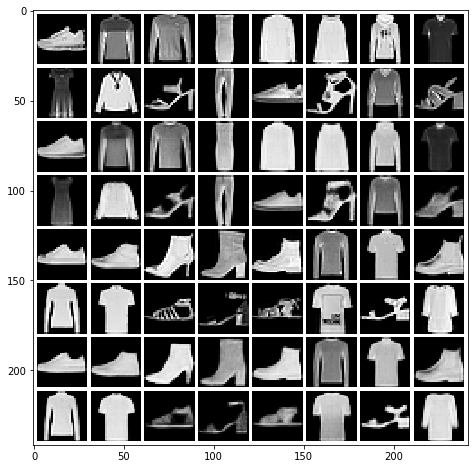

Mean squared dist: 0.010261044
epoch: 50 	 step:0 	 loss: 0.04661 	 reg loss: 0.001742
epoch: 50 	 step:100 	 loss: 0.04613 	 reg loss: 0.001797
epoch: 50 	 step:200 	 loss: 0.04577 	 reg loss: 0.001716
epoch: 50 	 step:300 	 loss: 0.04521 	 reg loss: 0.001804
epoch: 50 	 step:400 	 loss: 0.04492 	 reg loss: 0.001725
epoch: 50 	 step:500 	 loss: 0.04702 	 reg loss: 0.001767
epoch: 50 	 step:600 	 loss: 0.05167 	 reg loss: 0.00169
epoch: 50 	 step:700 	 loss: 0.05206 	 reg loss: 0.001792
epoch: 50 	 step:800 	 loss: 0.04523 	 reg loss: 0.001734
epoch: 50 	 step:900 	 loss: 0.04735 	 reg loss: 0.001736
epoch: 50 	 step:1000 	 loss: 0.05067 	 reg loss: 0.00177
epoch: 50 	 step:1100 	 loss: 0.04596 	 reg loss: 0.001673
epoch: 50 	 step:1200 	 loss: 0.04787 	 reg loss: 0.001732
epoch: 50 	 step:1300 	 loss: 0.04858 	 reg loss: 0.001689
epoch: 50 	 step:1400 	 loss: 0.04824 	 reg loss: 0.001782
epoch: 50 	 step:1500 	 loss: 0.04922 	 reg loss: 0.001805
epoch: 50 	 step:1600 	 loss: 0.04732 	

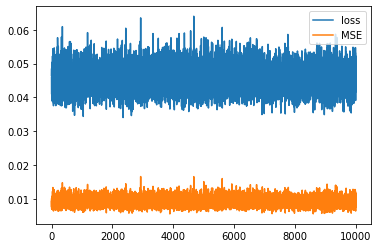

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


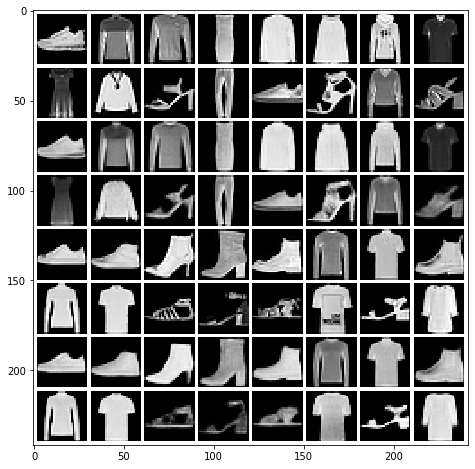

Mean squared dist: 0.010045598
epoch: 51 	 step:0 	 loss: 0.04961 	 reg loss: 0.001681
epoch: 51 	 step:100 	 loss: 0.04245 	 reg loss: 0.001724
epoch: 51 	 step:200 	 loss: 0.04725 	 reg loss: 0.001732
epoch: 51 	 step:300 	 loss: 0.04518 	 reg loss: 0.00176
epoch: 51 	 step:400 	 loss: 0.05114 	 reg loss: 0.001817
epoch: 51 	 step:500 	 loss: 0.03882 	 reg loss: 0.001695
epoch: 51 	 step:600 	 loss: 0.0417 	 reg loss: 0.001661
epoch: 51 	 step:700 	 loss: 0.05003 	 reg loss: 0.001774
epoch: 51 	 step:800 	 loss: 0.04973 	 reg loss: 0.001758
epoch: 51 	 step:900 	 loss: 0.03944 	 reg loss: 0.001771
epoch: 51 	 step:1000 	 loss: 0.04127 	 reg loss: 0.001744
epoch: 51 	 step:1100 	 loss: 0.03841 	 reg loss: 0.0017
epoch: 51 	 step:1200 	 loss: 0.04542 	 reg loss: 0.001706
epoch: 51 	 step:1300 	 loss: 0.04386 	 reg loss: 0.001796
epoch: 51 	 step:1400 	 loss: 0.04613 	 reg loss: 0.00171
epoch: 51 	 step:1500 	 loss: 0.04057 	 reg loss: 0.001707
epoch: 51 	 step:1600 	 loss: 0.04533 	 re

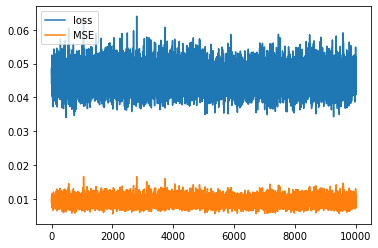

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


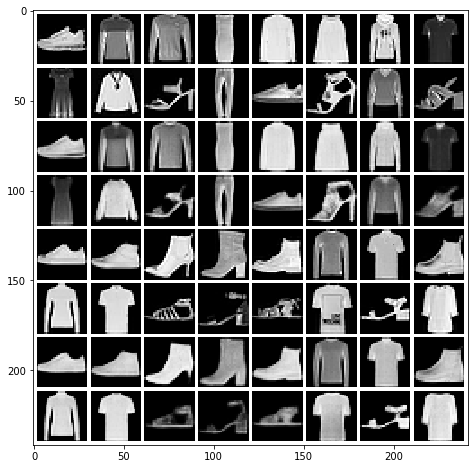

Mean squared dist: 0.010206549
epoch: 52 	 step:0 	 loss: 0.04688 	 reg loss: 0.001786
epoch: 52 	 step:100 	 loss: 0.04532 	 reg loss: 0.001773
epoch: 52 	 step:200 	 loss: 0.0468 	 reg loss: 0.001749
epoch: 52 	 step:300 	 loss: 0.04193 	 reg loss: 0.001762
epoch: 52 	 step:400 	 loss: 0.04469 	 reg loss: 0.001758
epoch: 52 	 step:500 	 loss: 0.04549 	 reg loss: 0.001788
epoch: 52 	 step:600 	 loss: 0.04652 	 reg loss: 0.001746
epoch: 52 	 step:700 	 loss: 0.04686 	 reg loss: 0.001674
epoch: 52 	 step:800 	 loss: 0.04555 	 reg loss: 0.001765
epoch: 52 	 step:900 	 loss: 0.03861 	 reg loss: 0.001694
epoch: 52 	 step:1000 	 loss: 0.0415 	 reg loss: 0.001685
epoch: 52 	 step:1100 	 loss: 0.04859 	 reg loss: 0.001751
epoch: 52 	 step:1200 	 loss: 0.04543 	 reg loss: 0.001763
epoch: 52 	 step:1300 	 loss: 0.04549 	 reg loss: 0.001772
epoch: 52 	 step:1400 	 loss: 0.04691 	 reg loss: 0.001748
epoch: 52 	 step:1500 	 loss: 0.04492 	 reg loss: 0.001717
epoch: 52 	 step:1600 	 loss: 0.04811 	

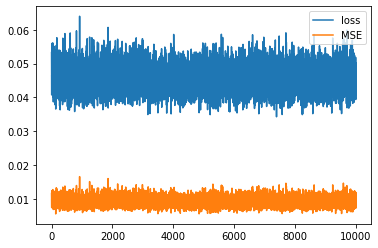

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


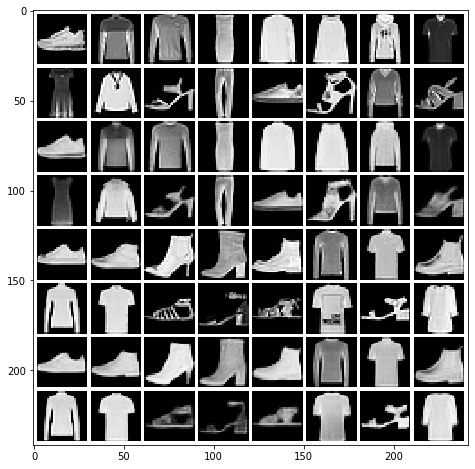

Mean squared dist: 0.01012763
epoch: 53 	 step:0 	 loss: 0.04346 	 reg loss: 0.001738
epoch: 53 	 step:100 	 loss: 0.04814 	 reg loss: 0.001789
epoch: 53 	 step:200 	 loss: 0.04771 	 reg loss: 0.001727
epoch: 53 	 step:300 	 loss: 0.04416 	 reg loss: 0.001773
epoch: 53 	 step:400 	 loss: 0.04601 	 reg loss: 0.001767
epoch: 53 	 step:500 	 loss: 0.04193 	 reg loss: 0.0017
epoch: 53 	 step:600 	 loss: 0.04419 	 reg loss: 0.001765
epoch: 53 	 step:700 	 loss: 0.04145 	 reg loss: 0.001737
epoch: 53 	 step:800 	 loss: 0.04548 	 reg loss: 0.001756
epoch: 53 	 step:900 	 loss: 0.04326 	 reg loss: 0.001756
epoch: 53 	 step:1000 	 loss: 0.044 	 reg loss: 0.00175
epoch: 53 	 step:1100 	 loss: 0.04593 	 reg loss: 0.001785
epoch: 53 	 step:1200 	 loss: 0.04407 	 reg loss: 0.001728
epoch: 53 	 step:1300 	 loss: 0.04437 	 reg loss: 0.001758
epoch: 53 	 step:1400 	 loss: 0.04076 	 reg loss: 0.001735
epoch: 53 	 step:1500 	 loss: 0.04271 	 reg loss: 0.001832
epoch: 53 	 step:1600 	 loss: 0.04983 	 reg

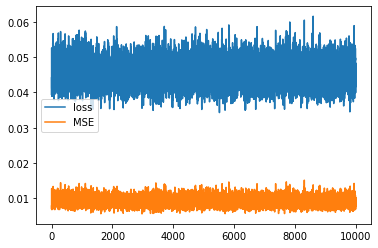

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


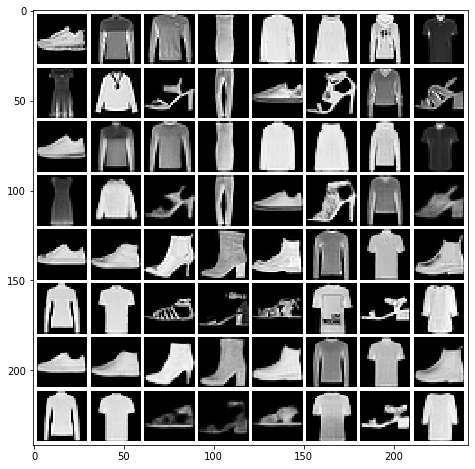

Mean squared dist: 0.010118415
epoch: 54 	 step:0 	 loss: 0.04403 	 reg loss: 0.001747
epoch: 54 	 step:100 	 loss: 0.03891 	 reg loss: 0.001704
epoch: 54 	 step:200 	 loss: 0.04463 	 reg loss: 0.001769
epoch: 54 	 step:300 	 loss: 0.04886 	 reg loss: 0.001794
epoch: 54 	 step:400 	 loss: 0.04356 	 reg loss: 0.001661
epoch: 54 	 step:500 	 loss: 0.04411 	 reg loss: 0.001778
epoch: 54 	 step:600 	 loss: 0.0465 	 reg loss: 0.001784
epoch: 54 	 step:700 	 loss: 0.04537 	 reg loss: 0.001737
epoch: 54 	 step:800 	 loss: 0.04091 	 reg loss: 0.00174
epoch: 54 	 step:900 	 loss: 0.04231 	 reg loss: 0.001754
epoch: 54 	 step:1000 	 loss: 0.04106 	 reg loss: 0.001697
epoch: 54 	 step:1100 	 loss: 0.03789 	 reg loss: 0.001749
epoch: 54 	 step:1200 	 loss: 0.04144 	 reg loss: 0.001736
epoch: 54 	 step:1300 	 loss: 0.04384 	 reg loss: 0.001785
epoch: 54 	 step:1400 	 loss: 0.0399 	 reg loss: 0.001746
epoch: 54 	 step:1500 	 loss: 0.04412 	 reg loss: 0.001734
epoch: 54 	 step:1600 	 loss: 0.04574 	 

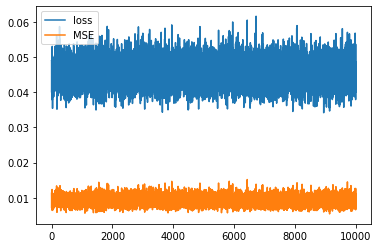

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


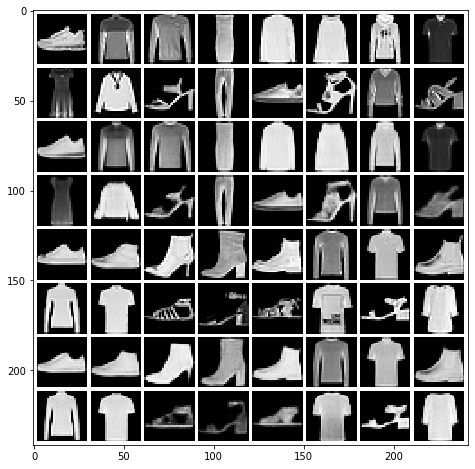

Mean squared dist: 0.010154148
epoch: 55 	 step:0 	 loss: 0.04854 	 reg loss: 0.00168
epoch: 55 	 step:100 	 loss: 0.04486 	 reg loss: 0.001754
epoch: 55 	 step:200 	 loss: 0.04969 	 reg loss: 0.001754
epoch: 55 	 step:300 	 loss: 0.04572 	 reg loss: 0.001716
epoch: 55 	 step:400 	 loss: 0.04389 	 reg loss: 0.001789
epoch: 55 	 step:500 	 loss: 0.04834 	 reg loss: 0.001834
epoch: 55 	 step:600 	 loss: 0.03829 	 reg loss: 0.001713
epoch: 55 	 step:700 	 loss: 0.04563 	 reg loss: 0.001802
epoch: 55 	 step:800 	 loss: 0.04067 	 reg loss: 0.001789
epoch: 55 	 step:900 	 loss: 0.04204 	 reg loss: 0.001738
epoch: 55 	 step:1000 	 loss: 0.04178 	 reg loss: 0.001779
epoch: 55 	 step:1100 	 loss: 0.04723 	 reg loss: 0.001708
epoch: 55 	 step:1200 	 loss: 0.05223 	 reg loss: 0.001808
epoch: 55 	 step:1300 	 loss: 0.04185 	 reg loss: 0.00175
epoch: 55 	 step:1400 	 loss: 0.04698 	 reg loss: 0.00175
epoch: 55 	 step:1500 	 loss: 0.04165 	 reg loss: 0.001799
epoch: 55 	 step:1600 	 loss: 0.03667 	 

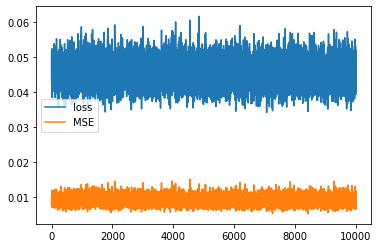

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


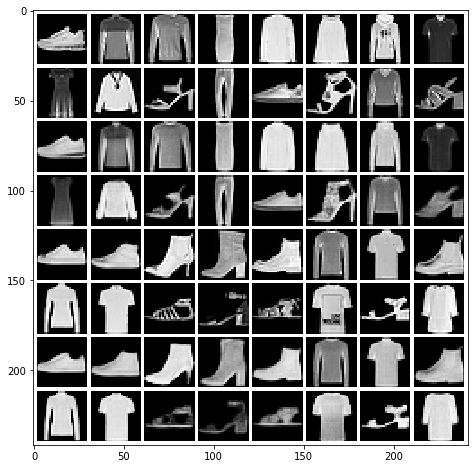

Mean squared dist: 0.009985282
epoch: 56 	 step:0 	 loss: 0.04606 	 reg loss: 0.001835
epoch: 56 	 step:100 	 loss: 0.04033 	 reg loss: 0.001735
epoch: 56 	 step:200 	 loss: 0.04131 	 reg loss: 0.001798
epoch: 56 	 step:300 	 loss: 0.0432 	 reg loss: 0.00173
epoch: 56 	 step:400 	 loss: 0.04646 	 reg loss: 0.001816
epoch: 56 	 step:500 	 loss: 0.04223 	 reg loss: 0.00179
epoch: 56 	 step:600 	 loss: 0.04316 	 reg loss: 0.001758
epoch: 56 	 step:700 	 loss: 0.04439 	 reg loss: 0.001746
epoch: 56 	 step:800 	 loss: 0.04519 	 reg loss: 0.001671
epoch: 56 	 step:900 	 loss: 0.04221 	 reg loss: 0.001763
epoch: 56 	 step:1000 	 loss: 0.0383 	 reg loss: 0.001767
epoch: 56 	 step:1100 	 loss: 0.04919 	 reg loss: 0.001733
epoch: 56 	 step:1200 	 loss: 0.04253 	 reg loss: 0.001677
epoch: 56 	 step:1300 	 loss: 0.04387 	 reg loss: 0.001822
epoch: 56 	 step:1400 	 loss: 0.04524 	 reg loss: 0.00176
epoch: 56 	 step:1500 	 loss: 0.04938 	 reg loss: 0.001791
epoch: 56 	 step:1600 	 loss: 0.04605 	 re

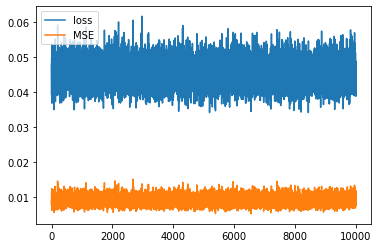

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


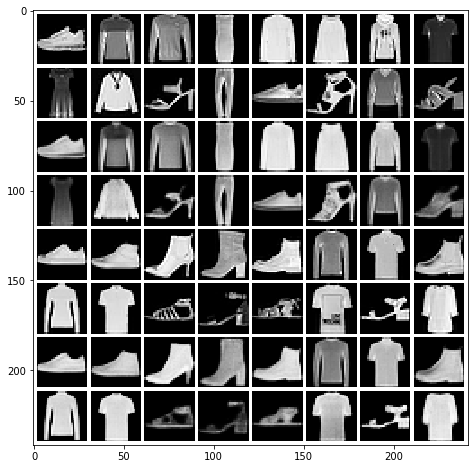

Mean squared dist: 0.010109822
epoch: 57 	 step:0 	 loss: 0.04929 	 reg loss: 0.001809
epoch: 57 	 step:100 	 loss: 0.04012 	 reg loss: 0.001742
epoch: 57 	 step:200 	 loss: 0.04174 	 reg loss: 0.001733
epoch: 57 	 step:300 	 loss: 0.04656 	 reg loss: 0.001718
epoch: 57 	 step:400 	 loss: 0.04702 	 reg loss: 0.001745
epoch: 57 	 step:500 	 loss: 0.04299 	 reg loss: 0.001726
epoch: 57 	 step:600 	 loss: 0.05164 	 reg loss: 0.001777
epoch: 57 	 step:700 	 loss: 0.04731 	 reg loss: 0.001753
epoch: 57 	 step:800 	 loss: 0.04869 	 reg loss: 0.001684
epoch: 57 	 step:900 	 loss: 0.04329 	 reg loss: 0.001718
epoch: 57 	 step:1000 	 loss: 0.0513 	 reg loss: 0.001853
epoch: 57 	 step:1100 	 loss: 0.04721 	 reg loss: 0.00176
epoch: 57 	 step:1200 	 loss: 0.0419 	 reg loss: 0.00178
epoch: 57 	 step:1300 	 loss: 0.04614 	 reg loss: 0.001739
epoch: 57 	 step:1400 	 loss: 0.0463 	 reg loss: 0.001767
epoch: 57 	 step:1500 	 loss: 0.04247 	 reg loss: 0.001713
epoch: 57 	 step:1600 	 loss: 0.04014 	 re

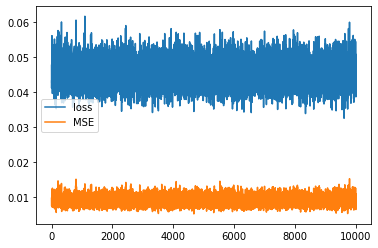

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


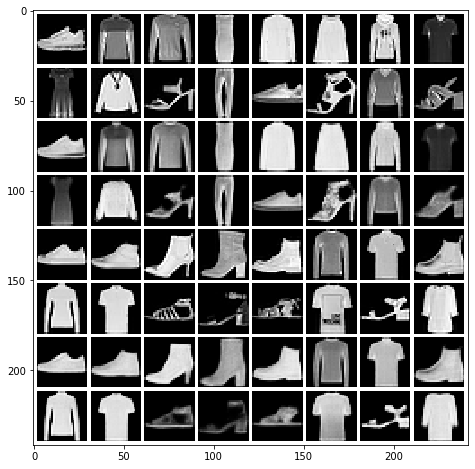

Mean squared dist: 0.010158292
epoch: 58 	 step:0 	 loss: 0.04348 	 reg loss: 0.001806
epoch: 58 	 step:100 	 loss: 0.04343 	 reg loss: 0.001774
epoch: 58 	 step:200 	 loss: 0.04482 	 reg loss: 0.001837
epoch: 58 	 step:300 	 loss: 0.04217 	 reg loss: 0.001697
epoch: 58 	 step:400 	 loss: 0.05262 	 reg loss: 0.001825
epoch: 58 	 step:500 	 loss: 0.04523 	 reg loss: 0.001756
epoch: 58 	 step:600 	 loss: 0.04462 	 reg loss: 0.001725
epoch: 58 	 step:700 	 loss: 0.04319 	 reg loss: 0.001724
epoch: 58 	 step:800 	 loss: 0.04752 	 reg loss: 0.001742
epoch: 58 	 step:900 	 loss: 0.04537 	 reg loss: 0.00179
epoch: 58 	 step:1000 	 loss: 0.04291 	 reg loss: 0.001786
epoch: 58 	 step:1100 	 loss: 0.04978 	 reg loss: 0.001779
epoch: 58 	 step:1200 	 loss: 0.0526 	 reg loss: 0.001854
epoch: 58 	 step:1300 	 loss: 0.04263 	 reg loss: 0.001797
epoch: 58 	 step:1400 	 loss: 0.04496 	 reg loss: 0.001749
epoch: 58 	 step:1500 	 loss: 0.04142 	 reg loss: 0.001806
epoch: 58 	 step:1600 	 loss: 0.04616 	

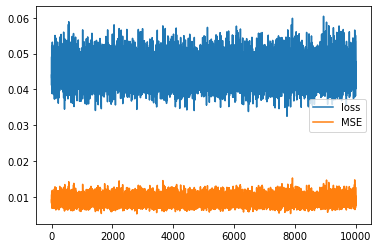

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


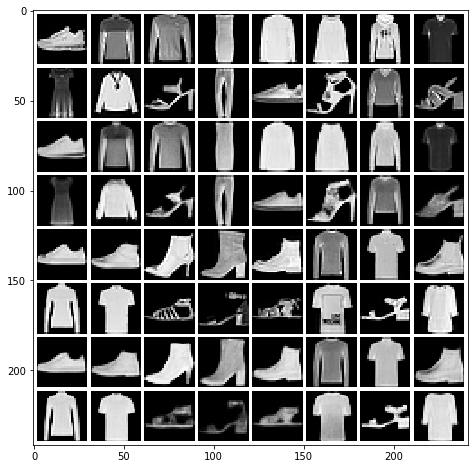

Mean squared dist: 0.01012652
epoch: 59 	 step:0 	 loss: 0.04131 	 reg loss: 0.001792
epoch: 59 	 step:100 	 loss: 0.03901 	 reg loss: 0.001699
epoch: 59 	 step:200 	 loss: 0.04518 	 reg loss: 0.001718
epoch: 59 	 step:300 	 loss: 0.04343 	 reg loss: 0.001785
epoch: 59 	 step:400 	 loss: 0.03834 	 reg loss: 0.001665
epoch: 59 	 step:500 	 loss: 0.04713 	 reg loss: 0.001727
epoch: 59 	 step:600 	 loss: 0.04646 	 reg loss: 0.001728
epoch: 59 	 step:700 	 loss: 0.04465 	 reg loss: 0.001709
epoch: 59 	 step:800 	 loss: 0.04208 	 reg loss: 0.001746
epoch: 59 	 step:900 	 loss: 0.04983 	 reg loss: 0.001765
epoch: 59 	 step:1000 	 loss: 0.03948 	 reg loss: 0.001663
epoch: 59 	 step:1100 	 loss: 0.04299 	 reg loss: 0.001817
epoch: 59 	 step:1200 	 loss: 0.0507 	 reg loss: 0.001839
epoch: 59 	 step:1300 	 loss: 0.04288 	 reg loss: 0.001725
epoch: 59 	 step:1400 	 loss: 0.04594 	 reg loss: 0.001767
epoch: 59 	 step:1500 	 loss: 0.04862 	 reg loss: 0.001816
epoch: 59 	 step:1600 	 loss: 0.0503 	 

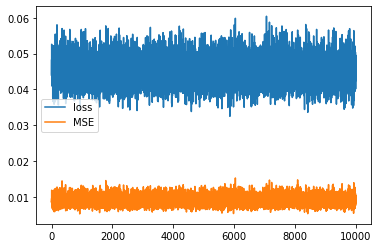

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


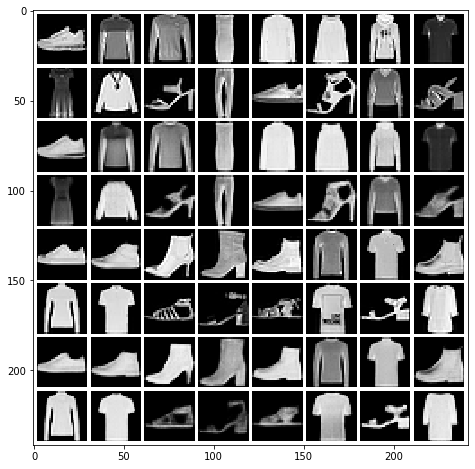

Mean squared dist: 0.0101155555
epoch: 60 	 step:0 	 loss: 0.05496 	 reg loss: 0.001781
epoch: 60 	 step:100 	 loss: 0.03852 	 reg loss: 0.001727
epoch: 60 	 step:200 	 loss: 0.04391 	 reg loss: 0.001747
epoch: 60 	 step:300 	 loss: 0.05064 	 reg loss: 0.001798
epoch: 60 	 step:400 	 loss: 0.04649 	 reg loss: 0.001809
epoch: 60 	 step:500 	 loss: 0.04192 	 reg loss: 0.001727
epoch: 60 	 step:600 	 loss: 0.04418 	 reg loss: 0.001766
epoch: 60 	 step:700 	 loss: 0.04448 	 reg loss: 0.001768
epoch: 60 	 step:800 	 loss: 0.04727 	 reg loss: 0.001731
epoch: 60 	 step:900 	 loss: 0.04708 	 reg loss: 0.001703
epoch: 60 	 step:1000 	 loss: 0.0447 	 reg loss: 0.001748
epoch: 60 	 step:1100 	 loss: 0.04864 	 reg loss: 0.001773
epoch: 60 	 step:1200 	 loss: 0.05113 	 reg loss: 0.001754
epoch: 60 	 step:1300 	 loss: 0.05023 	 reg loss: 0.001726
epoch: 60 	 step:1400 	 loss: 0.04191 	 reg loss: 0.001689
epoch: 60 	 step:1500 	 loss: 0.04694 	 reg loss: 0.001789
epoch: 60 	 step:1600 	 loss: 0.04561

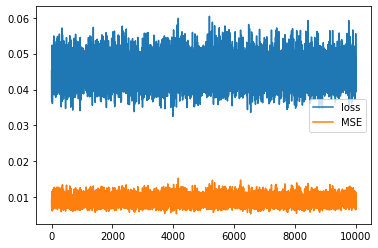

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


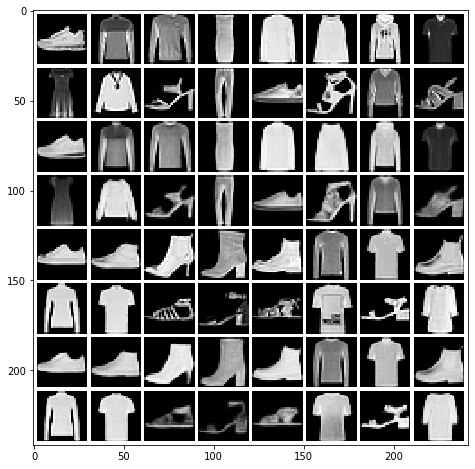

Mean squared dist: 0.009940532
epoch: 61 	 step:0 	 loss: 0.04008 	 reg loss: 0.001702
epoch: 61 	 step:100 	 loss: 0.04716 	 reg loss: 0.001783
epoch: 61 	 step:200 	 loss: 0.04477 	 reg loss: 0.001771
epoch: 61 	 step:300 	 loss: 0.04524 	 reg loss: 0.00174
epoch: 61 	 step:400 	 loss: 0.03996 	 reg loss: 0.001751
epoch: 61 	 step:500 	 loss: 0.05225 	 reg loss: 0.001777
epoch: 61 	 step:600 	 loss: 0.04116 	 reg loss: 0.001748
epoch: 61 	 step:700 	 loss: 0.04312 	 reg loss: 0.001828
epoch: 61 	 step:800 	 loss: 0.04826 	 reg loss: 0.001777
epoch: 61 	 step:900 	 loss: 0.04784 	 reg loss: 0.001668
epoch: 61 	 step:1000 	 loss: 0.04446 	 reg loss: 0.001758
epoch: 61 	 step:1100 	 loss: 0.04618 	 reg loss: 0.001802
epoch: 61 	 step:1200 	 loss: 0.04142 	 reg loss: 0.001741
epoch: 61 	 step:1300 	 loss: 0.04275 	 reg loss: 0.001755
epoch: 61 	 step:1400 	 loss: 0.04878 	 reg loss: 0.001736
epoch: 61 	 step:1500 	 loss: 0.04962 	 reg loss: 0.001825
epoch: 61 	 step:1600 	 loss: 0.03451 

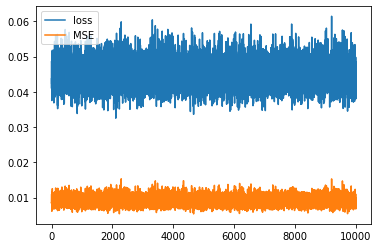

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


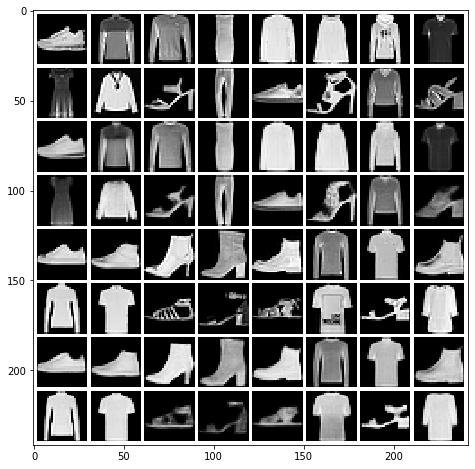

Mean squared dist: 0.010019577
epoch: 62 	 step:0 	 loss: 0.05014 	 reg loss: 0.001761
epoch: 62 	 step:100 	 loss: 0.04971 	 reg loss: 0.001787
epoch: 62 	 step:200 	 loss: 0.04157 	 reg loss: 0.001741
epoch: 62 	 step:300 	 loss: 0.04209 	 reg loss: 0.001752
epoch: 62 	 step:400 	 loss: 0.04237 	 reg loss: 0.001691
epoch: 62 	 step:500 	 loss: 0.04883 	 reg loss: 0.001847
epoch: 62 	 step:600 	 loss: 0.05167 	 reg loss: 0.001895
epoch: 62 	 step:700 	 loss: 0.04496 	 reg loss: 0.001771
epoch: 62 	 step:800 	 loss: 0.05006 	 reg loss: 0.00172
epoch: 62 	 step:900 	 loss: 0.04675 	 reg loss: 0.001699
epoch: 62 	 step:1000 	 loss: 0.04495 	 reg loss: 0.001732
epoch: 62 	 step:1100 	 loss: 0.04581 	 reg loss: 0.001749
epoch: 62 	 step:1200 	 loss: 0.04747 	 reg loss: 0.001784
epoch: 62 	 step:1300 	 loss: 0.03916 	 reg loss: 0.001805
epoch: 62 	 step:1400 	 loss: 0.04438 	 reg loss: 0.001725
epoch: 62 	 step:1500 	 loss: 0.04063 	 reg loss: 0.001715
epoch: 62 	 step:1600 	 loss: 0.04304 

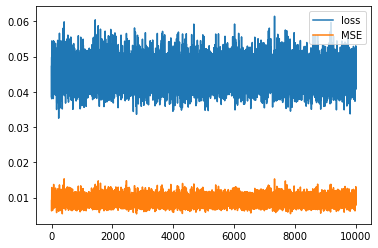

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


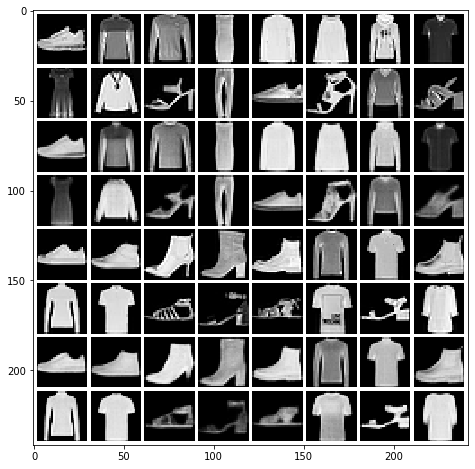

Mean squared dist: 0.009968654
epoch: 63 	 step:0 	 loss: 0.04452 	 reg loss: 0.001765
epoch: 63 	 step:100 	 loss: 0.04529 	 reg loss: 0.00174
epoch: 63 	 step:200 	 loss: 0.04445 	 reg loss: 0.001735
epoch: 63 	 step:300 	 loss: 0.04398 	 reg loss: 0.001746
epoch: 63 	 step:400 	 loss: 0.04218 	 reg loss: 0.001747
epoch: 63 	 step:500 	 loss: 0.03392 	 reg loss: 0.001708
epoch: 63 	 step:600 	 loss: 0.04711 	 reg loss: 0.001735
epoch: 63 	 step:700 	 loss: 0.05034 	 reg loss: 0.001701
epoch: 63 	 step:800 	 loss: 0.04606 	 reg loss: 0.001764
epoch: 63 	 step:900 	 loss: 0.04225 	 reg loss: 0.001779
epoch: 63 	 step:1000 	 loss: 0.03787 	 reg loss: 0.001732
epoch: 63 	 step:1100 	 loss: 0.04536 	 reg loss: 0.001717
epoch: 63 	 step:1200 	 loss: 0.046 	 reg loss: 0.001791
epoch: 63 	 step:1300 	 loss: 0.04411 	 reg loss: 0.001754
epoch: 63 	 step:1400 	 loss: 0.04466 	 reg loss: 0.001756
epoch: 63 	 step:1500 	 loss: 0.0465 	 reg loss: 0.001786
epoch: 63 	 step:1600 	 loss: 0.04716 	 r

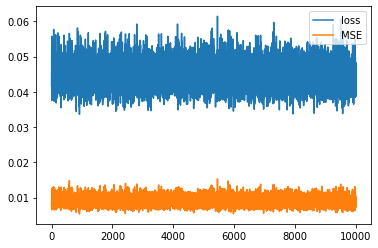

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


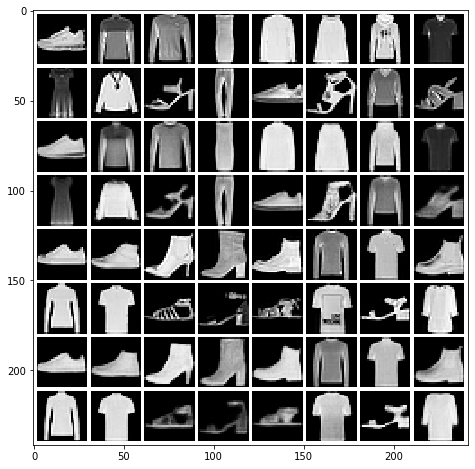

Mean squared dist: 0.009996766
epoch: 64 	 step:0 	 loss: 0.05437 	 reg loss: 0.001747
epoch: 64 	 step:100 	 loss: 0.04813 	 reg loss: 0.001757
epoch: 64 	 step:200 	 loss: 0.04088 	 reg loss: 0.001706
epoch: 64 	 step:300 	 loss: 0.04749 	 reg loss: 0.00173
epoch: 64 	 step:400 	 loss: 0.04105 	 reg loss: 0.00173
epoch: 64 	 step:500 	 loss: 0.04565 	 reg loss: 0.001727
epoch: 64 	 step:600 	 loss: 0.04479 	 reg loss: 0.001778
epoch: 64 	 step:700 	 loss: 0.04791 	 reg loss: 0.001775
epoch: 64 	 step:800 	 loss: 0.04278 	 reg loss: 0.001765
epoch: 64 	 step:900 	 loss: 0.04427 	 reg loss: 0.001769
epoch: 64 	 step:1000 	 loss: 0.04694 	 reg loss: 0.001773
epoch: 64 	 step:1100 	 loss: 0.04177 	 reg loss: 0.001687
epoch: 64 	 step:1200 	 loss: 0.04808 	 reg loss: 0.001716
epoch: 64 	 step:1300 	 loss: 0.05513 	 reg loss: 0.001818
epoch: 64 	 step:1400 	 loss: 0.0501 	 reg loss: 0.001766
epoch: 64 	 step:1500 	 loss: 0.04661 	 reg loss: 0.001662
epoch: 64 	 step:1600 	 loss: 0.04525 	 

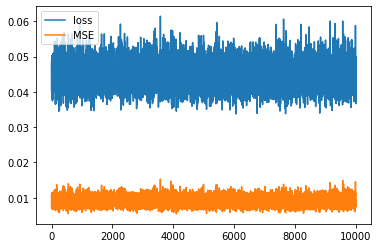

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


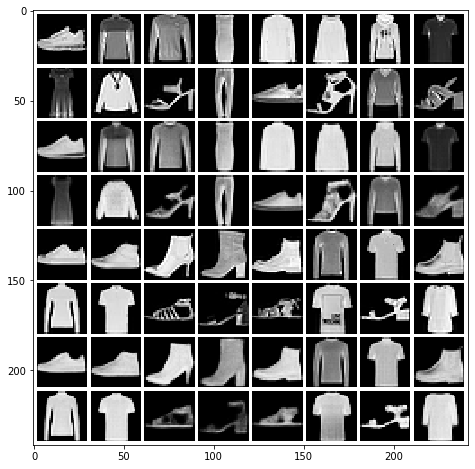

Mean squared dist: 0.010024547
epoch: 65 	 step:0 	 loss: 0.0438 	 reg loss: 0.001755
epoch: 65 	 step:100 	 loss: 0.04489 	 reg loss: 0.001673
epoch: 65 	 step:200 	 loss: 0.04219 	 reg loss: 0.001735
epoch: 65 	 step:300 	 loss: 0.04659 	 reg loss: 0.001743
epoch: 65 	 step:400 	 loss: 0.03941 	 reg loss: 0.001751
epoch: 65 	 step:500 	 loss: 0.04538 	 reg loss: 0.001779
epoch: 65 	 step:600 	 loss: 0.05048 	 reg loss: 0.001759
epoch: 65 	 step:700 	 loss: 0.04614 	 reg loss: 0.001682
epoch: 65 	 step:800 	 loss: 0.0437 	 reg loss: 0.001785
epoch: 65 	 step:900 	 loss: 0.04473 	 reg loss: 0.001721
epoch: 65 	 step:1000 	 loss: 0.04605 	 reg loss: 0.001786
epoch: 65 	 step:1100 	 loss: 0.04231 	 reg loss: 0.001746
epoch: 65 	 step:1200 	 loss: 0.04812 	 reg loss: 0.001785
epoch: 65 	 step:1300 	 loss: 0.03654 	 reg loss: 0.001668
epoch: 65 	 step:1400 	 loss: 0.04469 	 reg loss: 0.001724
epoch: 65 	 step:1500 	 loss: 0.04093 	 reg loss: 0.001749
epoch: 65 	 step:1600 	 loss: 0.04751 	

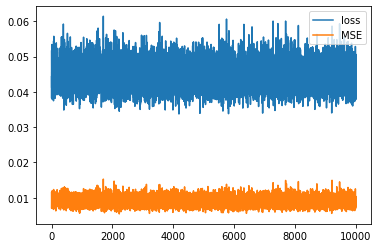

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


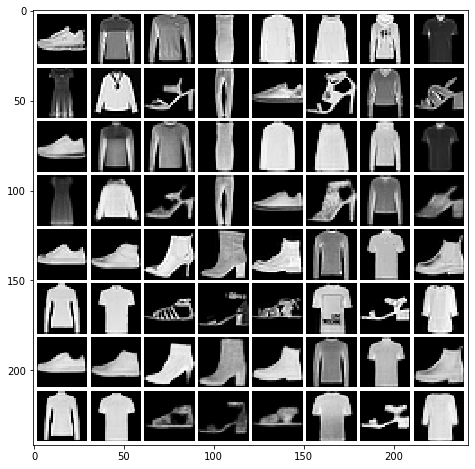

Mean squared dist: 0.009989696
epoch: 66 	 step:0 	 loss: 0.04457 	 reg loss: 0.001744
epoch: 66 	 step:100 	 loss: 0.04175 	 reg loss: 0.001668
epoch: 66 	 step:200 	 loss: 0.04402 	 reg loss: 0.001817
epoch: 66 	 step:300 	 loss: 0.04097 	 reg loss: 0.001693
epoch: 66 	 step:400 	 loss: 0.0431 	 reg loss: 0.001801
epoch: 66 	 step:500 	 loss: 0.05299 	 reg loss: 0.001834
epoch: 66 	 step:600 	 loss: 0.04335 	 reg loss: 0.001723
epoch: 66 	 step:700 	 loss: 0.04963 	 reg loss: 0.001749
epoch: 66 	 step:800 	 loss: 0.0457 	 reg loss: 0.001826
epoch: 66 	 step:900 	 loss: 0.04732 	 reg loss: 0.001791
epoch: 66 	 step:1000 	 loss: 0.04606 	 reg loss: 0.00171
epoch: 66 	 step:1100 	 loss: 0.04493 	 reg loss: 0.001785
epoch: 66 	 step:1200 	 loss: 0.04946 	 reg loss: 0.001749
epoch: 66 	 step:1300 	 loss: 0.04026 	 reg loss: 0.001702
epoch: 66 	 step:1400 	 loss: 0.04454 	 reg loss: 0.00177
epoch: 66 	 step:1500 	 loss: 0.0479 	 reg loss: 0.001828
epoch: 66 	 step:1600 	 loss: 0.04374 	 re

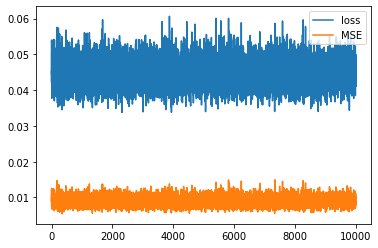

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


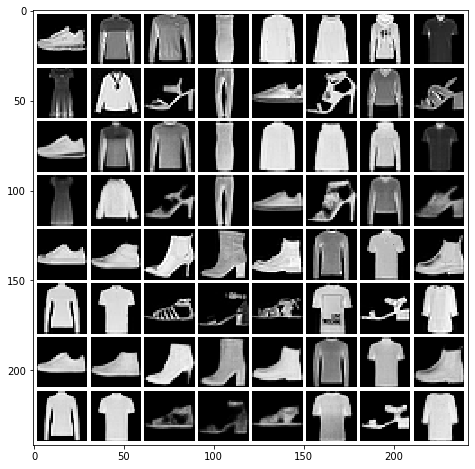

Mean squared dist: 0.010018837
epoch: 67 	 step:0 	 loss: 0.04678 	 reg loss: 0.001786
epoch: 67 	 step:100 	 loss: 0.03995 	 reg loss: 0.001786
epoch: 67 	 step:200 	 loss: 0.04022 	 reg loss: 0.001706
epoch: 67 	 step:300 	 loss: 0.04372 	 reg loss: 0.001742
epoch: 67 	 step:400 	 loss: 0.04313 	 reg loss: 0.001718
epoch: 67 	 step:500 	 loss: 0.04172 	 reg loss: 0.001738
epoch: 67 	 step:600 	 loss: 0.03697 	 reg loss: 0.001737
epoch: 67 	 step:700 	 loss: 0.04269 	 reg loss: 0.001719
epoch: 67 	 step:800 	 loss: 0.04764 	 reg loss: 0.001764
epoch: 67 	 step:900 	 loss: 0.04176 	 reg loss: 0.001745
epoch: 67 	 step:1000 	 loss: 0.04408 	 reg loss: 0.001818
epoch: 67 	 step:1100 	 loss: 0.04784 	 reg loss: 0.001736
epoch: 67 	 step:1200 	 loss: 0.0431 	 reg loss: 0.001764
epoch: 67 	 step:1300 	 loss: 0.04367 	 reg loss: 0.001786
epoch: 67 	 step:1400 	 loss: 0.04168 	 reg loss: 0.001684
epoch: 67 	 step:1500 	 loss: 0.04247 	 reg loss: 0.001665
epoch: 67 	 step:1600 	 loss: 0.04709 

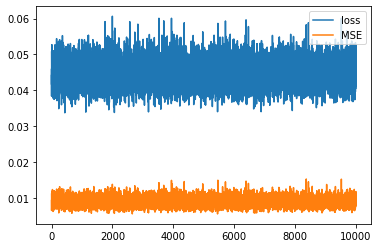

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


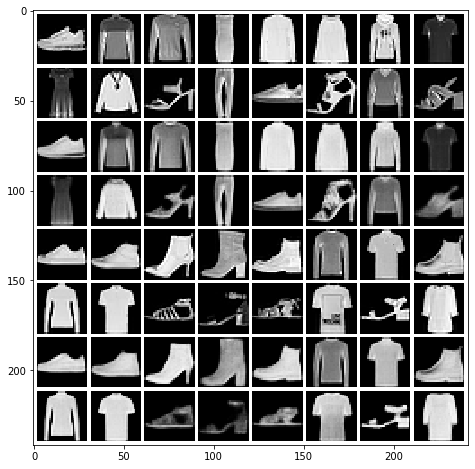

Mean squared dist: 0.009941512
epoch: 68 	 step:0 	 loss: 0.04121 	 reg loss: 0.001788
epoch: 68 	 step:100 	 loss: 0.04375 	 reg loss: 0.001788
epoch: 68 	 step:200 	 loss: 0.04635 	 reg loss: 0.001721
epoch: 68 	 step:300 	 loss: 0.04126 	 reg loss: 0.001752
epoch: 68 	 step:400 	 loss: 0.04928 	 reg loss: 0.001802
epoch: 68 	 step:500 	 loss: 0.04139 	 reg loss: 0.001709
epoch: 68 	 step:600 	 loss: 0.04636 	 reg loss: 0.001723
epoch: 68 	 step:700 	 loss: 0.04401 	 reg loss: 0.001757
epoch: 68 	 step:800 	 loss: 0.04954 	 reg loss: 0.00174
epoch: 68 	 step:900 	 loss: 0.0431 	 reg loss: 0.001672
epoch: 68 	 step:1000 	 loss: 0.04924 	 reg loss: 0.001787
epoch: 68 	 step:1100 	 loss: 0.04371 	 reg loss: 0.001706
epoch: 68 	 step:1200 	 loss: 0.04375 	 reg loss: 0.001807
epoch: 68 	 step:1300 	 loss: 0.04267 	 reg loss: 0.001743
epoch: 68 	 step:1400 	 loss: 0.04452 	 reg loss: 0.001787
epoch: 68 	 step:1500 	 loss: 0.04171 	 reg loss: 0.001743
epoch: 68 	 step:1600 	 loss: 0.04381 	

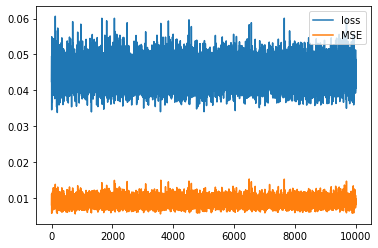

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


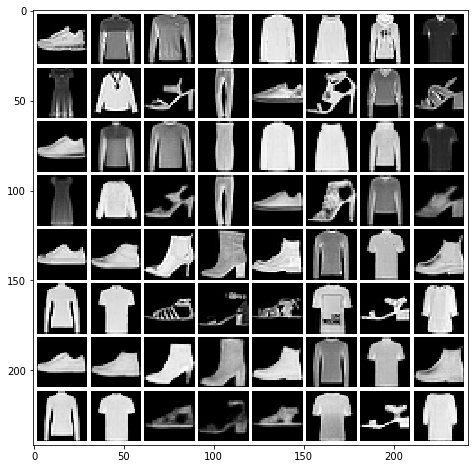

Mean squared dist: 0.010008787
epoch: 69 	 step:0 	 loss: 0.04264 	 reg loss: 0.001785
epoch: 69 	 step:100 	 loss: 0.04856 	 reg loss: 0.001766
epoch: 69 	 step:200 	 loss: 0.04207 	 reg loss: 0.001814
epoch: 69 	 step:300 	 loss: 0.05135 	 reg loss: 0.001797
epoch: 69 	 step:400 	 loss: 0.04732 	 reg loss: 0.001731
epoch: 69 	 step:500 	 loss: 0.04254 	 reg loss: 0.001755
epoch: 69 	 step:600 	 loss: 0.05193 	 reg loss: 0.001821
epoch: 69 	 step:700 	 loss: 0.0404 	 reg loss: 0.001692
epoch: 69 	 step:800 	 loss: 0.04601 	 reg loss: 0.001786
epoch: 69 	 step:900 	 loss: 0.03668 	 reg loss: 0.001651
epoch: 69 	 step:1000 	 loss: 0.04502 	 reg loss: 0.001727
epoch: 69 	 step:1100 	 loss: 0.04337 	 reg loss: 0.001735
epoch: 69 	 step:1200 	 loss: 0.05037 	 reg loss: 0.001743
epoch: 69 	 step:1300 	 loss: 0.0417 	 reg loss: 0.001665
epoch: 69 	 step:1400 	 loss: 0.04101 	 reg loss: 0.001768
epoch: 69 	 step:1500 	 loss: 0.04547 	 reg loss: 0.00182
epoch: 69 	 step:1600 	 loss: 0.04473 	 

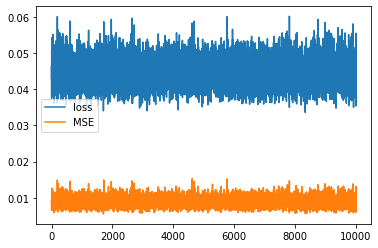

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


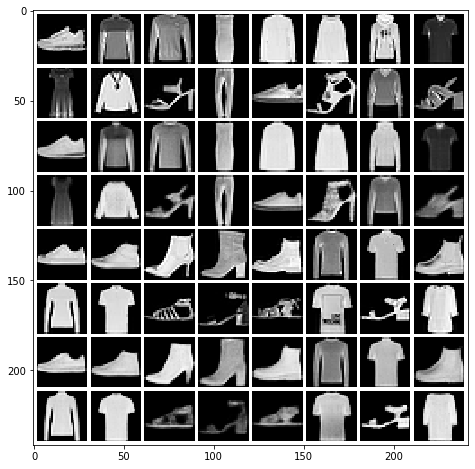

Mean squared dist: 0.010041892
epoch: 70 	 step:0 	 loss: 0.04115 	 reg loss: 0.001724
epoch: 70 	 step:100 	 loss: 0.04416 	 reg loss: 0.001731
epoch: 70 	 step:200 	 loss: 0.04458 	 reg loss: 0.001758
epoch: 70 	 step:300 	 loss: 0.04698 	 reg loss: 0.001729
epoch: 70 	 step:400 	 loss: 0.03994 	 reg loss: 0.001711
epoch: 70 	 step:500 	 loss: 0.04814 	 reg loss: 0.001761
epoch: 70 	 step:600 	 loss: 0.0462 	 reg loss: 0.001823
epoch: 70 	 step:700 	 loss: 0.04245 	 reg loss: 0.001681
epoch: 70 	 step:800 	 loss: 0.04322 	 reg loss: 0.001702
epoch: 70 	 step:900 	 loss: 0.05236 	 reg loss: 0.001802
epoch: 70 	 step:1000 	 loss: 0.04398 	 reg loss: 0.001823
epoch: 70 	 step:1100 	 loss: 0.04684 	 reg loss: 0.001759
epoch: 70 	 step:1200 	 loss: 0.03983 	 reg loss: 0.00177
epoch: 70 	 step:1300 	 loss: 0.03924 	 reg loss: 0.001764
epoch: 70 	 step:1400 	 loss: 0.04486 	 reg loss: 0.001679
epoch: 70 	 step:1500 	 loss: 0.04251 	 reg loss: 0.001736
epoch: 70 	 step:1600 	 loss: 0.04208 	

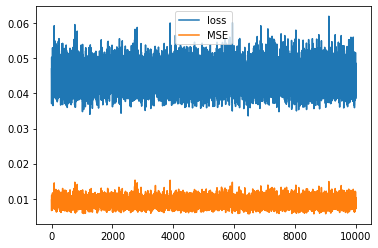

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


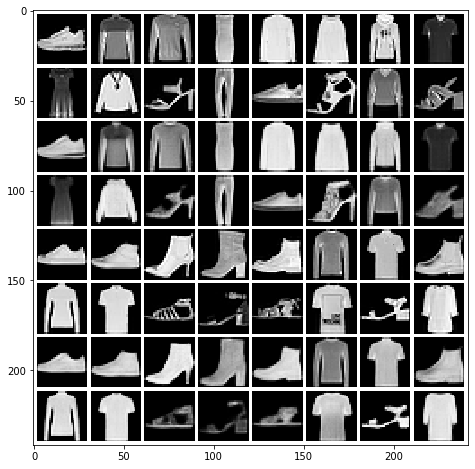

Mean squared dist: 0.010017264
epoch: 71 	 step:0 	 loss: 0.04408 	 reg loss: 0.001837
epoch: 71 	 step:100 	 loss: 0.04226 	 reg loss: 0.001771
epoch: 71 	 step:200 	 loss: 0.0441 	 reg loss: 0.001781
epoch: 71 	 step:300 	 loss: 0.03964 	 reg loss: 0.001737
epoch: 71 	 step:400 	 loss: 0.04407 	 reg loss: 0.001771
epoch: 71 	 step:500 	 loss: 0.03874 	 reg loss: 0.001654
epoch: 71 	 step:600 	 loss: 0.04252 	 reg loss: 0.001722
epoch: 71 	 step:700 	 loss: 0.0396 	 reg loss: 0.001712
epoch: 71 	 step:800 	 loss: 0.04358 	 reg loss: 0.001816
epoch: 71 	 step:900 	 loss: 0.04826 	 reg loss: 0.001745
epoch: 71 	 step:1000 	 loss: 0.04272 	 reg loss: 0.001728
epoch: 71 	 step:1100 	 loss: 0.04162 	 reg loss: 0.001695
epoch: 71 	 step:1200 	 loss: 0.04176 	 reg loss: 0.001777
epoch: 71 	 step:1300 	 loss: 0.04073 	 reg loss: 0.001692
epoch: 71 	 step:1400 	 loss: 0.04823 	 reg loss: 0.001802
epoch: 71 	 step:1500 	 loss: 0.04388 	 reg loss: 0.001745
epoch: 71 	 step:1600 	 loss: 0.04411 	

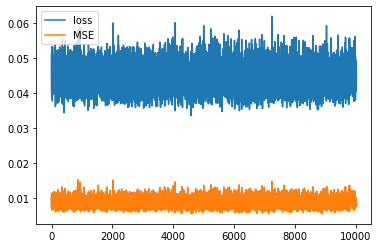

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


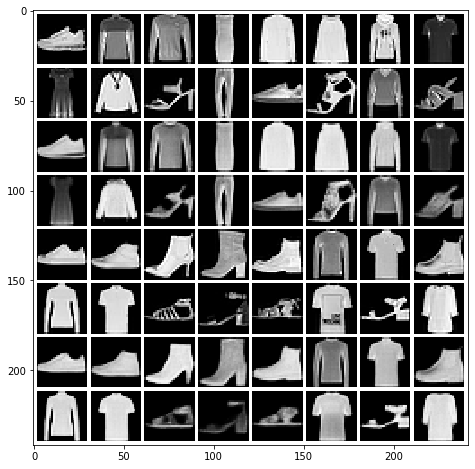

Mean squared dist: 0.0099328635
epoch: 72 	 step:0 	 loss: 0.03655 	 reg loss: 0.001741
epoch: 72 	 step:100 	 loss: 0.04391 	 reg loss: 0.001801
epoch: 72 	 step:200 	 loss: 0.0435 	 reg loss: 0.001739
epoch: 72 	 step:300 	 loss: 0.04412 	 reg loss: 0.001746
epoch: 72 	 step:400 	 loss: 0.04775 	 reg loss: 0.001786
epoch: 72 	 step:500 	 loss: 0.05082 	 reg loss: 0.001812
epoch: 72 	 step:600 	 loss: 0.04613 	 reg loss: 0.001694
epoch: 72 	 step:700 	 loss: 0.03962 	 reg loss: 0.001809
epoch: 72 	 step:800 	 loss: 0.04685 	 reg loss: 0.001794
epoch: 72 	 step:900 	 loss: 0.04452 	 reg loss: 0.001748
epoch: 72 	 step:1000 	 loss: 0.05096 	 reg loss: 0.00181
epoch: 72 	 step:1100 	 loss: 0.03542 	 reg loss: 0.001653
epoch: 72 	 step:1200 	 loss: 0.04504 	 reg loss: 0.001757
epoch: 72 	 step:1300 	 loss: 0.04666 	 reg loss: 0.001784
epoch: 72 	 step:1400 	 loss: 0.04631 	 reg loss: 0.00177
epoch: 72 	 step:1500 	 loss: 0.04092 	 reg loss: 0.001762
epoch: 72 	 step:1600 	 loss: 0.04387 	

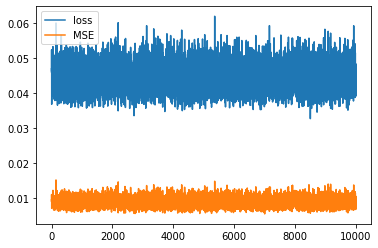

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


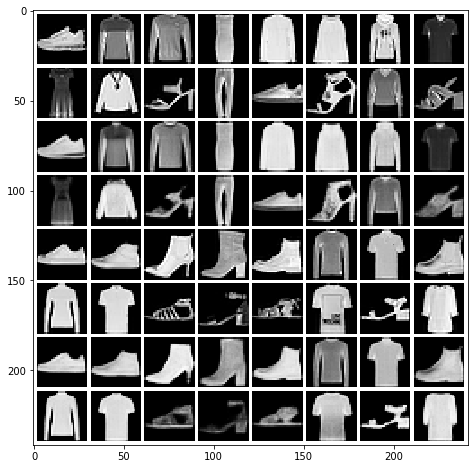

Mean squared dist: 0.009893958
epoch: 73 	 step:0 	 loss: 0.04175 	 reg loss: 0.00173
epoch: 73 	 step:100 	 loss: 0.04612 	 reg loss: 0.001725
epoch: 73 	 step:200 	 loss: 0.05138 	 reg loss: 0.001793
epoch: 73 	 step:300 	 loss: 0.04539 	 reg loss: 0.001822
epoch: 73 	 step:400 	 loss: 0.04128 	 reg loss: 0.001699
epoch: 73 	 step:500 	 loss: 0.04635 	 reg loss: 0.001796
epoch: 73 	 step:600 	 loss: 0.04355 	 reg loss: 0.001717
epoch: 73 	 step:700 	 loss: 0.04045 	 reg loss: 0.001689
epoch: 73 	 step:800 	 loss: 0.04005 	 reg loss: 0.001725
epoch: 73 	 step:900 	 loss: 0.04075 	 reg loss: 0.001751
epoch: 73 	 step:1000 	 loss: 0.04348 	 reg loss: 0.001766
epoch: 73 	 step:1100 	 loss: 0.04144 	 reg loss: 0.00176
epoch: 73 	 step:1200 	 loss: 0.0425 	 reg loss: 0.001751
epoch: 73 	 step:1300 	 loss: 0.04439 	 reg loss: 0.00169
epoch: 73 	 step:1400 	 loss: 0.04906 	 reg loss: 0.001826
epoch: 73 	 step:1500 	 loss: 0.03994 	 reg loss: 0.00175
epoch: 73 	 step:1600 	 loss: 0.05225 	 re

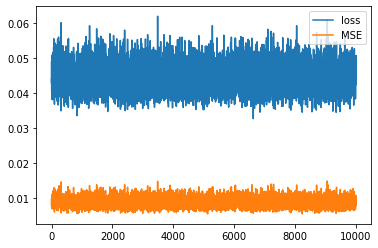

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


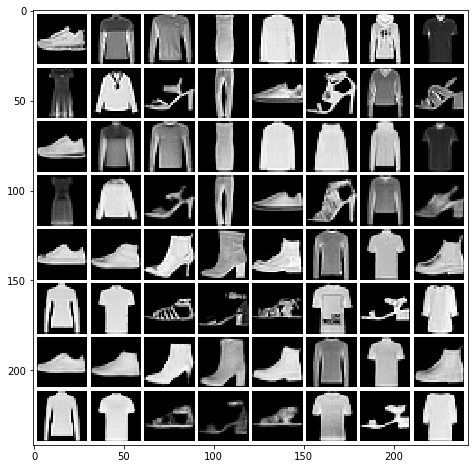

Mean squared dist: 0.010145783
epoch: 74 	 step:0 	 loss: 0.04472 	 reg loss: 0.001776
epoch: 74 	 step:100 	 loss: 0.0416 	 reg loss: 0.001822
epoch: 74 	 step:200 	 loss: 0.04147 	 reg loss: 0.001755
epoch: 74 	 step:300 	 loss: 0.04196 	 reg loss: 0.001745
epoch: 74 	 step:400 	 loss: 0.04475 	 reg loss: 0.001774
epoch: 74 	 step:500 	 loss: 0.04545 	 reg loss: 0.001756
epoch: 74 	 step:600 	 loss: 0.0477 	 reg loss: 0.001858
epoch: 74 	 step:700 	 loss: 0.04032 	 reg loss: 0.001717
epoch: 74 	 step:800 	 loss: 0.04518 	 reg loss: 0.001767
epoch: 74 	 step:900 	 loss: 0.03778 	 reg loss: 0.001757
epoch: 74 	 step:1000 	 loss: 0.04593 	 reg loss: 0.001766
epoch: 74 	 step:1100 	 loss: 0.04292 	 reg loss: 0.001772
epoch: 74 	 step:1200 	 loss: 0.04206 	 reg loss: 0.001781
epoch: 74 	 step:1300 	 loss: 0.04281 	 reg loss: 0.001706
epoch: 74 	 step:1400 	 loss: 0.04193 	 reg loss: 0.001765
epoch: 74 	 step:1500 	 loss: 0.04272 	 reg loss: 0.001778
epoch: 74 	 step:1600 	 loss: 0.05028 	

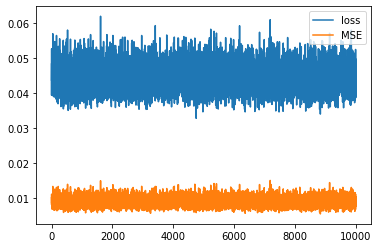

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


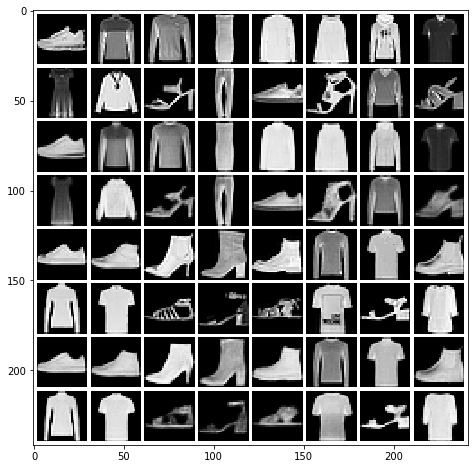

Mean squared dist: 0.009930882
epoch: 75 	 step:0 	 loss: 0.04519 	 reg loss: 0.001712
epoch: 75 	 step:100 	 loss: 0.04158 	 reg loss: 0.001727
epoch: 75 	 step:200 	 loss: 0.04056 	 reg loss: 0.001846
epoch: 75 	 step:300 	 loss: 0.04297 	 reg loss: 0.001746
epoch: 75 	 step:400 	 loss: 0.04381 	 reg loss: 0.001799
epoch: 75 	 step:500 	 loss: 0.05117 	 reg loss: 0.001808
epoch: 75 	 step:600 	 loss: 0.05473 	 reg loss: 0.00182
epoch: 75 	 step:700 	 loss: 0.04222 	 reg loss: 0.001774
epoch: 75 	 step:800 	 loss: 0.03838 	 reg loss: 0.001748
epoch: 75 	 step:900 	 loss: 0.04997 	 reg loss: 0.001752
epoch: 75 	 step:1000 	 loss: 0.04643 	 reg loss: 0.001812
epoch: 75 	 step:1100 	 loss: 0.04679 	 reg loss: 0.001732
epoch: 75 	 step:1200 	 loss: 0.04491 	 reg loss: 0.001724
epoch: 75 	 step:1300 	 loss: 0.04705 	 reg loss: 0.001741
epoch: 75 	 step:1400 	 loss: 0.04676 	 reg loss: 0.001707
epoch: 75 	 step:1500 	 loss: 0.04219 	 reg loss: 0.001753
epoch: 75 	 step:1600 	 loss: 0.04522 

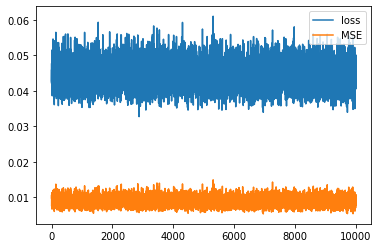

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


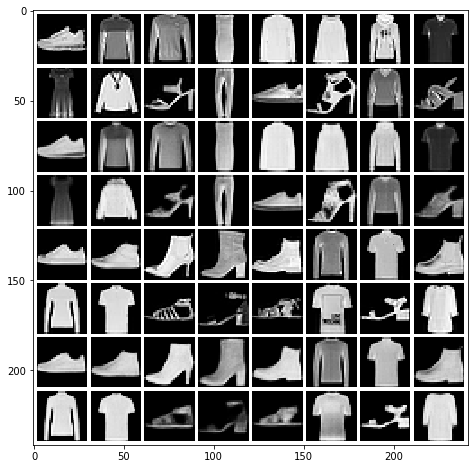

Mean squared dist: 0.010012941
epoch: 76 	 step:0 	 loss: 0.04174 	 reg loss: 0.001743
epoch: 76 	 step:100 	 loss: 0.04031 	 reg loss: 0.001756
epoch: 76 	 step:200 	 loss: 0.03949 	 reg loss: 0.001709
epoch: 76 	 step:300 	 loss: 0.04442 	 reg loss: 0.001735
epoch: 76 	 step:400 	 loss: 0.04505 	 reg loss: 0.001815
epoch: 76 	 step:500 	 loss: 0.0521 	 reg loss: 0.001767
epoch: 76 	 step:600 	 loss: 0.04043 	 reg loss: 0.00174
epoch: 76 	 step:700 	 loss: 0.04516 	 reg loss: 0.001763
epoch: 76 	 step:800 	 loss: 0.04541 	 reg loss: 0.001739
epoch: 76 	 step:900 	 loss: 0.0383 	 reg loss: 0.00178
epoch: 76 	 step:1000 	 loss: 0.03856 	 reg loss: 0.001712
epoch: 76 	 step:1100 	 loss: 0.04087 	 reg loss: 0.001699
epoch: 76 	 step:1200 	 loss: 0.03929 	 reg loss: 0.001751
epoch: 76 	 step:1300 	 loss: 0.0414 	 reg loss: 0.001743
epoch: 76 	 step:1400 	 loss: 0.04285 	 reg loss: 0.001785
epoch: 76 	 step:1500 	 loss: 0.04597 	 reg loss: 0.001748
epoch: 76 	 step:1600 	 loss: 0.04593 	 re

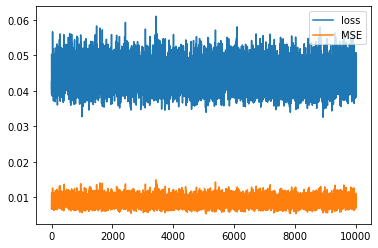

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


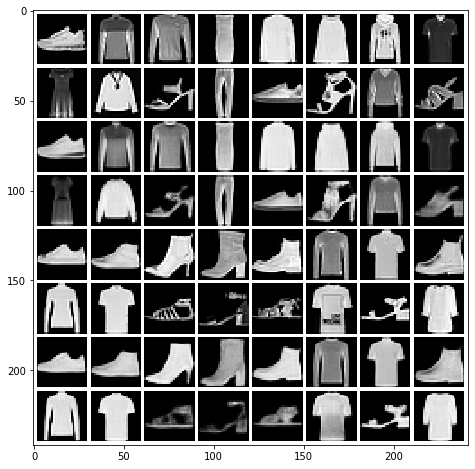

Mean squared dist: 0.010101035
epoch: 77 	 step:0 	 loss: 0.0456 	 reg loss: 0.001698
epoch: 77 	 step:100 	 loss: 0.03668 	 reg loss: 0.001618
epoch: 77 	 step:200 	 loss: 0.0433 	 reg loss: 0.001792
epoch: 77 	 step:300 	 loss: 0.03654 	 reg loss: 0.001692
epoch: 77 	 step:400 	 loss: 0.04314 	 reg loss: 0.001796
epoch: 77 	 step:500 	 loss: 0.04307 	 reg loss: 0.001777
epoch: 77 	 step:600 	 loss: 0.04284 	 reg loss: 0.001694
epoch: 77 	 step:700 	 loss: 0.04451 	 reg loss: 0.001709
epoch: 77 	 step:800 	 loss: 0.04019 	 reg loss: 0.001775
epoch: 77 	 step:900 	 loss: 0.04014 	 reg loss: 0.001791
epoch: 77 	 step:1000 	 loss: 0.04149 	 reg loss: 0.001853
epoch: 77 	 step:1100 	 loss: 0.04513 	 reg loss: 0.001838
epoch: 77 	 step:1200 	 loss: 0.0458 	 reg loss: 0.001767
epoch: 77 	 step:1300 	 loss: 0.04544 	 reg loss: 0.001772
epoch: 77 	 step:1400 	 loss: 0.04637 	 reg loss: 0.001782
epoch: 77 	 step:1500 	 loss: 0.04245 	 reg loss: 0.001721
epoch: 77 	 step:1600 	 loss: 0.04499 	 

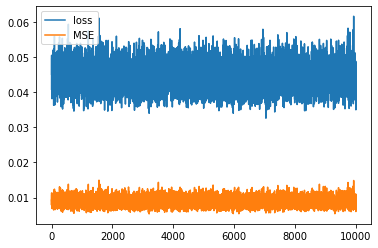

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


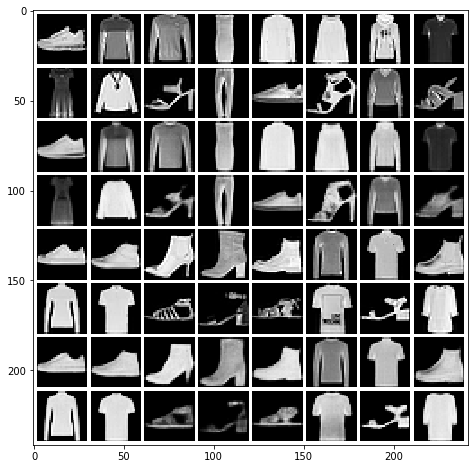

Mean squared dist: 0.009932298
epoch: 78 	 step:0 	 loss: 0.04638 	 reg loss: 0.001732
epoch: 78 	 step:100 	 loss: 0.03879 	 reg loss: 0.001795
epoch: 78 	 step:200 	 loss: 0.04154 	 reg loss: 0.001804
epoch: 78 	 step:300 	 loss: 0.0448 	 reg loss: 0.001748
epoch: 78 	 step:400 	 loss: 0.03683 	 reg loss: 0.0017
epoch: 78 	 step:500 	 loss: 0.039 	 reg loss: 0.001711
epoch: 78 	 step:600 	 loss: 0.03861 	 reg loss: 0.00173
epoch: 78 	 step:700 	 loss: 0.05113 	 reg loss: 0.001862
epoch: 78 	 step:800 	 loss: 0.04286 	 reg loss: 0.001729
epoch: 78 	 step:900 	 loss: 0.04297 	 reg loss: 0.001785
epoch: 78 	 step:1000 	 loss: 0.03452 	 reg loss: 0.001765
epoch: 78 	 step:1100 	 loss: 0.04771 	 reg loss: 0.001794
epoch: 78 	 step:1200 	 loss: 0.04201 	 reg loss: 0.001732
epoch: 78 	 step:1300 	 loss: 0.04021 	 reg loss: 0.001711
epoch: 78 	 step:1400 	 loss: 0.04824 	 reg loss: 0.001745
epoch: 78 	 step:1500 	 loss: 0.04435 	 reg loss: 0.001787
epoch: 78 	 step:1600 	 loss: 0.04394 	 reg

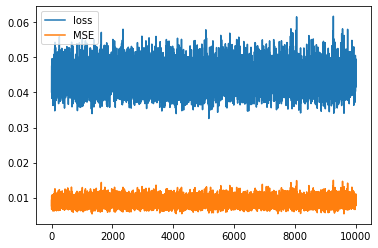

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


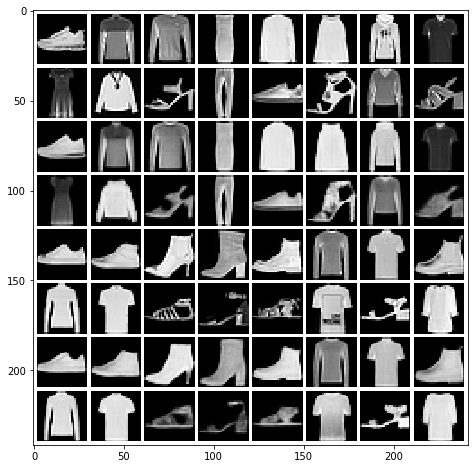

Mean squared dist: 0.009968047
epoch: 79 	 step:0 	 loss: 0.04047 	 reg loss: 0.001718
epoch: 79 	 step:100 	 loss: 0.0381 	 reg loss: 0.001782
epoch: 79 	 step:200 	 loss: 0.04743 	 reg loss: 0.001752
epoch: 79 	 step:300 	 loss: 0.04283 	 reg loss: 0.001721
epoch: 79 	 step:400 	 loss: 0.0424 	 reg loss: 0.001761
epoch: 79 	 step:500 	 loss: 0.04277 	 reg loss: 0.001837
epoch: 79 	 step:600 	 loss: 0.0463 	 reg loss: 0.001822
epoch: 79 	 step:700 	 loss: 0.03948 	 reg loss: 0.001765
epoch: 79 	 step:800 	 loss: 0.03941 	 reg loss: 0.001763
epoch: 79 	 step:900 	 loss: 0.04723 	 reg loss: 0.001715
epoch: 79 	 step:1000 	 loss: 0.03829 	 reg loss: 0.001707
epoch: 79 	 step:1100 	 loss: 0.03965 	 reg loss: 0.001771
epoch: 79 	 step:1200 	 loss: 0.03779 	 reg loss: 0.00177
epoch: 79 	 step:1300 	 loss: 0.04451 	 reg loss: 0.001738
epoch: 79 	 step:1400 	 loss: 0.04403 	 reg loss: 0.001757
epoch: 79 	 step:1500 	 loss: 0.03948 	 reg loss: 0.001714
epoch: 79 	 step:1600 	 loss: 0.04327 	 r

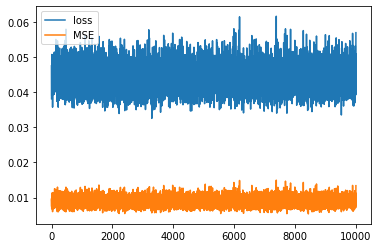

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


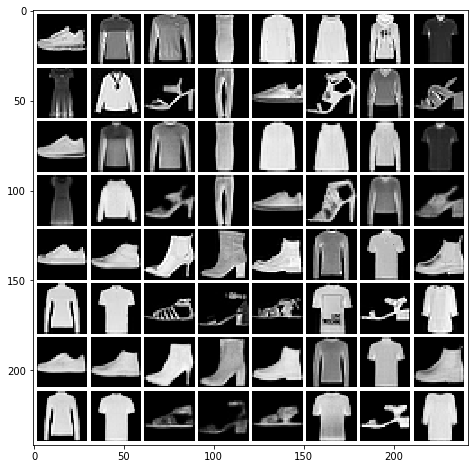

Mean squared dist: 0.009873362
epoch: 80 	 step:0 	 loss: 0.04626 	 reg loss: 0.001826
epoch: 80 	 step:100 	 loss: 0.03933 	 reg loss: 0.001694
epoch: 80 	 step:200 	 loss: 0.04162 	 reg loss: 0.001721
epoch: 80 	 step:300 	 loss: 0.04525 	 reg loss: 0.001761
epoch: 80 	 step:400 	 loss: 0.04361 	 reg loss: 0.001838
epoch: 80 	 step:500 	 loss: 0.04342 	 reg loss: 0.001782
epoch: 80 	 step:600 	 loss: 0.04437 	 reg loss: 0.001829
epoch: 80 	 step:700 	 loss: 0.03979 	 reg loss: 0.001679
epoch: 80 	 step:800 	 loss: 0.04196 	 reg loss: 0.001742
epoch: 80 	 step:900 	 loss: 0.0401 	 reg loss: 0.001671
epoch: 80 	 step:1000 	 loss: 0.04374 	 reg loss: 0.001749
epoch: 80 	 step:1100 	 loss: 0.04668 	 reg loss: 0.001721
epoch: 80 	 step:1200 	 loss: 0.04255 	 reg loss: 0.001734
epoch: 80 	 step:1300 	 loss: 0.04404 	 reg loss: 0.001802
epoch: 80 	 step:1400 	 loss: 0.04567 	 reg loss: 0.001764
epoch: 80 	 step:1500 	 loss: 0.0455 	 reg loss: 0.001748
epoch: 80 	 step:1600 	 loss: 0.04582 	

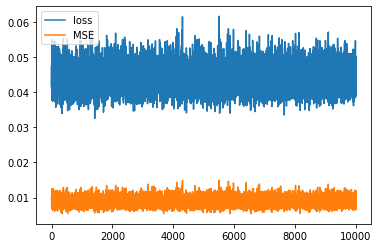

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


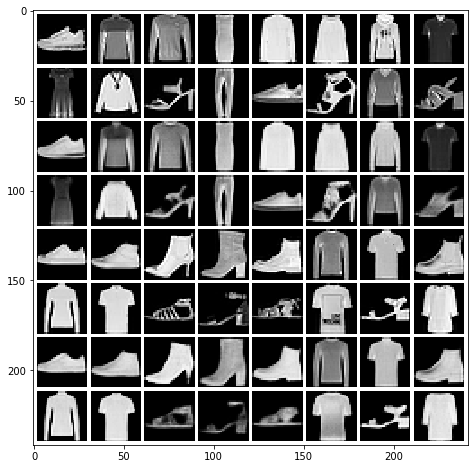

Mean squared dist: 0.009976085
epoch: 81 	 step:0 	 loss: 0.04308 	 reg loss: 0.001751
epoch: 81 	 step:100 	 loss: 0.0385 	 reg loss: 0.001731
epoch: 81 	 step:200 	 loss: 0.03934 	 reg loss: 0.00164
epoch: 81 	 step:300 	 loss: 0.04705 	 reg loss: 0.001735
epoch: 81 	 step:400 	 loss: 0.04156 	 reg loss: 0.001804
epoch: 81 	 step:500 	 loss: 0.05367 	 reg loss: 0.001777
epoch: 81 	 step:600 	 loss: 0.04421 	 reg loss: 0.001796
epoch: 81 	 step:700 	 loss: 0.04351 	 reg loss: 0.001769
epoch: 81 	 step:800 	 loss: 0.03669 	 reg loss: 0.001735
epoch: 81 	 step:900 	 loss: 0.04444 	 reg loss: 0.00182
epoch: 81 	 step:1000 	 loss: 0.04005 	 reg loss: 0.00174
epoch: 81 	 step:1100 	 loss: 0.04336 	 reg loss: 0.001781
epoch: 81 	 step:1200 	 loss: 0.05037 	 reg loss: 0.001818
epoch: 81 	 step:1300 	 loss: 0.05028 	 reg loss: 0.00179
epoch: 81 	 step:1400 	 loss: 0.04975 	 reg loss: 0.001824
epoch: 81 	 step:1500 	 loss: 0.04214 	 reg loss: 0.001642
epoch: 81 	 step:1600 	 loss: 0.04403 	 re

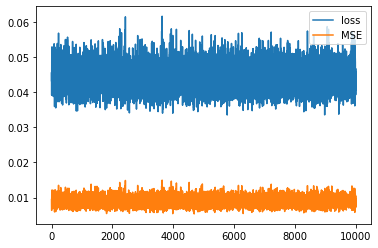

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


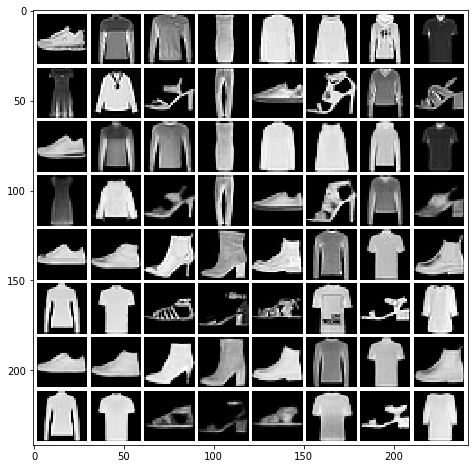

Mean squared dist: 0.010008439
epoch: 82 	 step:0 	 loss: 0.04596 	 reg loss: 0.001771
epoch: 82 	 step:100 	 loss: 0.04693 	 reg loss: 0.001726
epoch: 82 	 step:200 	 loss: 0.03997 	 reg loss: 0.001777
epoch: 82 	 step:300 	 loss: 0.04648 	 reg loss: 0.001748
epoch: 82 	 step:400 	 loss: 0.04353 	 reg loss: 0.001837
epoch: 82 	 step:500 	 loss: 0.04655 	 reg loss: 0.001845
epoch: 82 	 step:600 	 loss: 0.04257 	 reg loss: 0.001913
epoch: 82 	 step:700 	 loss: 0.04175 	 reg loss: 0.001705
epoch: 82 	 step:800 	 loss: 0.04215 	 reg loss: 0.001707
epoch: 82 	 step:900 	 loss: 0.04064 	 reg loss: 0.001739
epoch: 82 	 step:1000 	 loss: 0.03532 	 reg loss: 0.00172
epoch: 82 	 step:1100 	 loss: 0.03413 	 reg loss: 0.001698
epoch: 82 	 step:1200 	 loss: 0.04767 	 reg loss: 0.001789
epoch: 82 	 step:1300 	 loss: 0.04422 	 reg loss: 0.001702
epoch: 82 	 step:1400 	 loss: 0.04794 	 reg loss: 0.001737
epoch: 82 	 step:1500 	 loss: 0.04584 	 reg loss: 0.001769
epoch: 82 	 step:1600 	 loss: 0.04414 

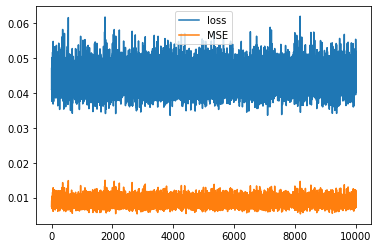

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


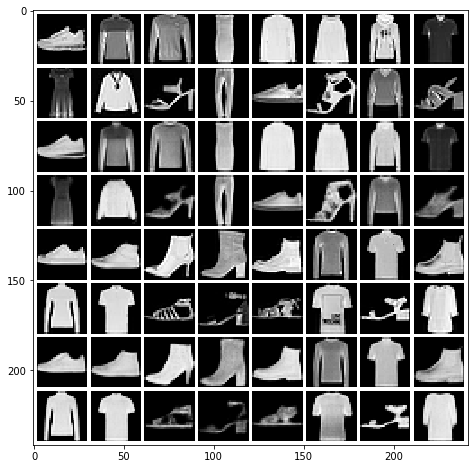

Mean squared dist: 0.009946751
epoch: 83 	 step:0 	 loss: 0.05325 	 reg loss: 0.001769
epoch: 83 	 step:100 	 loss: 0.04041 	 reg loss: 0.001729
epoch: 83 	 step:200 	 loss: 0.05118 	 reg loss: 0.00178
epoch: 83 	 step:300 	 loss: 0.04488 	 reg loss: 0.001738
epoch: 83 	 step:400 	 loss: 0.04055 	 reg loss: 0.001765
epoch: 83 	 step:500 	 loss: 0.04512 	 reg loss: 0.001752
epoch: 83 	 step:600 	 loss: 0.04308 	 reg loss: 0.001732
epoch: 83 	 step:700 	 loss: 0.04666 	 reg loss: 0.001784
epoch: 83 	 step:800 	 loss: 0.04394 	 reg loss: 0.001738
epoch: 83 	 step:900 	 loss: 0.04575 	 reg loss: 0.001831
epoch: 83 	 step:1000 	 loss: 0.04734 	 reg loss: 0.001782
epoch: 83 	 step:1100 	 loss: 0.04604 	 reg loss: 0.001794
epoch: 83 	 step:1200 	 loss: 0.03927 	 reg loss: 0.001652
epoch: 83 	 step:1300 	 loss: 0.04884 	 reg loss: 0.001731
epoch: 83 	 step:1400 	 loss: 0.04796 	 reg loss: 0.001688
epoch: 83 	 step:1500 	 loss: 0.03854 	 reg loss: 0.001752
epoch: 83 	 step:1600 	 loss: 0.04401 

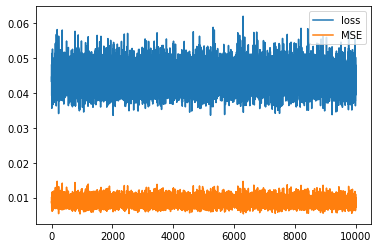

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


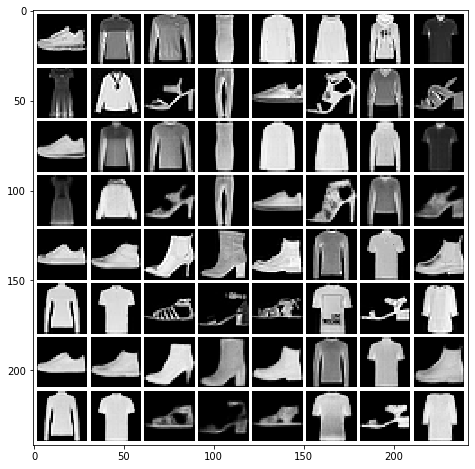

Mean squared dist: 0.009874141
epoch: 84 	 step:0 	 loss: 0.03958 	 reg loss: 0.001679
epoch: 84 	 step:100 	 loss: 0.04273 	 reg loss: 0.001735
epoch: 84 	 step:200 	 loss: 0.04649 	 reg loss: 0.001788
epoch: 84 	 step:300 	 loss: 0.04126 	 reg loss: 0.001736
epoch: 84 	 step:400 	 loss: 0.03775 	 reg loss: 0.001722
epoch: 84 	 step:500 	 loss: 0.03583 	 reg loss: 0.001742
epoch: 84 	 step:600 	 loss: 0.03944 	 reg loss: 0.001758
epoch: 84 	 step:700 	 loss: 0.03936 	 reg loss: 0.001772
epoch: 84 	 step:800 	 loss: 0.0459 	 reg loss: 0.001791
epoch: 84 	 step:900 	 loss: 0.03684 	 reg loss: 0.00169
epoch: 84 	 step:1000 	 loss: 0.04541 	 reg loss: 0.001803
epoch: 84 	 step:1100 	 loss: 0.04557 	 reg loss: 0.001748
epoch: 84 	 step:1200 	 loss: 0.04801 	 reg loss: 0.001811
epoch: 84 	 step:1300 	 loss: 0.04251 	 reg loss: 0.001743
epoch: 84 	 step:1400 	 loss: 0.04515 	 reg loss: 0.001702
epoch: 84 	 step:1500 	 loss: 0.04457 	 reg loss: 0.001782
epoch: 84 	 step:1600 	 loss: 0.04412 	

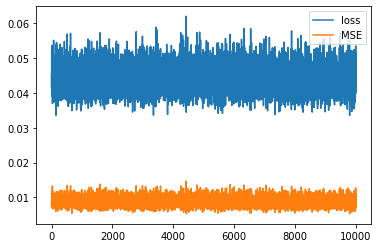

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


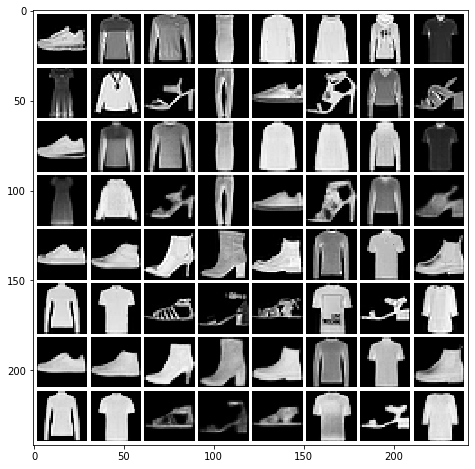

Mean squared dist: 0.009980405
epoch: 85 	 step:0 	 loss: 0.04293 	 reg loss: 0.001776
epoch: 85 	 step:100 	 loss: 0.04019 	 reg loss: 0.001779
epoch: 85 	 step:200 	 loss: 0.03767 	 reg loss: 0.001817
epoch: 85 	 step:300 	 loss: 0.04189 	 reg loss: 0.001807
epoch: 85 	 step:400 	 loss: 0.04775 	 reg loss: 0.001789
epoch: 85 	 step:500 	 loss: 0.04059 	 reg loss: 0.001792
epoch: 85 	 step:600 	 loss: 0.04377 	 reg loss: 0.001741
epoch: 85 	 step:700 	 loss: 0.0475 	 reg loss: 0.001835
epoch: 85 	 step:800 	 loss: 0.03834 	 reg loss: 0.00182
epoch: 85 	 step:900 	 loss: 0.03727 	 reg loss: 0.001752
epoch: 85 	 step:1000 	 loss: 0.04345 	 reg loss: 0.00182
epoch: 85 	 step:1100 	 loss: 0.04303 	 reg loss: 0.001777
epoch: 85 	 step:1200 	 loss: 0.05064 	 reg loss: 0.001752
epoch: 85 	 step:1300 	 loss: 0.03931 	 reg loss: 0.001786
epoch: 85 	 step:1400 	 loss: 0.03865 	 reg loss: 0.001748
epoch: 85 	 step:1500 	 loss: 0.04454 	 reg loss: 0.001791
epoch: 85 	 step:1600 	 loss: 0.04288 	 

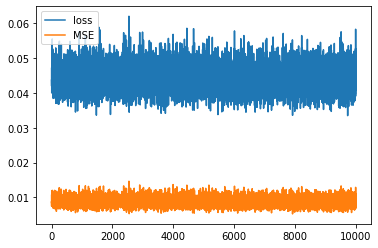

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


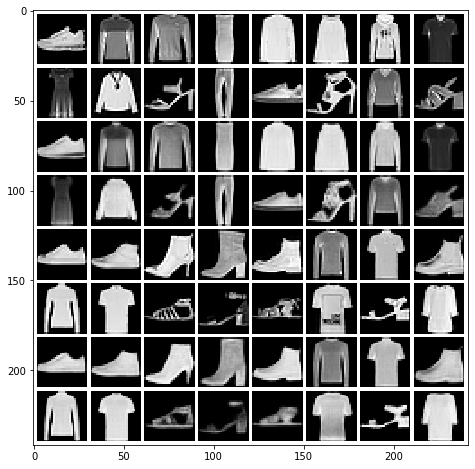

Mean squared dist: 0.009924234
epoch: 86 	 step:0 	 loss: 0.04751 	 reg loss: 0.001755
epoch: 86 	 step:100 	 loss: 0.04631 	 reg loss: 0.001756
epoch: 86 	 step:200 	 loss: 0.0405 	 reg loss: 0.001768
epoch: 86 	 step:300 	 loss: 0.04399 	 reg loss: 0.001709
epoch: 86 	 step:400 	 loss: 0.03767 	 reg loss: 0.001752
epoch: 86 	 step:500 	 loss: 0.04011 	 reg loss: 0.001736
epoch: 86 	 step:600 	 loss: 0.05058 	 reg loss: 0.001764
epoch: 86 	 step:700 	 loss: 0.0497 	 reg loss: 0.001826
epoch: 86 	 step:800 	 loss: 0.04113 	 reg loss: 0.001759
epoch: 86 	 step:900 	 loss: 0.05075 	 reg loss: 0.001815
epoch: 86 	 step:1000 	 loss: 0.04282 	 reg loss: 0.001783
epoch: 86 	 step:1100 	 loss: 0.04628 	 reg loss: 0.001808
epoch: 86 	 step:1200 	 loss: 0.04329 	 reg loss: 0.001732
epoch: 86 	 step:1300 	 loss: 0.04121 	 reg loss: 0.001765
epoch: 86 	 step:1400 	 loss: 0.0509 	 reg loss: 0.001763
epoch: 86 	 step:1500 	 loss: 0.0407 	 reg loss: 0.0018
epoch: 86 	 step:1600 	 loss: 0.04613 	 reg

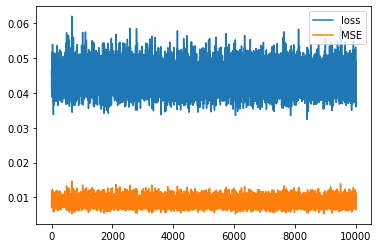

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


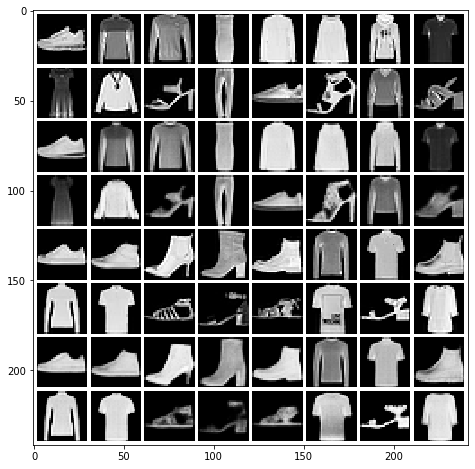

Mean squared dist: 0.00990127
epoch: 87 	 step:0 	 loss: 0.04255 	 reg loss: 0.001738
epoch: 87 	 step:100 	 loss: 0.03796 	 reg loss: 0.001697
epoch: 87 	 step:200 	 loss: 0.04799 	 reg loss: 0.00172
epoch: 87 	 step:300 	 loss: 0.05018 	 reg loss: 0.001774
epoch: 87 	 step:400 	 loss: 0.0436 	 reg loss: 0.001791
epoch: 87 	 step:500 	 loss: 0.04078 	 reg loss: 0.00171
epoch: 87 	 step:600 	 loss: 0.04041 	 reg loss: 0.001778
epoch: 87 	 step:700 	 loss: 0.03953 	 reg loss: 0.001739
epoch: 87 	 step:800 	 loss: 0.04376 	 reg loss: 0.001813
epoch: 87 	 step:900 	 loss: 0.04576 	 reg loss: 0.001748
epoch: 87 	 step:1000 	 loss: 0.03993 	 reg loss: 0.001806
epoch: 87 	 step:1100 	 loss: 0.04357 	 reg loss: 0.001709
epoch: 87 	 step:1200 	 loss: 0.04734 	 reg loss: 0.001795
epoch: 87 	 step:1300 	 loss: 0.04115 	 reg loss: 0.001736
epoch: 87 	 step:1400 	 loss: 0.04545 	 reg loss: 0.001744
epoch: 87 	 step:1500 	 loss: 0.04361 	 reg loss: 0.001808
epoch: 87 	 step:1600 	 loss: 0.03891 	 r

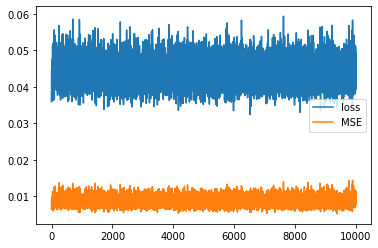

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


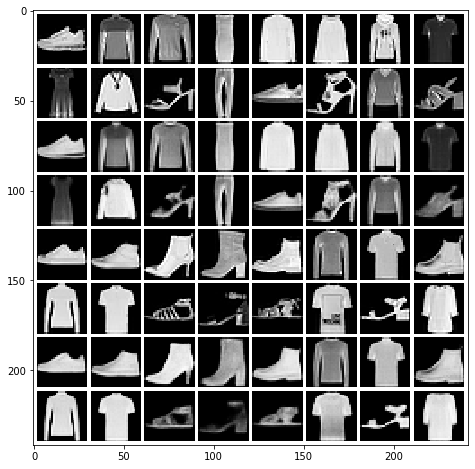

Mean squared dist: 0.009848977
epoch: 88 	 step:0 	 loss: 0.04118 	 reg loss: 0.001769
epoch: 88 	 step:100 	 loss: 0.04844 	 reg loss: 0.001816
epoch: 88 	 step:200 	 loss: 0.0495 	 reg loss: 0.001826
epoch: 88 	 step:300 	 loss: 0.04301 	 reg loss: 0.001832
epoch: 88 	 step:400 	 loss: 0.04958 	 reg loss: 0.001792
epoch: 88 	 step:500 	 loss: 0.03769 	 reg loss: 0.001769
epoch: 88 	 step:600 	 loss: 0.04607 	 reg loss: 0.001769
epoch: 88 	 step:700 	 loss: 0.05252 	 reg loss: 0.001822
epoch: 88 	 step:800 	 loss: 0.0439 	 reg loss: 0.001751
epoch: 88 	 step:900 	 loss: 0.04492 	 reg loss: 0.001757
epoch: 88 	 step:1000 	 loss: 0.04904 	 reg loss: 0.001788
epoch: 88 	 step:1100 	 loss: 0.04542 	 reg loss: 0.001841
epoch: 88 	 step:1200 	 loss: 0.0451 	 reg loss: 0.001666
epoch: 88 	 step:1300 	 loss: 0.04624 	 reg loss: 0.001768
epoch: 88 	 step:1400 	 loss: 0.03816 	 reg loss: 0.001746
epoch: 88 	 step:1500 	 loss: 0.04905 	 reg loss: 0.001856
epoch: 88 	 step:1600 	 loss: 0.04597 	 

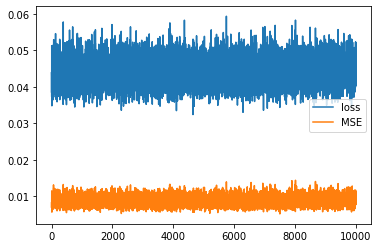

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


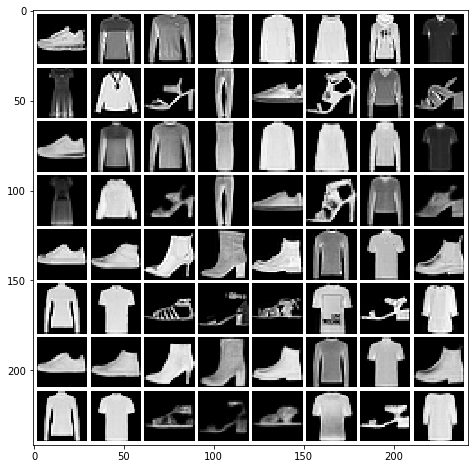

Mean squared dist: 0.009869537
epoch: 89 	 step:0 	 loss: 0.04493 	 reg loss: 0.001748
epoch: 89 	 step:100 	 loss: 0.04725 	 reg loss: 0.001829
epoch: 89 	 step:200 	 loss: 0.03882 	 reg loss: 0.001649
epoch: 89 	 step:300 	 loss: 0.03847 	 reg loss: 0.001751
epoch: 89 	 step:400 	 loss: 0.04848 	 reg loss: 0.001838
epoch: 89 	 step:500 	 loss: 0.04294 	 reg loss: 0.001825
epoch: 89 	 step:600 	 loss: 0.04133 	 reg loss: 0.001777
epoch: 89 	 step:700 	 loss: 0.04052 	 reg loss: 0.001771
epoch: 89 	 step:800 	 loss: 0.0399 	 reg loss: 0.001711
epoch: 89 	 step:900 	 loss: 0.04177 	 reg loss: 0.001732
epoch: 89 	 step:1000 	 loss: 0.0433 	 reg loss: 0.001771
epoch: 89 	 step:1100 	 loss: 0.04184 	 reg loss: 0.001772
epoch: 89 	 step:1200 	 loss: 0.04243 	 reg loss: 0.001753
epoch: 89 	 step:1300 	 loss: 0.04208 	 reg loss: 0.001725
epoch: 89 	 step:1400 	 loss: 0.03754 	 reg loss: 0.001741
epoch: 89 	 step:1500 	 loss: 0.04866 	 reg loss: 0.001791
epoch: 89 	 step:1600 	 loss: 0.04324 	

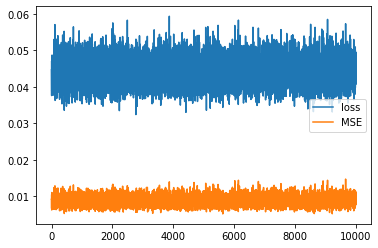

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


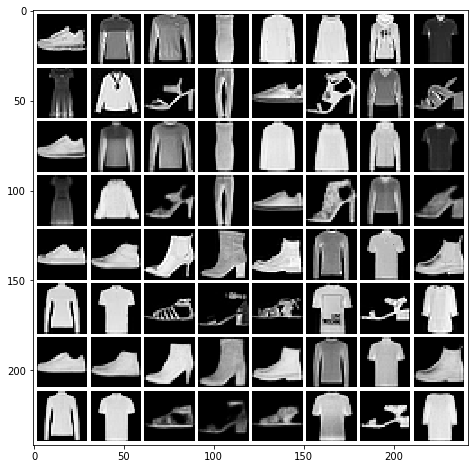

Mean squared dist: 0.009856885
epoch: 90 	 step:0 	 loss: 0.04431 	 reg loss: 0.001789
epoch: 90 	 step:100 	 loss: 0.03855 	 reg loss: 0.001785
epoch: 90 	 step:200 	 loss: 0.04289 	 reg loss: 0.001769
epoch: 90 	 step:300 	 loss: 0.04549 	 reg loss: 0.001749
epoch: 90 	 step:400 	 loss: 0.043 	 reg loss: 0.00173
epoch: 90 	 step:500 	 loss: 0.04309 	 reg loss: 0.001726
epoch: 90 	 step:600 	 loss: 0.04027 	 reg loss: 0.001753
epoch: 90 	 step:700 	 loss: 0.04275 	 reg loss: 0.001751
epoch: 90 	 step:800 	 loss: 0.03922 	 reg loss: 0.001702
epoch: 90 	 step:900 	 loss: 0.04602 	 reg loss: 0.001767
epoch: 90 	 step:1000 	 loss: 0.04139 	 reg loss: 0.001765
epoch: 90 	 step:1100 	 loss: 0.03903 	 reg loss: 0.001758
epoch: 90 	 step:1200 	 loss: 0.04764 	 reg loss: 0.001743
epoch: 90 	 step:1300 	 loss: 0.03998 	 reg loss: 0.00173
epoch: 90 	 step:1400 	 loss: 0.04304 	 reg loss: 0.001749
epoch: 90 	 step:1500 	 loss: 0.04266 	 reg loss: 0.001777
epoch: 90 	 step:1600 	 loss: 0.04443 	 r

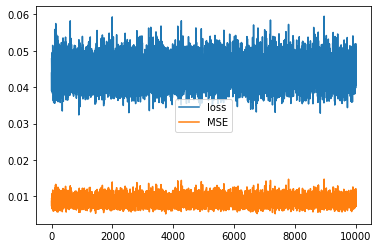

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


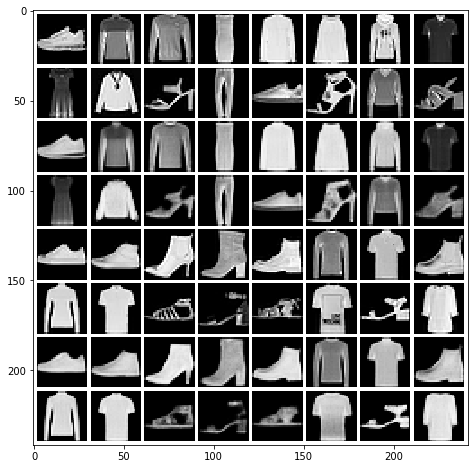

Mean squared dist: 0.009806034
epoch: 91 	 step:0 	 loss: 0.04528 	 reg loss: 0.001746
epoch: 91 	 step:100 	 loss: 0.0419 	 reg loss: 0.001688
epoch: 91 	 step:200 	 loss: 0.04441 	 reg loss: 0.001824
epoch: 91 	 step:300 	 loss: 0.04433 	 reg loss: 0.001718
epoch: 91 	 step:400 	 loss: 0.04728 	 reg loss: 0.001765
epoch: 91 	 step:500 	 loss: 0.04456 	 reg loss: 0.001715
epoch: 91 	 step:600 	 loss: 0.04535 	 reg loss: 0.001801
epoch: 91 	 step:700 	 loss: 0.04528 	 reg loss: 0.001827
epoch: 91 	 step:800 	 loss: 0.0387 	 reg loss: 0.001757
epoch: 91 	 step:900 	 loss: 0.0467 	 reg loss: 0.00179
epoch: 91 	 step:1000 	 loss: 0.0382 	 reg loss: 0.001754
epoch: 91 	 step:1100 	 loss: 0.04719 	 reg loss: 0.00179
epoch: 91 	 step:1200 	 loss: 0.04698 	 reg loss: 0.001718
epoch: 91 	 step:1300 	 loss: 0.053 	 reg loss: 0.00175
epoch: 91 	 step:1400 	 loss: 0.04142 	 reg loss: 0.001734
epoch: 91 	 step:1500 	 loss: 0.04467 	 reg loss: 0.001813
epoch: 91 	 step:1600 	 loss: 0.04723 	 reg lo

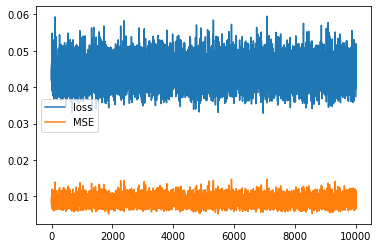

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


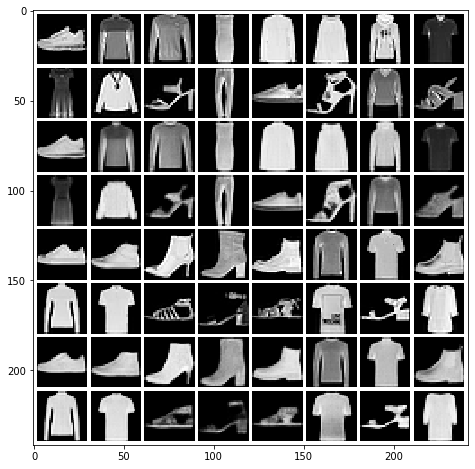

Mean squared dist: 0.009868032
epoch: 92 	 step:0 	 loss: 0.04384 	 reg loss: 0.001779
epoch: 92 	 step:100 	 loss: 0.05104 	 reg loss: 0.001832
epoch: 92 	 step:200 	 loss: 0.0435 	 reg loss: 0.001791
epoch: 92 	 step:300 	 loss: 0.04583 	 reg loss: 0.001771
epoch: 92 	 step:400 	 loss: 0.03349 	 reg loss: 0.001668
epoch: 92 	 step:500 	 loss: 0.04393 	 reg loss: 0.001816
epoch: 92 	 step:600 	 loss: 0.03918 	 reg loss: 0.00177
epoch: 92 	 step:700 	 loss: 0.04208 	 reg loss: 0.001734
epoch: 92 	 step:800 	 loss: 0.0407 	 reg loss: 0.001772
epoch: 92 	 step:900 	 loss: 0.04045 	 reg loss: 0.001721
epoch: 92 	 step:1000 	 loss: 0.04859 	 reg loss: 0.001772
epoch: 92 	 step:1100 	 loss: 0.0395 	 reg loss: 0.001759
epoch: 92 	 step:1200 	 loss: 0.04645 	 reg loss: 0.001747
epoch: 92 	 step:1300 	 loss: 0.04474 	 reg loss: 0.001762
epoch: 92 	 step:1400 	 loss: 0.04905 	 reg loss: 0.001766
epoch: 92 	 step:1500 	 loss: 0.04029 	 reg loss: 0.001776
epoch: 92 	 step:1600 	 loss: 0.03594 	 r

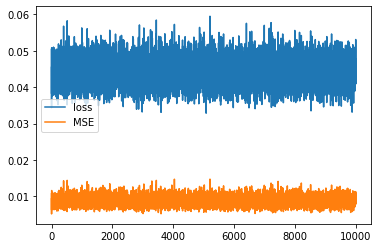

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


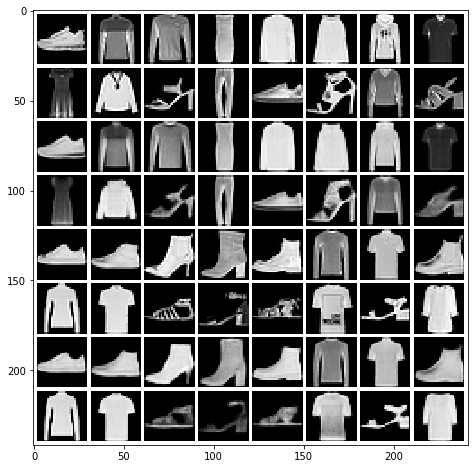

Mean squared dist: 0.009765529
epoch: 93 	 step:0 	 loss: 0.04346 	 reg loss: 0.001726
epoch: 93 	 step:100 	 loss: 0.04703 	 reg loss: 0.001818
epoch: 93 	 step:200 	 loss: 0.04927 	 reg loss: 0.001778
epoch: 93 	 step:300 	 loss: 0.03706 	 reg loss: 0.001814
epoch: 93 	 step:400 	 loss: 0.04256 	 reg loss: 0.001834
epoch: 93 	 step:500 	 loss: 0.03968 	 reg loss: 0.0018
epoch: 93 	 step:600 	 loss: 0.04148 	 reg loss: 0.001708
epoch: 93 	 step:700 	 loss: 0.04377 	 reg loss: 0.001727
epoch: 93 	 step:800 	 loss: 0.0367 	 reg loss: 0.001776
epoch: 93 	 step:900 	 loss: 0.04051 	 reg loss: 0.001719
epoch: 93 	 step:1000 	 loss: 0.03791 	 reg loss: 0.001709
epoch: 93 	 step:1100 	 loss: 0.04545 	 reg loss: 0.001754
epoch: 93 	 step:1200 	 loss: 0.05014 	 reg loss: 0.0018
epoch: 93 	 step:1300 	 loss: 0.04702 	 reg loss: 0.001757
epoch: 93 	 step:1400 	 loss: 0.04341 	 reg loss: 0.001786
epoch: 93 	 step:1500 	 loss: 0.04473 	 reg loss: 0.001795
epoch: 93 	 step:1600 	 loss: 0.04354 	 re

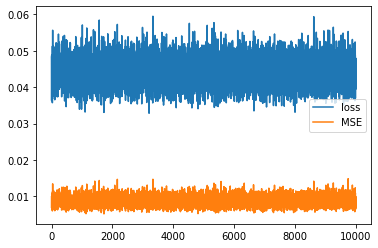

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


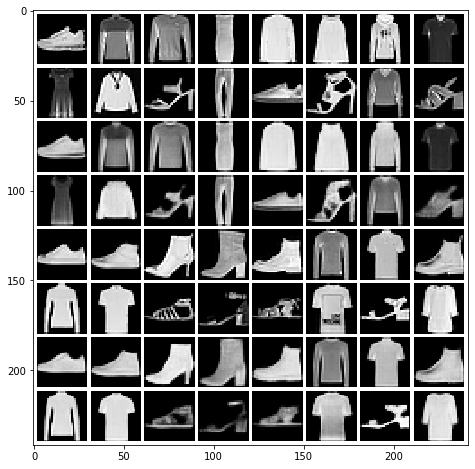

Mean squared dist: 0.009930002
epoch: 94 	 step:0 	 loss: 0.04211 	 reg loss: 0.001799
epoch: 94 	 step:100 	 loss: 0.04693 	 reg loss: 0.001752
epoch: 94 	 step:200 	 loss: 0.04563 	 reg loss: 0.001747
epoch: 94 	 step:300 	 loss: 0.04611 	 reg loss: 0.001776
epoch: 94 	 step:400 	 loss: 0.04141 	 reg loss: 0.001741
epoch: 94 	 step:500 	 loss: 0.04811 	 reg loss: 0.001796
epoch: 94 	 step:600 	 loss: 0.03929 	 reg loss: 0.00178
epoch: 94 	 step:700 	 loss: 0.05249 	 reg loss: 0.001741
epoch: 94 	 step:800 	 loss: 0.04492 	 reg loss: 0.001877
epoch: 94 	 step:900 	 loss: 0.04306 	 reg loss: 0.001777
epoch: 94 	 step:1000 	 loss: 0.04461 	 reg loss: 0.001713
epoch: 94 	 step:1100 	 loss: 0.04228 	 reg loss: 0.001773
epoch: 94 	 step:1200 	 loss: 0.04094 	 reg loss: 0.001841
epoch: 94 	 step:1300 	 loss: 0.04551 	 reg loss: 0.001852
epoch: 94 	 step:1400 	 loss: 0.04389 	 reg loss: 0.001839
epoch: 94 	 step:1500 	 loss: 0.04738 	 reg loss: 0.001786
epoch: 94 	 step:1600 	 loss: 0.04199 

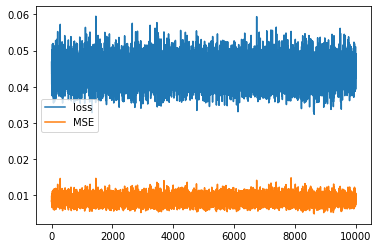

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


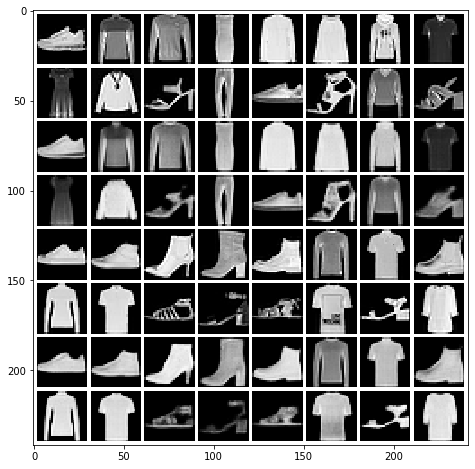

Mean squared dist: 0.009814695
epoch: 95 	 step:0 	 loss: 0.04426 	 reg loss: 0.001722
epoch: 95 	 step:100 	 loss: 0.04592 	 reg loss: 0.001798
epoch: 95 	 step:200 	 loss: 0.04365 	 reg loss: 0.001765
epoch: 95 	 step:300 	 loss: 0.03942 	 reg loss: 0.001722
epoch: 95 	 step:400 	 loss: 0.04193 	 reg loss: 0.001714
epoch: 95 	 step:500 	 loss: 0.0425 	 reg loss: 0.00181
epoch: 95 	 step:600 	 loss: 0.04036 	 reg loss: 0.001724
epoch: 95 	 step:700 	 loss: 0.03741 	 reg loss: 0.001734
epoch: 95 	 step:800 	 loss: 0.03904 	 reg loss: 0.001775
epoch: 95 	 step:900 	 loss: 0.04139 	 reg loss: 0.001808
epoch: 95 	 step:1000 	 loss: 0.04597 	 reg loss: 0.001864
epoch: 95 	 step:1100 	 loss: 0.04929 	 reg loss: 0.00176
epoch: 95 	 step:1200 	 loss: 0.0389 	 reg loss: 0.001722
epoch: 95 	 step:1300 	 loss: 0.04431 	 reg loss: 0.001795
epoch: 95 	 step:1400 	 loss: 0.04453 	 reg loss: 0.001886
epoch: 95 	 step:1500 	 loss: 0.04685 	 reg loss: 0.001785
epoch: 95 	 step:1600 	 loss: 0.0346 	 re

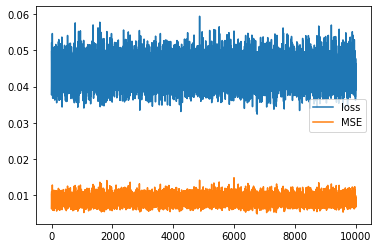

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


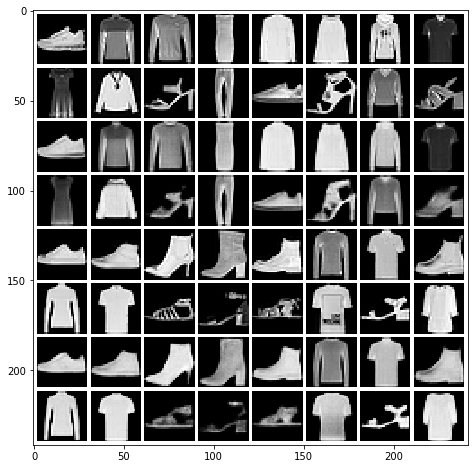

Mean squared dist: 0.009779899
epoch: 96 	 step:0 	 loss: 0.04344 	 reg loss: 0.001707
epoch: 96 	 step:100 	 loss: 0.04019 	 reg loss: 0.001788
epoch: 96 	 step:200 	 loss: 0.04904 	 reg loss: 0.001769
epoch: 96 	 step:300 	 loss: 0.04348 	 reg loss: 0.001759
epoch: 96 	 step:400 	 loss: 0.04724 	 reg loss: 0.001761
epoch: 96 	 step:500 	 loss: 0.04278 	 reg loss: 0.001716
epoch: 96 	 step:600 	 loss: 0.04556 	 reg loss: 0.001818
epoch: 96 	 step:700 	 loss: 0.0458 	 reg loss: 0.001779
epoch: 96 	 step:800 	 loss: 0.04002 	 reg loss: 0.001709
epoch: 96 	 step:900 	 loss: 0.04558 	 reg loss: 0.001715
epoch: 96 	 step:1000 	 loss: 0.04575 	 reg loss: 0.001717
epoch: 96 	 step:1100 	 loss: 0.04511 	 reg loss: 0.001782
epoch: 96 	 step:1200 	 loss: 0.04264 	 reg loss: 0.001778
epoch: 96 	 step:1300 	 loss: 0.05235 	 reg loss: 0.001842
epoch: 96 	 step:1400 	 loss: 0.0375 	 reg loss: 0.001778
epoch: 96 	 step:1500 	 loss: 0.0423 	 reg loss: 0.001744
epoch: 96 	 step:1600 	 loss: 0.04368 	 

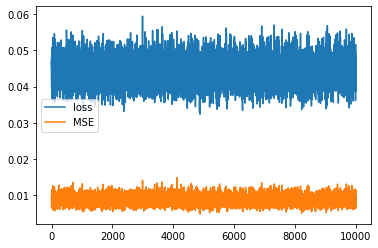

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


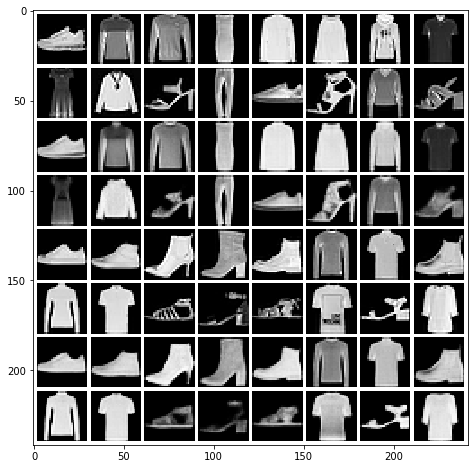

Mean squared dist: 0.009985107
epoch: 97 	 step:0 	 loss: 0.03917 	 reg loss: 0.001631
epoch: 97 	 step:100 	 loss: 0.04249 	 reg loss: 0.001818
epoch: 97 	 step:200 	 loss: 0.04905 	 reg loss: 0.001767
epoch: 97 	 step:300 	 loss: 0.04677 	 reg loss: 0.001765
epoch: 97 	 step:400 	 loss: 0.04561 	 reg loss: 0.001795
epoch: 97 	 step:500 	 loss: 0.04412 	 reg loss: 0.001776
epoch: 97 	 step:600 	 loss: 0.04253 	 reg loss: 0.001774
epoch: 97 	 step:700 	 loss: 0.04055 	 reg loss: 0.001802
epoch: 97 	 step:800 	 loss: 0.04412 	 reg loss: 0.001771
epoch: 97 	 step:900 	 loss: 0.04143 	 reg loss: 0.001763
epoch: 97 	 step:1000 	 loss: 0.04421 	 reg loss: 0.001784
epoch: 97 	 step:1100 	 loss: 0.04799 	 reg loss: 0.001735
epoch: 97 	 step:1200 	 loss: 0.04533 	 reg loss: 0.001821
epoch: 97 	 step:1300 	 loss: 0.04371 	 reg loss: 0.001779
epoch: 97 	 step:1400 	 loss: 0.04886 	 reg loss: 0.001798
epoch: 97 	 step:1500 	 loss: 0.04553 	 reg loss: 0.001728
epoch: 97 	 step:1600 	 loss: 0.03888

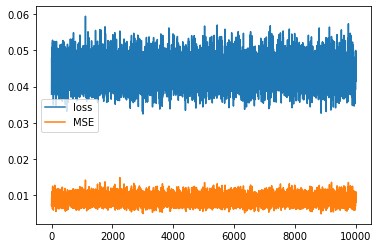

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


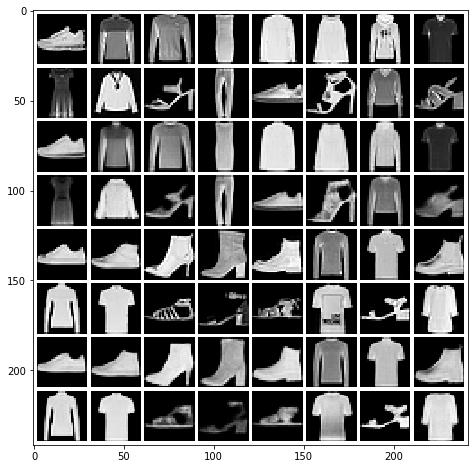

Mean squared dist: 0.009866454
epoch: 98 	 step:0 	 loss: 0.04892 	 reg loss: 0.001743
epoch: 98 	 step:100 	 loss: 0.04288 	 reg loss: 0.001802
epoch: 98 	 step:200 	 loss: 0.04399 	 reg loss: 0.00176
epoch: 98 	 step:300 	 loss: 0.04216 	 reg loss: 0.001795
epoch: 98 	 step:400 	 loss: 0.04024 	 reg loss: 0.001767
epoch: 98 	 step:500 	 loss: 0.04021 	 reg loss: 0.001734
epoch: 98 	 step:600 	 loss: 0.04848 	 reg loss: 0.001782
epoch: 98 	 step:700 	 loss: 0.03395 	 reg loss: 0.001713
epoch: 98 	 step:800 	 loss: 0.04069 	 reg loss: 0.001707
epoch: 98 	 step:900 	 loss: 0.0406 	 reg loss: 0.001811
epoch: 98 	 step:1000 	 loss: 0.04341 	 reg loss: 0.0018
epoch: 98 	 step:1100 	 loss: 0.04297 	 reg loss: 0.001769
epoch: 98 	 step:1200 	 loss: 0.04729 	 reg loss: 0.001717
epoch: 98 	 step:1300 	 loss: 0.044 	 reg loss: 0.001735
epoch: 98 	 step:1400 	 loss: 0.04824 	 reg loss: 0.001749
epoch: 98 	 step:1500 	 loss: 0.0432 	 reg loss: 0.00175
epoch: 98 	 step:1600 	 loss: 0.04047 	 reg l

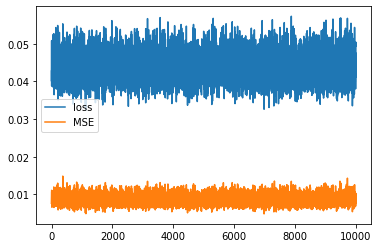

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


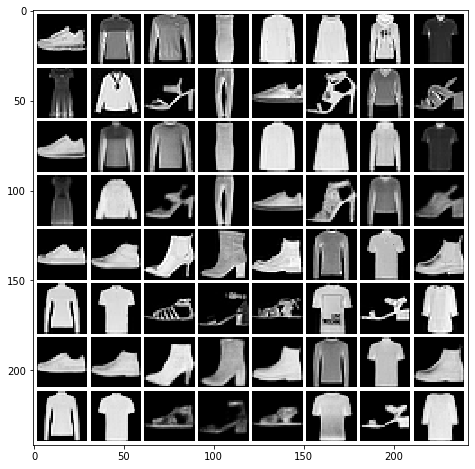

Mean squared dist: 0.009911729
epoch: 99 	 step:0 	 loss: 0.04167 	 reg loss: 0.00178
epoch: 99 	 step:100 	 loss: 0.04366 	 reg loss: 0.001796
epoch: 99 	 step:200 	 loss: 0.0475 	 reg loss: 0.001795
epoch: 99 	 step:300 	 loss: 0.03791 	 reg loss: 0.001709
epoch: 99 	 step:400 	 loss: 0.04755 	 reg loss: 0.001812
epoch: 99 	 step:500 	 loss: 0.04448 	 reg loss: 0.001803
epoch: 99 	 step:600 	 loss: 0.0423 	 reg loss: 0.001767
epoch: 99 	 step:700 	 loss: 0.04682 	 reg loss: 0.001733
epoch: 99 	 step:800 	 loss: 0.04212 	 reg loss: 0.001789
epoch: 99 	 step:900 	 loss: 0.04378 	 reg loss: 0.001764
epoch: 99 	 step:1000 	 loss: 0.04007 	 reg loss: 0.001811
epoch: 99 	 step:1100 	 loss: 0.04201 	 reg loss: 0.00171
epoch: 99 	 step:1200 	 loss: 0.04307 	 reg loss: 0.001734
epoch: 99 	 step:1300 	 loss: 0.04464 	 reg loss: 0.00182
epoch: 99 	 step:1400 	 loss: 0.04496 	 reg loss: 0.001737
epoch: 99 	 step:1500 	 loss: 0.0477 	 reg loss: 0.001743
epoch: 99 	 step:1600 	 loss: 0.03838 	 reg

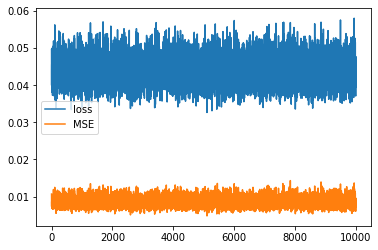

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


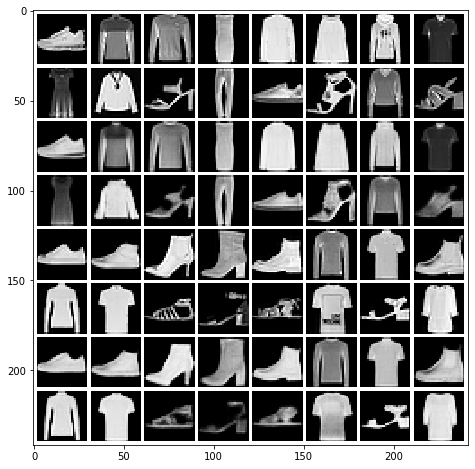

Mean squared dist: 0.009824983
epoch: 100 	 step:0 	 loss: 0.04375 	 reg loss: 0.001773
epoch: 100 	 step:100 	 loss: 0.04193 	 reg loss: 0.001827
epoch: 100 	 step:200 	 loss: 0.04546 	 reg loss: 0.001763
epoch: 100 	 step:300 	 loss: 0.04108 	 reg loss: 0.001801
epoch: 100 	 step:400 	 loss: 0.04128 	 reg loss: 0.001739
epoch: 100 	 step:500 	 loss: 0.04911 	 reg loss: 0.001784
epoch: 100 	 step:600 	 loss: 0.03889 	 reg loss: 0.001741
epoch: 100 	 step:700 	 loss: 0.04458 	 reg loss: 0.001693
epoch: 100 	 step:800 	 loss: 0.04826 	 reg loss: 0.001796
epoch: 100 	 step:900 	 loss: 0.04544 	 reg loss: 0.001806
epoch: 100 	 step:1000 	 loss: 0.03782 	 reg loss: 0.001799
epoch: 100 	 step:1100 	 loss: 0.04311 	 reg loss: 0.001767
epoch: 100 	 step:1200 	 loss: 0.04222 	 reg loss: 0.001692
epoch: 100 	 step:1300 	 loss: 0.04532 	 reg loss: 0.001781
epoch: 100 	 step:1400 	 loss: 0.0468 	 reg loss: 0.001776
epoch: 100 	 step:1500 	 loss: 0.04292 	 reg loss: 0.001749
epoch: 100 	 step:1600

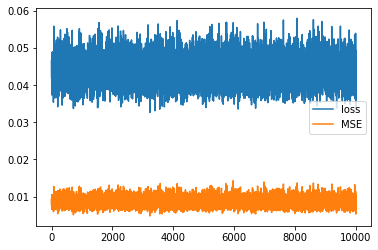

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


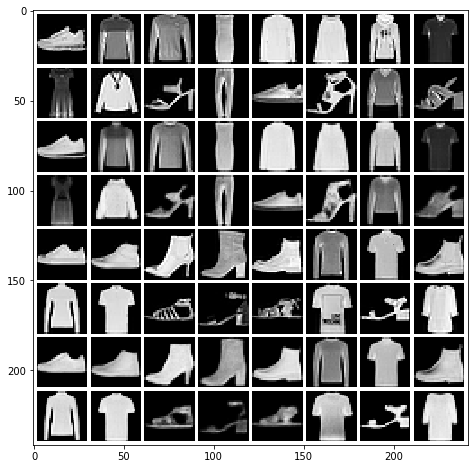

Mean squared dist: 0.009910754
Avg loss last epoch: 0.043761545997858045


FileNotFoundError: [Errno 2] No such file or directory: '../cache/vae/FC-VAE128Fashion_100_0100_20191015_164123.sd'

In [12]:
### TRAIN MODEL ###

num_epochs = 100

history = train_model(vae, optimizer, device, dataloader['train'], epochs=num_epochs);

print("Avg loss last epoch:", np.mean(history[-len(history) // num_epochs:]))

model_weights = vae.state_dict().copy()
torch.save(model_weights, "../cache/vae/FC-VAE128Fashion_{0}_{0:04d}_{1}.sd".format(num_epochs, time.strftime("%Y%m%d_%H%M%S")))

In [12]:
### LOAD MODEL ###

latent_dim = 128
hidden_dim = 500

vae = models.SignalVAE(shape=imsize, latent_dim=latent_dim, hidden_dim=hidden_dim)
vae.load_state_dict(torch.load("/home/shared/phase-retrieval/models/VAE_Fashion/FC-VAE128Fashion_6.sd"));

Version 4


In [13]:
test_recon, test_images = test_model(vae, device, dataloader['test'])
print(test_images.shape)
print(test_recon.shape)

(8000, 1, 28, 28)
(8000, 1, 28, 28)


In [14]:
# Benchmark reconstruction #

benchmark(pred=test_recon[:1024], true=test_images[:1024], check_all=True)

Signal error:
  MSE: 0.009730109474276105, std: 0.008550908329911346
  MAE: 0.04478507530075149, std: 0.023203250450177484
  SSIM: 0.8230199264239854, std: 0.12777366112675892
  PhCo-MSE: 0.010863201059692074, std: 0.013815162456126677
  PhCo-MAE: 0.04665438633310259, std: 0.02965002483888267
  PhCo-SSIM: 0.8158024003824005, std: 0.14491967546540938
  CroCo-MSE: 0.009724864652980614, std: 0.008541873523604146
  CroCo-MAE: 0.0447827264033549, std: 0.023203097231214782
  CroCo-SSIM: 0.8231038715376584, std: 0.12763577048888192

Magnitude error:
  MSE Magnitude: 3.6015620334112954, std: 3.346245719351356

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.009730 | 0.04479 | 0.8230 | 0.01086 | 0.04665 | 0.8158 | 0.009725 | 0.04478 | 0.8231 | 3.602 |


## Evaluation for different VAE  (1024 samples)

| Nr | Size | alpha | gamma | epochs |  MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | 784-500-500-20 | 1.0 | 1e-3 | 50 | 
| 2 | 784-500-500-20 | 2.0 | 1e-3 | 50 | 
| 3 | 784-500-500-128 | 2.0 | 1e-3 | 50 | 0.009188 | 0.04762 | 0.8184 | 0.009865 | 0.04890 | 0.8129 | 0.009183 | 0.04762 | 0.8184 | 3.864 |
| 4 | 784-500-500-784 | 2.0 | 1e-3 | 50 | 
| 5 | 784-500-500-128 | 1.0 | 1e-3 | 100 | 0.008981 | 0.04331 | 0.8308 | 0.009633 | 0.04441 | 0.8252 | 0.008976 | 0.04330 | 0.8310 | 3.444 |
| 6 | 784-500-500-128 | 2.0 | 1e-3 | 100 | 0.009043 | 0.04680 | 0.8209 | 0.009630 | 0.04793 | 0.8161 | 0.009040 | 0.04679 | 0.8210 | 3.737 |
| 7 | 784-2048-2048-128 | 1.0 | 1e-3 | 100 | 0.009730 | 0.04479 | 0.8230 | 0.01086 | 0.04665 | 0.8158 | 0.009725 | 0.04478 | 0.8231 | 3.602 |


In [15]:
### Load model ###

fcnet = models.FCNet(imsize=imsize, h=2048)
fcnet.load_state_dict(torch.load("../cache/models/FCnet_Fashion/FCNet2048Fashion_6.sd",
                      map_location={'cuda:1': device.__str__()}));

Version 0.4


In [15]:
### Hand Paper (adapted) ###

def calc_mags(x):
    ft =  torch.rfft(x, 2, onesided=False)
    mags = torch.sqrt(torch.sum(ft**2, -1) + 1e-16)
    return mags

def vaeopt(sample_magnitudes, vae, device, measurement_fn=calc_mags,
           z_shape=(20, 1, 1), init_x=None, optim_lr=1.0, max_steps=5000, max_loss=0.0):
    
    vae.to(device)
    vae.eval()
    
    N = sample_magnitudes.shape[0]
    
    if init_x is None:
        z = torch.randn((N, *z_shape), requires_grad=True, device=device)
    else:
        z = vae.encoder(init_x)[0].clone().detach().requires_grad_(True)
        
    optimizer = optim.Adam([z], lr=optim_lr)
    
    losses = []
    last_out = vae.decoder(z)
    
    for i in range(max_steps):
 
        magnitudes = measurement_fn(last_out)
        mse_all = torch.mean((magnitudes - sample_magnitudes) ** 2, dim=tuple(np.arange(len(magnitudes.shape))[1:]))
        loss = torch.sum(mse_all)
        
        if loss < max_loss:
            break
   
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        last_out = vae.decoder(z)

        losses.append(loss.detach().cpu().item())
        
    return last_out.detach(), losses, mse_all

Batch 1/1 finished


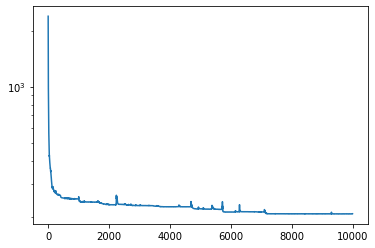

In [16]:
### Test one sample Fourier magnitudes random init + multiple restarts ###

num_batches = 1
batch_size = 32
max_steps = 10000
max_loss = 0.0
optim_lr = 1e-1
restarts = 3

###

out_original = np.zeros((batch_size * num_batches, *imsize))
out_results = np.zeros((batch_size * num_batches, *imsize))
mse_all = np.full((batch_size * num_batches), np.inf)

for batch_i, batch in enumerate(dataloader['test']):
    test_sample = batch.to(device)
    test_magnitudes = calc_mags(test_sample)   
    out_original[batch_size * batch_i : batch_size * batch_i + batch_size] = test_sample.cpu().numpy()
    
    for r in range(restarts):
        cur_out_results, cur_loss, cur_mse_all = vaeopt(sample_magnitudes=test_magnitudes, vae=vae, device=device,
                                                        z_shape=(latent_dim, ), optim_lr=optim_lr, max_steps=max_steps,
                                                        max_loss=max_loss)
        cur_out_results = cur_out_results.cpu().numpy()

        for i in range(batch_size):
            mse = mse_all[batch_size * batch_i + i]
            if cur_mse_all[i] < mse:
                out_results[batch_size * batch_i + i] = cur_out_results[i]
                mse_all[batch_size * batch_i + i] = cur_mse_all[i]
    
    print("Batch {0}/{1} finished".format(batch_i + 1, num_batches))
    if batch_i + 1 >= num_batches:
        break

plt.semilogy(cur_loss)
plt.show()

In [12]:
### CACHE RESULTS ###

import pickle
pickle.dump(out_original, open("/home/shared/phase-retrieval/test/VAE_Fashion/randomInit_original_3_1024.p", "wb"))
pickle.dump(out_results, open("/home/shared/phase-retrieval/test/VAE_Fashion/randomInit_3_1024.p", "wb"))

In [30]:
### LOAD RESULTS ###
import pickle

test_str = "5_1024"

out_original = pickle.load(open("/home/shared/phase-retrieval/test/VAE_Fashion/randomInit_original_{}.p".format(test_str), "rb"))
out_results = pickle.load(open("/home/shared/phase-retrieval/test/VAE_Fashion/randomInit_{}.p".format(test_str), "rb"))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Output under minimized magnitude distance:


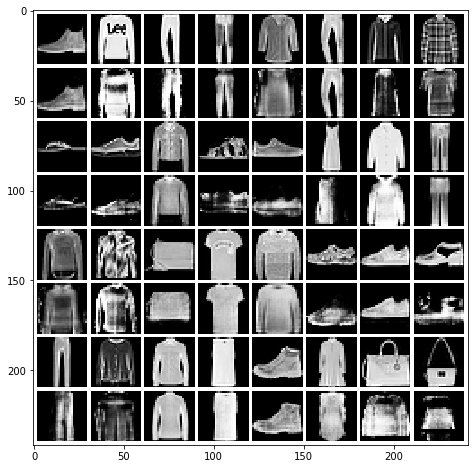

Registered:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


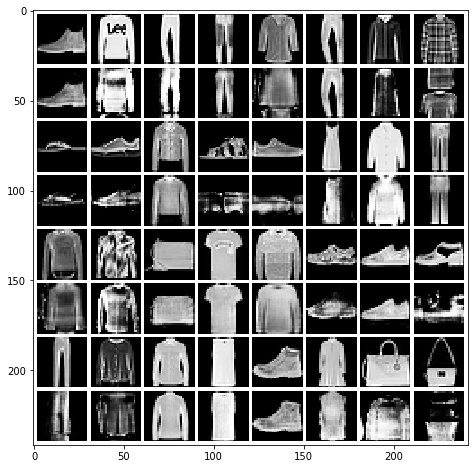

In [31]:
# Benchmark results

print("Output under minimized magnitude distance:")

to_plot = np.stack([out_original[:32].reshape(4, 8, 28, 28), 
                    out_results[:32].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)         
plot_grid(to_plot, figsize=(8, 8),
          file="../out/vae/fashion/{0}{1}.png".format('randomInit_{}_'.format(test_str), time.strftime("%Y%m%d_%H%M%S")))

print("Registered:")
results_reg = register_croco(out_results[:32], out_original[:32])
to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                    results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
plot_grid(to_plot, figsize=(8,8),
          file="../out/vae/fashion/{0}{1}.png".format('randomInit_{}_reg'.format(test_str), time.strftime("%Y%m%d_%H%M%S")))

In [17]:
benchmark(pred=out_results, true=out_original, check_all=True)

Signal error:
  MSE: 0.07461498913907694, std: 0.05785176095552319
  MAE: 0.14293998535917668, std: 0.06968954905462248
  SSIM: 0.4292548251119931, std: 0.2306693700747248
  PhCo-MSE: 0.04740772327444014, std: 0.0439875682643269
  PhCo-MAE: 0.11160055787848522, std: 0.06337126132896084
  PhCo-SSIM: 0.5595454180667985, std: 0.24314278033865638
  CroCo-MSE: 0.03168628689460004, std: 0.01908567695777654
  CroCo-MAE: 0.09105655380840577, std: 0.039104768675682466
  CroCo-SSIM: 0.62211081810161, std: 0.18246265056119754

Magnitude error:
  MSE Magnitude: 3.761498712487474, std: 3.1488131641855275

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.07461 | 0.1429 | 0.4293 | 0.04741 | 0.1116 | 0.5595 | 0.03169 | 0.09106 | 0.6221 | 3.761 |


## Test Fourier magnitudes random init (32 samples)

| Nr Type | iterations | restarts | lr | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | 10000 | 3 | 1e-1 |
| 2 | 10000 | 3 | 1e-1 | 
| 3 | 10000 | 3 | 1e-1 | 0.05465 | 0.1190 | 0.5148 | 0.03933 | 0.1015 | 0.6286 | 0.02507 | 0.08038 | 0.6892 | 1.567 |
| 4 | 10000 | 3 | 1e-1 | 
| 5 | 10000 | 3 | 1e-1 | 0.06810 | 0.1340 | 0.4415 | 0.03937 | 0.1000 | 0.6018 | 0.03022 | 0.08753 | 0.6505 | 2.159 |
| 6 | 10000 | 3 | 1e-1 | 0.06956 | 0.1399 | 0.4405 | 0.05649 | 0.1237 | 0.5778 | 0.03527 | 0.09659 | 0.6380 | 1.997 |
| 7 | 10000 | 3 | 1e-1 | 0.07461 | 0.1429 | 0.4293 | 0.04741 | 0.1116 | 0.5595 | 0.03169 | 0.09106 | 0.6221 | 3.761 |


## Test Fourier magnitudes random init (1024 samples)

| Nr Type | iterations | restarts | lr | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 3 | 10000 | 3 | 1e-1 | 0.06240 | 0.1290 | 0.4820 | 0.04760 | 0.1114 | 0.5943 | 0.02797 | 0.08562 | 0.6602 | 1.584 |
| 5 | 10000 | 3 | 1e-1 | 0.06590 | 0.1335 | 0.4473 | 0.04995 | 0.1144 | 0.5632 | 0.03022 | 0.08832 | 0.6390 | 2.207 |


Batch 1/32 finished
Batch 2/32 finished
Batch 3/32 finished
Batch 4/32 finished
Batch 5/32 finished
Batch 6/32 finished
Batch 7/32 finished
Batch 8/32 finished
Batch 9/32 finished
Batch 10/32 finished
Batch 11/32 finished
Batch 12/32 finished
Batch 13/32 finished
Batch 14/32 finished
Batch 15/32 finished
Batch 16/32 finished
Batch 17/32 finished
Batch 18/32 finished
Batch 19/32 finished
Batch 20/32 finished
Batch 21/32 finished
Batch 22/32 finished
Batch 23/32 finished
Batch 24/32 finished
Batch 25/32 finished
Batch 26/32 finished
Batch 27/32 finished
Batch 28/32 finished
Batch 29/32 finished
Batch 30/32 finished
Batch 31/32 finished
Batch 32/32 finished


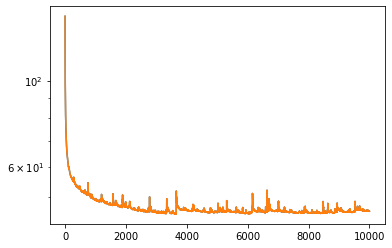

In [34]:
### Test one sample Fourier magnitudes with end-to-end init ###

num_batches = 32
batch_size = 32
max_steps = 10000
max_loss = 0.0
optim_lr= 1e-1

###

out_original = np.zeros((batch_size * num_batches, *imsize))
out_results = np.zeros((batch_size * num_batches, *imsize))
mse_all = np.full((batch_size * num_batches), np.inf)

for batch_i, batch in enumerate(dataloader['test']):
    test_sample = batch.to(device)
    test_magnitudes = calc_mags(test_sample)
    out_original[batch_size * batch_i : batch_size * batch_i + batch_size] = test_sample.cpu().numpy()

    fcnet.to(device)
    fcnet.eval()
    init_x = fcnet(test_magnitudes).detach()

    cur_out_results, cur_loss, cur_mse_all = vaeopt(sample_magnitudes=test_magnitudes, vae=vae, device=device,
                                                    init_x=init_x, z_shape=(latent_dim, ), optim_lr=optim_lr,
                                                    max_steps=max_steps, max_loss=max_loss)
    cur_out_results = cur_out_results.cpu().numpy()
    
    out_results[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_out_results
    mse_all[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_mse_all.detach().cpu().numpy()
    
    print("Batch {0}/{1} finished".format(batch_i + 1, num_batches))
    if batch_i + 1 >= num_batches:
        break

plt.plot(cur_loss)
plt.semilogy(cur_loss)
plt.show()

In [35]:
### CACHE RESULTS ###

import pickle
pickle.dump(out_original, open("/home/shared/phase-retrieval/test/VAE_Fashion/e2eInit_original_5_1024.p", "wb"))
pickle.dump(out_results, open("/home/shared/phase-retrieval/test/VAE_Fashion/e2eInit_5_1024.p", "wb"))

In [42]:
### LOAD RESULTS ###
import pickle

test_str = "5_1024"

out_original = pickle.load(open("/home/shared/phase-retrieval/test/VAE_Fashion/e2eInit_original_{}.p".format(test_str), "rb"))
out_results = pickle.load(open("/home/shared/phase-retrieval/test/VAE_Fashion/e2eInit_{}.p".format(test_str), "rb"))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Output under minimized magnitude distance:


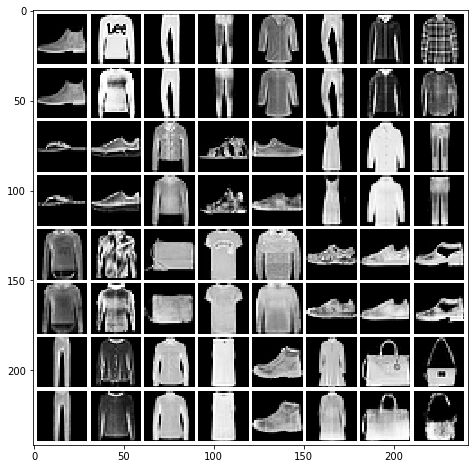

Registered:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


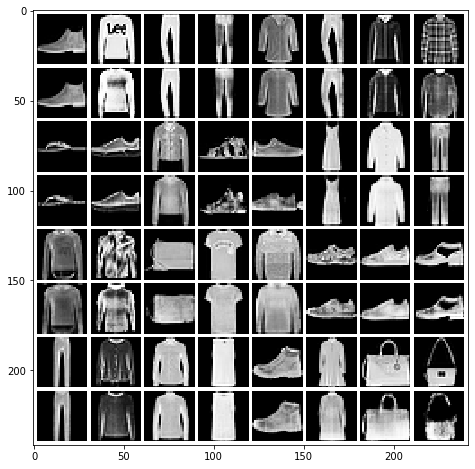

In [43]:
# Benchmark results

print("Output under minimized magnitude distance:")

to_plot = np.stack([out_original[:32].reshape(4, 8, 28, 28), 
                    out_results[:32].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)         
plot_grid(to_plot, figsize=(8, 8),
          file="../out/vae/fashion/{0}{1}.png".format('e2eInit_{}_'.format(test_str), time.strftime("%Y%m%d_%H%M%S")))

print("Registered:")
results_reg = register_croco(out_results[:32], out_original[:32])
to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                    results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
plot_grid(to_plot, figsize=(8,8),
          file="../out/vae/fashion/{0}{1}.png".format('e2eInit_{}_reg'.format(test_str), time.strftime("%Y%m%d_%H%M%S")))

In [44]:
benchmark(pred=out_results, true=out_original, check_all=True)

Signal error:
  MSE: 0.017767029329739843, std: 0.021254023884131043
  MAE: 0.0588157761613329, std: 0.04004671176339104
  SSIM: 0.7699469708951221, std: 0.19035282399269782
  PhCo-MSE: 0.013655269521772696, std: 0.019946496503894063
  PhCo-MAE: 0.05306151422623814, std: 0.04035858534118332
  PhCo-SSIM: 0.8017056107896392, std: 0.18458592428909987
  CroCo-MSE: 0.011582567470863303, std: 0.01376222439758662
  CroCo-MAE: 0.04973034954515913, std: 0.03267633450289362
  CroCo-SSIM: 0.8158212761055794, std: 0.1568699225515634

Magnitude error:
  MSE Magnitude: 1.249571082432381, std: 1.2916663133075577

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01777 | 0.05882 | 0.7699 | 0.01366 | 0.05306 | 0.8017 | 0.01158 | 0.04973 | 0.8158 | 1.250 |


## Test Fourier magnitudes end-to-end init (32 samples)

| Nr Type | iterations | lr | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | 10000 | 1e-1 | 
| 2 | 10000 | 1e-1 | 
| 3 | 10000 | 1e-1 | 0.01748 | 0.06099 | 0.7664 | 0.01531 | 0.05734 | 0.7939 | 0.01244 | 0.05333 | 0.8137 | 1.248 |
| 4 | 10000 | 1e-1 | 
| 5 | 10000 | 1e-1 | 0.01337 | 0.05162 | 0.8087 | 0.01087 | 0.04767 | 0.8346 | 0.01080 | 0.04751 | 0.8355 | 1.314 |
| 5 | 50000 | 1e-1 | 0.01366 | 0.05221 | 0.8082 | 
| 6 | 10000 | 1e-1 | 0.01758 | 0.06199 | 0.7686 | 0.01168 | 0.05259 | 0.8207 | 0.01136 | 0.05192 | 0.8258 | 1.238 |


## Test Fourier magnitudes end-to-end init (1024 samples)

| Nr Type | iterations | restarts | lr | MSE | MAE | SSIM | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magnitude
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 5 | 10000 | 3 | 1e-1 |  0.01777 | 0.05882 | 0.7699 | 0.01366 | 0.05306 | 0.8017 | 0.01158 | 0.04973 | 0.8158 | 1.250 |
